In [37]:
INPUT_VARS = ['age_cal','sex','weight','height', 'cuffed','size', 'depth']
df = pickle.load(open('dataset/df-outliers3', 'rb'))
df.rename(columns={'airway_tube_size':'size'}, inplace=True)
df.rename(columns={'fixed':'depth'}, inplace=True)

df[INPUT_VARS].to_csv('dataset/data_size.csv')
df[INPUT_VARS].loc[1:15].to_csv('dataset/sample.csv')

# Input loading

In [3]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import explained_variance_score, mean_squared_error, mean_absolute_error, r2_score
from sklearn.utils import shuffle
import pandas as pd
import xgboost as xgb
import numpy as np
import random, os, datetime, pickle
import scipy, csv, math
import matplotlib.pyplot as plt
import numpy as np


dat = np.load(f'dataset/ETT_depth-outliers.npz')
df = pickle.load(open('dataset/ETT_depth-outliers', 'rb'))
x, y = dat['x'], dat['y']
x = x[:,0:5]
y_old = dat['y_old']


# training set의 뒤쪽 20%를 test set 으로 사용 (이미 shuffle된 상태)
nsamp = len(y)
ntest = int(nsamp * 0.2)
ntrain = nsamp - ntest
x_test = x[-ntest:, :]
y_test = y[-ntest:]
y_test_old = y_old[-ntest:]
y_pals = 3 * y_test_old
x_train = x[:ntrain, :]
y_train = y[:ntrain]

print(f'x_train: {(x_train).shape}, x_test: {x_test.shape}')

x_train: (21344, 5), x_test: (5335, 5)


In [4]:
x_train = x_train[:,0:4]
x_test = x_test[:,0:4]

print(f'x_train: {(x_train).shape}, x_test: {x_test.shape}')

x_train: (21344, 4), x_test: (5335, 4)


In [38]:
def adherence(predict, depth, size):
    if size >= 6.5:
        return (predict <= depth + 1) and (predict >= depth - 1)
    elif size >= 4.5:
        return (predict <= depth + 0.5) and (predict >= depth - 0.5)
    else:
        return (predict <= depth + 0.25) and (predict >= depth - 0.25)
    
VAR = 'old_depth1'
df['adherence'] = df.apply(lambda x: adherence(x[VAR], x['fixed'], x['airway_tube_size']), axis=1)

y_ad = df.loc[ntrain:, 'adherence'].values
#print(f'{VAR}: train {df.loc[:ntrain, 'adherence'].mean():.3f}, test {df.loc[:ntest, 'adherence'].mean():.3f}')

### Adherence in tolerance level

In [40]:
OLD_VAR = 'old_depth1'
# OLD_VAR = 'old_tube_size'
df[OLD_VAR] = 3 * df['airway_tube_size']
y_old = df[[OLD_VAR]].values.flatten().astype(float)
y_test_old = y_old[-ntest:]

print('--------------')
print('old model = 3 * ETT size')
print('--------------')

y1_trads = []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x_test))])
    X_test = x_test[mask]
    Y_test = y_test[mask]
    
    
    y_trad = y_ad[mask]
    y1_trads.append(np.mean(y_trad))

print(f'accuracy in tolerance level: {np.mean(y1_trads):.3f}+-{1.96*np.std(y1_trads):.3f} -> {np.mean(y1_trads)-1.96*np.std(y1_trads):.3f} ~ {np.mean(y1_trads)+1.96*np.std(y1_trads):.3f}')

--------------
old model = 3 * ETT size
--------------
accuracy in tolerance level: 0.325+-0.012 -> 0.313 ~ 0.338


# PALS guideline

In [11]:
OLD_VAR = 'old_depth1'
df[OLD_VAR] = 3 * df['old_tube_size']
#df[OLD_VAR] = df['airway_tube_size'].apply(lambda x: np.round((x / 4 + 4) * 2) / 2 if x >= 2 else (3.5 if x < 1 else 4)) 
#df[OLD_VAR] = df.apply(lambda x: x[OLD_VAR] - 0.5 if x['cuffed'] else x[OLD_VAR], axis=1)
y_old = df[[OLD_VAR]].values.flatten().astype(float)
y_test_old = y_old[-ntest:]

print('--------------')
print('old model = 3 * age-based ETT size')
print('--------------')
print(f'explained_variance_score: {explained_variance_score(y_test, y_test_old):.3f}')
print(f'mean_squared_errors: {mean_squared_error(y_test, y_test_old):.3f}')
print(f'mean_absolute_errors: {mean_absolute_error(y_test, y_test_old):.3f}')
print(f'r2_score: {r2_score(y_test, y_test_old):.3f}')

# accuracy
acc3 = np.mean((y_test_old >= y_test-1) & (y_test_old <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

--------------
old model = 3 * age-based ETT size
--------------
explained_variance_score: 0.745
mean_squared_errors: 2.062
mean_absolute_errors: 1.138
r2_score: 0.689
acc(+-1cm): 0.604


In [12]:
OLD_VAR = 'old_depth1'
# OLD_VAR = 'old_tube_size'
df[OLD_VAR] = 3 * df['airway_tube_size']
#df[OLD_VAR] = df['airway_tube_size'].apply(lambda x: np.round((x / 4 + 4) * 2) / 2 if x >= 2 else (3.5 if x < 1 else 4)) 
#df[OLD_VAR] = df.apply(lambda x: x[OLD_VAR] - 0.5 if x['cuffed'] else x[OLD_VAR], axis=1)
y_old = df[[OLD_VAR]].values.flatten().astype(float)
y_test_old = y_old[-ntest:]

print('--------------')
print('old model = 3 * ETT size')
print('--------------')
print(f'explained_variance_score: {explained_variance_score(y_test, y_test_old):.3f}')
print(f'mean_squared_errors: {mean_squared_error(y_test, y_test_old):.3f}')
print(f'mean_absolute_errors: {mean_absolute_error(y_test, y_test_old):.3f}')
print(f'r2_score: {r2_score(y_test, y_test_old):.3f}')

# accuracy
acc3 = np.mean((y_test_old >= y_test-1) & (y_test_old <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

--------------
old model = 3 * ETT size
--------------
explained_variance_score: 0.682
mean_squared_errors: 2.422
mean_absolute_errors: 1.224
r2_score: 0.635
acc(+-1cm): 0.580


In [39]:
OLD_VAR = 'old_depth1'
# OLD_VAR = 'old_tube_size'
df[OLD_VAR] = df['age_cal'] / 2 + 12
#df[OLD_VAR] = df['age'].apply(lambda x: x / 2 + 12 if x >= 2 else (11 if x > 1 else (10 if x > 0.5 else 9))) 
#df[OLD_VAR] = df.apply(lambda x: x[OLD_VAR] - 0.5 if x['cuffed'] else x[OLD_VAR], axis=1)
y_old = df[[OLD_VAR]].values.flatten().astype(float)
y_test_old = y_old[-ntest:]

print('--------------')
print('old model = age / 2 + 12')
print('--------------')
print(f'explained_variance_score: {explained_variance_score(y_test, y_test_old):.3f}')
print(f'mean_squared_errors: {mean_squared_error(y_test, y_test_old):.3f}')
print(f'mean_absolute_errors: {mean_absolute_error(y_test, y_test_old):.3f}')
print(f'r2_score: {r2_score(y_test, y_test_old):.3f}')

# accuracy
acc3 = np.mean((y_test_old >= y_test-1) & (y_test_old <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

--------------
old model = age / 2 + 12
--------------
explained_variance_score: 0.697
mean_squared_errors: 2.013
mean_absolute_errors: 1.143
r2_score: 0.697
acc(+-1cm): 0.504


In [22]:
OLD_VAR = 'old_depth1'
# OLD_VAR = 'old_tube_size'
df[OLD_VAR] = df['age'] / 2 + 12
#df[OLD_VAR] = df['age'].apply(lambda x: x / 2 + 12 if x >= 2 else (11 if x > 1 else (10 if x > 0.5 else 9))) 
#df[OLD_VAR] = df.apply(lambda x: x[OLD_VAR] - 0.5 if x['cuffed'] else x[OLD_VAR], axis=1)
y_old = df[[OLD_VAR]].values.flatten().astype(float)
y_test_old = y_old[-ntest:]

print('--------------')
print('old model = age / 2 + 12')
print('--------------')
print(f'explained_variance_score: {explained_variance_score(y_test, y_test_old):.3f}')
print(f'mean_squared_errors: {mean_squared_error(y_test, y_test_old):.3f}')
print(f'mean_absolute_errors: {mean_absolute_error(y_test, y_test_old):.3f}')
print(f'r2_score: {r2_score(y_test, y_test_old):.3f}')

# accuracy
acc3 = np.mean((y_test_old >= y_test-1) & (y_test_old <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

--------------
old model = age / 2 + 12
--------------
explained_variance_score: 0.681
mean_squared_errors: 2.159
mean_absolute_errors: 1.182
r2_score: 0.675
acc(+-1cm): 0.588


In [24]:
OLD_VAR = 'old_depth1'
# OLD_VAR = 'old_tube_size'
#df[OLD_VAR] = df['age'] / 2 + 12
df[OLD_VAR] = df['age'].apply(lambda x: x / 2 + 12 if x >= 2 else (11 if x > 1 else (10 if x > 0.5 else 9))) 
#df[OLD_VAR] = df.apply(lambda x: x[OLD_VAR] - 0.5 if x['cuffed'] else x[OLD_VAR], axis=1)
y_old = df[[OLD_VAR]].values.flatten().astype(float)
y_test_old = y_old[-ntest:]

print('--------------')
print('old model = age / 2 + 12')
print('--------------')
print(f'explained_variance_score: {explained_variance_score(y_test, y_test_old):.3f}')
print(f'mean_squared_errors: {mean_squared_error(y_test, y_test_old):.3f}')
print(f'mean_absolute_errors: {mean_absolute_error(y_test, y_test_old):.3f}')
print(f'r2_score: {r2_score(y_test, y_test_old):.3f}')

# accuracy
acc3 = np.mean((y_test_old >= y_test-1) & (y_test_old <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

--------------
old model = age / 2 + 12
--------------
explained_variance_score: 0.771
mean_squared_errors: 3.581
mean_absolute_errors: 1.546
r2_score: 0.461
acc(+-1cm): 0.463


In [ ]:
OLD_VAR = 'old_depth1'
# OLD_VAR = 'old_tube_size'
#df[OLD_VAR] = df['age'] / 2 + 12
df[OLD_VAR] = df.apply(lambda x: x['age'] / 2 + 12 if x['age'] > 1 else x['weight'] / 2 + 8, axis=1) 
#df[OLD_VAR] = df.apply(lambda x: x[OLD_VAR] - 0.5 if x['cuffed'] else x[OLD_VAR], axis=1)
y_old = df[[OLD_VAR]].values.flatten().astype(float)
y_test_old = y_old[-ntest:]

print('--------------')
print('old model = age / 2 + 12')
print('--------------')
print(f'explained_variance_score: {explained_variance_score(y_test, y_test_old):.3f}')
print(f'mean_squared_errors: {mean_squared_error(y_test, y_test_old):.3f}')
print(f'mean_absolute_errors: {mean_absolute_error(y_test, y_test_old):.3f}')
print(f'r2_score: {r2_score(y_test, y_test_old):.3f}')

# accuracy
acc3 = np.mean((y_test_old >= y_test-1) & (y_test_old <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

### test validation

In [25]:
OLD_VAR = 'old_depth1'
# OLD_VAR = 'old_tube_size'
df[OLD_VAR] = 3 * df['airway_tube_size']
y_old = df[[OLD_VAR]].values.flatten().astype(float)
y_test_old = y_old[-ntest:]

print('--------------')
print('old model = 3 * ETT size')
print('--------------')

y1_trads, y2_trads, y3_trads = [], [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x_test))])
    X_test = x_test[mask]
    Y_test = y_test[mask]
    
    y_trad = y_test_old[mask]
    y1_trads.append(mean_absolute_error(y_trad, Y_test))
    y2_trads.append(mean_squared_error(y_trad, Y_test)**0.5)
    y3_trads.append(np.mean((y_trad >= Y_test-1) & (y_trad <= Y_test+1)))
    
print(f'mae: {np.mean(y1_trads):.3f}+-{1.96*np.std(y1_trads):.3f} -> {np.mean(y1_trads)-1.96*np.std(y1_trads):.3f} ~ {np.mean(y1_trads)+1.96*np.std(y1_trads):.3f}')
print(f'rmse: {np.mean(y2_trads):.3f}+-{1.96*np.std(y2_trads):.3f} -> {np.mean(y2_trads)-1.96*np.std(y2_trads):.3f} ~ {np.mean(y2_trads)+1.96*np.std(y2_trads):.3f}')
print(f'acc(+-1cm): {np.mean(y3_trads):.3f}+-{1.96*np.std(y3_trads):.3f} -> {np.mean(y3_trads)-1.96*np.std(y3_trads):.3f} ~ {np.mean(y3_trads)+1.96*np.std(y3_trads):.3f} ')

--------------
old model = 3 * ETT size
--------------
mae: 1.224+-0.027 -> 1.196 ~ 1.251
rmse: 1.556+-0.029 -> 1.526 ~ 1.585
acc(+-1cm): 0.580+-0.014 -> 0.565 ~ 0.594 


In [27]:
OLD_VAR = 'old_depth1'
# OLD_VAR = 'old_tube_size'
df[OLD_VAR] = df['age'] / 2 + 12
y_old = df[[OLD_VAR]].values.flatten().astype(float)
y_test_old = y_old[-ntest:]

print('--------------')
print('old model = age/2 + 12')
print('--------------')

y1_trads, y2_trads, y3_trads = [], [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x_test))])
    X_test = x_test[mask]
    Y_test = y_test[mask]
    
    y_trad = y_test_old[mask]
    y1_trads.append(mean_absolute_error(y_trad, Y_test))
    y2_trads.append(mean_squared_error(y_trad, Y_test)**0.5)
    y3_trads.append(np.mean((y_trad >= Y_test-1) & (y_trad <= Y_test+1)))
    
print(f'mae: {np.mean(y1_trads):.3f}+-{1.96*np.std(y1_trads):.3f} -> {np.mean(y1_trads)-1.96*np.std(y1_trads):.3f} ~ {np.mean(y1_trads)+1.96*np.std(y1_trads):.3f}')
print(f'rmse: {np.mean(y2_trads):.3f}+-{1.96*np.std(y2_trads):.3f} -> {np.mean(y2_trads)-1.96*np.std(y2_trads):.3f} ~ {np.mean(y2_trads)+1.96*np.std(y2_trads):.3f}')
print(f'acc(+-1cm): {np.mean(y3_trads):.3f}+-{1.96*np.std(y3_trads):.3f} -> {np.mean(y3_trads)-1.96*np.std(y3_trads):.3f} ~ {np.mean(y3_trads)+1.96*np.std(y3_trads):.3f} ')

--------------
old model = age/2 + 12
--------------
mae: 1.183+-0.023 -> 1.160 ~ 1.206
rmse: 1.470+-0.023 -> 1.447 ~ 1.494
acc(+-1cm): 0.588+-0.013 -> 0.575 ~ 0.602 


# Linear regression

In [3]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer


imp = IterativeImputer().fit(x_train)
x_train_imputed = imp.transform(x_train)
x_test_imputed = imp.transform(x_test)

print(f'x_train: {x_train_imputed.shape}, x_test: {x_test_imputed.shape}')

x_train: (21344, 4), x_test: (5335, 4)


In [4]:
from sklearn.linear_model import LinearRegression
lin_model = LinearRegression()
lin_model.fit(x_train_imputed, y_train)
y_pred = lin_model.predict(x_test_imputed)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f'선형회귀 모델: 기울기 {lin_model.coef_}, 절편 {lin_model.intercept_:.3f}')
print('--------------')
print('linear regression model')
print('--------------')
print(f'explained_variance_score: {explained_variance_score(y_test, y_pred):.3f}')
print(f'mean_squared_errors: {mean_squared_error(y_test, y_pred):.3f}')
print(f'mean_absolute_errors: {mean_absolute_error(y_test, y_pred):.3f}')
print(f'r2_score: {r2_score(y_test, y_pred):.3f}')
# accuracy
acc3 = np.mean((y_pred >= y_test-1) & (y_pred <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

선형회귀 모델: 기울기 [ 0.07824905  0.13809943 -0.00204921  0.08829016], 절편 5.207
--------------
linear regression model
--------------
explained_variance_score: 0.869
mean_squared_errors: 0.871
mean_absolute_errors: 0.744
r2_score: 0.869
acc(+-1cm): 0.716


In [8]:
# save model
odir_f = f'mae-{mae:.3f}_mse-{mse:.3f}_LR-4inputs'
odir = f'result/outliers+w+h/depth/{odir_f}'
if not os.path.exists(odir):
    os.mkdir(odir)

# 모델에 대한 정보 txt로 저장
pickle.dump(lin_model, open(f'{odir}/model', 'wb'))
f = open(f'{odir}/result.txt', 'w')
f.write(f'classification model')
f.write(f'explained_variance_score: {explained_variance_score(y_test, y_pred):.3f}')
f.write(f'mean_squared_errors: {mean_squared_error(y_test, y_pred):.3f}')
f.write(f'mean_absolute_errors: {mean_absolute_error(y_test, y_pred):.3f}')
f.write(f'r2_score: {r2_score(y_test, y_pred):.3f}')
f.close()

### test validation

In [6]:
# LR model
lr = pickle.load(open(f'result/outliers+w+h/depth/mae-0.744_mse-0.871_LR-4inputs/model','rb'))

y1_lrs, y2_lrs, y3_lrs = [], [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x_test_imputed))])
    X_test = x_test_imputed[mask]
    Y_test = y_test[mask]
    
    y_lr = lr.predict(X_test)
    y1_lrs.append(mean_absolute_error(y_lr, Y_test))
    y2_lrs.append(mean_squared_error(y_lr, Y_test)**0.5)
    y3_lrs.append(np.mean((y_lr >= Y_test-1) & (y_lr <= Y_test+1)))
    
print(f'mae: {np.mean(y1_lrs):.3f}+-{1.96*np.std(y1_lrs):.3f} -> {np.mean(y1_lrs)-1.96*np.std(y1_lrs):.3f} ~ {np.mean(y1_lrs)+1.96*np.std(y1_lrs):.3f}')
print(f'rmse: {np.mean(y2_lrs):.3f}+-{1.96*np.std(y2_lrs):.3f} -> {np.mean(y2_lrs)-1.96*np.std(y2_lrs):.3f} ~ {np.mean(y2_lrs)+1.96*np.std(y2_lrs):.3f}')
print(f'acc(+-1cm): {np.mean(y3_lrs):.3f}+-{1.96*np.std(y3_lrs):.3f} -> {np.mean(y3_lrs)-1.96*np.std(y3_lrs):.3f} ~ {np.mean(y3_lrs)+1.96*np.std(y3_lrs):.3f} ')

mae: 0.743+-0.015 -> 0.728 ~ 0.758
rmse: 0.933+-0.018 -> 0.915 ~ 0.950
acc(+-1cm): 0.716+-0.013 -> 0.704 ~ 0.729 


# XGBoost

In [2]:
x_train = x_train[:,0:4]
x_test = x_test[:,0:4]

print(f'x_train: {(x_train).shape}, x_test: {x_test.shape}')

x_train: (21344, 4), x_test: (5335, 4)


In [28]:
# 길이 제한 없는 경우
from sklearn.metrics import mean_absolute_error

# age (일단위)
param_dict = {
                'learning_rate': [ 0.05, 0.07, 0.1], #[0.01, 0.03, 0.05],
                'max_depth': [3, 4, 5, 7],#[3,4,5],
                'n_estimators': [25, 50, 100, 200, 300],
                #'n_estimators': [100],#[25, 50, 75, 100],
                #'n_estimators': [50],
                'subsample': [0.5, 0.8, 1], #[0.5, 0.8, 1],
                'colsample_bytree': [0.5, 0.8], #[0.8, 1],
                #'gamma': [0.9], #[0.3, 0.5, 0.7, 0.9],
                #'scale_pos_weight': [5, 10], #[1,10,30,100]
            }
nfold = 10
gs = GridSearchCV(estimator=xgb.sklearn.XGBRegressor(),
                    n_jobs=-1,
                    verbose=2,
                    param_grid=param_dict, cv=nfold)
gs.fit(x_train, y_train)
model = gs.best_estimator_.get_booster()

print()
print("========= found hyperparameter =========")
print(gs.best_params_)
print(gs.best_score_)
print("========================================")

y_pred = gs.predict(x_test).flatten()
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print('--------------')
print('new model')
print('--------------')
print(f'explained_variance_score: {explained_variance_score(y_test, y_pred):.3f}')
print(f'mean_squared_errors: {mse:.3f}')
print(f'mean_absolute_errors: {mae:.3f}')
print(f'r2_score: {r2_score(y_test, y_pred):.3f}')
# accuracy
acc3 = np.mean((y_pred >= y_test-1) & (y_pred <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

Fitting 10 folds for each of 360 candidates, totalling 3600 fits
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=25, subsample=0.5; total time=   0.7s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=50, subsample=1; total time=   0.3s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=100, subsample=0.8; total time=   0.8s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=300, subsample=0.5; total time=   2.4s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=4, n_estimators=100, subsample=0.8; total time=   1.0s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=4, n_estimators=200, subsample=0.8; total time=   2.0s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=25, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=25, subsample=0.8; total time=   0.3s
[CV] END cols

In [29]:
# save model
odir_f = f'mae-{mae:.3f}_mse-{mse:.3f}_XGBR-4inputs_{nfold}fold'
odir = f'result/outliers+w+h/depth/{odir_f}'
if not os.path.exists(odir):
    os.mkdir(odir)
model.save_model(f'{odir}/model.model')
pickle.dump(gs, open(f'{odir}/gridSearch','wb'))

# 모델에 대한 정보 txt로 저장
pickle.dump(param_dict, open(f'{odir}/param_dict', 'wb'))
f = open(f'{odir}/result.txt', 'w')
f.write(f'classification model')
f.write(f'explained_variance_score: {explained_variance_score(y_test, y_pred):.3f}')
f.write(f'mean_squared_errors: {mean_squared_error(y_test, y_pred):.3f}')
f.write(f'mean_absolute_errors: {mean_absolute_error(y_test, y_pred):.3f}')
f.write(f'r2_score: {r2_score(y_test, y_pred):.3f}')
f.close()

### test validation

In [11]:
# xgbr model
xgbr = xgb.XGBRegressor()
xgbr.load_model('result/outliers+w+h/depth/mae-0.720_mse-0.814_XGBR-4inputs_10fold/model.model')


y1_xgbrs, y2_xgbrs, y3_xgbrs = [], [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x_test))])
    X_test = x_test[mask]
    Y_test = y_test[mask]
    
    y_xgbr = xgbr.predict(X_test)
    y1_xgbrs.append(mean_absolute_error(y_xgbr, Y_test))
    y2_xgbrs.append(mean_squared_error(y_xgbr, Y_test)**0.5)
    y3_xgbrs.append(np.mean((y_xgbr >= Y_test-1) & (y_xgbr <= Y_test+1)))
    
print(f'mae: {np.mean(y1_xgbrs):.3f}+-{1.96*np.std(y1_xgbrs):.3f} -> {np.mean(y1_xgbrs)-1.96*np.std(y1_xgbrs):.3f} ~ {np.mean(y1_xgbrs)+1.96*np.std(y1_xgbrs):.3f}')
print(f'rmse: {np.mean(y2_xgbrs):.3f}+-{1.96*np.std(y2_xgbrs):.3f} -> {np.mean(y2_xgbrs)-1.96*np.std(y2_xgbrs):.3f} ~ {np.mean(y2_xgbrs)+1.96*np.std(y2_xgbrs):.3f}')
print(f'acc(+-1cm): {np.mean(y3_xgbrs):.3f}+-{1.96*np.std(y3_xgbrs):.3f} -> {np.mean(y3_xgbrs)-1.96*np.std(y3_xgbrs):.3f} ~ {np.mean(y3_xgbrs)+1.96*np.std(y3_xgbrs):.3f} ')

/home/painstudy/.local/lib/python3.8/site-packages/xgboost/sklearn.py:782: UserWarning: Loading a native XGBoost model with Scikit-Learn interface.
  warnings.warn("Loading a native XGBoost model with Scikit-Learn interface.")


mae: 0.720+-0.014 -> 0.706 ~ 0.734
rmse: 0.902+-0.016 -> 0.886 ~ 0.918
acc(+-1cm): 0.729+-0.012 -> 0.717 ~ 0.741 


In [45]:
# xgbr model
xgbr = xgb.XGBRegressor()
xgbr.load_model('result/outliers+w+h/depth/mae-0.720_mse-0.814_XGBR-4inputs_10fold/model.model')


VAR = 'predict'
df.loc[ntrain:, VAR] = xgbr.predict(x_test)
df['adherence'] = df.apply(lambda x: adherence(x[VAR], x['fixed'], x['airway_tube_size']), axis=1)

y_ad = df.loc[ntrain:, 'adherence'].values

y1_trads = []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x_test))])
    X_test = x_test[mask]
    Y_test = y_test[mask]
    
    
    y_trad = y_ad[mask]
    y1_trads.append(np.mean(y_trad))

print(f'accuracy in tolerance level: {np.mean(y1_trads):.3f}+-{1.96*np.std(y1_trads):.3f} -> {np.mean(y1_trads)-1.96*np.std(y1_trads):.3f} ~ {np.mean(y1_trads)+1.96*np.std(y1_trads):.3f}')

accuracy in tolerance level: 0.355+-0.013 -> 0.342 ~ 0.368


In [46]:
df

,opid,sex,age,airway_tube_size,airway_tube_type,airway_lma,weight,height,hid,age_cal,opdate,birth_date,fixed,cuffed,old_tube_size,old_depth1,adherence,predict
0,80214103,False,9,6.5,plain,NaN,25.00,NaN,74961656,9.169251,2008-02-14,1998-12-14,17.0,False,6.0,19.5,False,NaN
1,130315153,True,0,3.5,plain,NaN,5.30,60.0,77020321,0.167012,2013-03-15,2013-01-13,10.0,False,3.5,10.5,False,NaN
2,170102153,True,1,4.0,plain,NaN,10.10,78.0,78082377,1.144445,2017-01-02,2015-11-11,10.5,False,4.0,12.0,False,NaN
3,100406100,True,0,3.0,plain,NaN,NaN,51.5,75872021,0.054758,2010-04-06,2010-03-17,10.0,False,3.5,9.0,False,NaN
4,161027127,False,5,5.0,plain,NaN,18.65,107.4,76875597,5.407366,2016-10-27,2011-06-01,14.0,False,5.0,15.0,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26674,90514091,True,2,4.5,plain,NaN,11.30,82.8,75509758,2.362814,2009-05-14,2007-01-02,14.0,False,4.5,13.5,False,13.442465
26675,150624116,True,0,4.5,plain,NaN,9.50,74.6,77699152,0.788517,2015-06-24,2014-09-09,11.0,False,3.5,13.5,False,11.766949
26676,110305021,False,4,5.0,plain,NaN,16.00,99.0,74778669,4.536712,2011-03-05,2006-08-21,15.0,False,5.0,15.0,True,14.541611
26677,210813129,True,9,6.0,plain,NaN,24.20,128.8,76544583,9.607316,2021-08-13,2012-01-04,16.0,True,5.5,18.0,False,17.381237


# RF

In [ ]:
x_train = x_train[:,0:4]
x_test = x_test[:,0:4]

print(f'x_train: {(x_train).shape}, x_test: {x_test.shape}')

In [182]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imp = IterativeImputer().fit(x_train)
x_train_imputed = imp.transform(x_train)
x_test_imputed = imp.transform(x_test)

print(f'x_train shape: {x_train_imputed.shape}, x_test shape: {x_test_imputed.shape}')

x_train shape: (21344, 4), x_test shape: (5335, 4)


In [185]:
from sklearn.ensemble import RandomForestRegressor

SEED = 98
param_dict = {
                #'learning_rate': [ 0.05, 0.07, 0.1], #[0.01, 0.03, 0.05],
                'max_depth': [None, 3, 5, 7],#[3,4,5],
                'max_leaf_nodes': [None, 3, 5, 7],
                'n_estimators': [50, 100, 200, 300],
                'max_features': ['auto', 'sqrt', 'log2'],
                #'n_estimators': [100],#[25, 50, 75, 100],
                #'n_estimators': [50],
                'min_samples_split': [2,3,5],
                'min_samples_leaf': [1,2,3],
               'bootstrap': [True, False]
                #'gamma': [0.9], #[0.3, 0.5, 0.7, 0.9],
                #'scale_pos_weight': [5, 10], #[1,10,30,100]
            }
nfold = 10
gs = GridSearchCV(estimator=RandomForestRegressor(random_state = SEED),
                    n_jobs=-1,
                    verbose=3,
                    param_grid=param_dict, cv=nfold)
gs.fit(x_train_imputed, y_train)
#model = gs.best_estimator_.get_booster()

print()
print("========= found hyperparameter =========")
print(gs.best_params_)
print(gs.best_score_)
print("========================================")


y_pred = gs.predict(x_test_imputed).flatten()
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print('--------------')
print('new model')
print('--------------')
print(f'explained_variance_score: {explained_variance_score(y_test, y_pred):.3f}')
print(f'mean_squared_errors: {mse:.3f}')
print(f'mean_absolute_errors: {mae:.3f}')
print(f'r2_score: {r2_score(y_test, y_pred):.3f}')
# accuracy
acc3 = np.mean((y_pred >= y_test-1) & (y_pred <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

Fitting 10 folds for each of 3456 candidates, totalling 34560 fits
[CV 6/10] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.874 total time=  13.6s
[CV 4/10] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50;, score=0.864 total time=   3.1s
[CV 3/10] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100;, score=0.872 total time=   6.3s
[CV 2/10] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50;, score=0.858 total time=   3.0s
[CV 3/10] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.873 total time=   6.2s
[CV 7/10] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.868 total time=  12.2s
[CV 6/10] END bootstrap=True, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_est

In [187]:
y_pred = gs.predict(x_test_imputed).flatten()
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

# accuracy
acc3 = np.mean((y_pred >= y_test-1) & (y_pred <= y_test+1))

print()
print("========= found hyperparameter =========")
print(gs.best_params_)
print(gs.best_score_)
print("========================================")
print(f'mean_squared_errors: {mse:.3f}')
print(f'mean_absolute_errors: {mae:.3f}')
print(f'acc(+-1cm): {acc3:.3f}')


========= found hyperparameter =========
{'bootstrap': True, 'max_depth': 7, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}
0.8804801418178412
mean_squared_errors: 0.815
mean_absolute_errors: 0.721
acc(+-1cm): 0.734


In [160]:
from sklearn.ensemble import RandomForestRegressor

SEED = 98
param_dict = {
                #'learning_rate': [ 0.05, 0.07, 0.1], #[0.01, 0.03, 0.05],
                'max_depth': [None, 3, 5, 7],#[3,4,5],
                'max_leaf_nodes': [None, 3, 5, 7],
                'n_estimators': [50, 100, 200, 300],
                'max_features': ['auto', 'sqrt', 'log2'],
                #'n_estimators': [100],#[25, 50, 75, 100],
                #'n_estimators': [50],
                #'min_samples_split': [2,3,5],
                #'min_samples_leaf': [1,2,3],
               'bootstrap': [True, False]
                #'gamma': [0.9], #[0.3, 0.5, 0.7, 0.9],
                #'scale_pos_weight': [5, 10], #[1,10,30,100]
            }
nfold = 10
gs = GridSearchCV(estimator=RandomForestRegressor(random_state = SEED),
                    n_jobs=-1,
                    verbose=3,
                    param_grid=param_dict, cv=nfold)
gs.fit(x_train_imputed, y_train)
#model = gs.best_estimator_.get_booster()

print()
print("========= found hyperparameter =========")
print(gs.best_params_)
print(gs.best_score_)
print("========================================")


y_pred = gs.predict(x_test_imputed).flatten()
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print('--------------')
print('new model')
print('--------------')
print(f'explained_variance_score: {explained_variance_score(y_test, y_pred):.3f}')
print(f'mean_squared_errors: {mse:.3f}')
print(f'mean_absolute_errors: {mae:.3f}')
print(f'r2_score: {r2_score(y_test, y_pred):.3f}')
# accuracy
acc3 = np.mean((y_pred >= y_test-1) & (y_pred <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

Fitting 10 folds for each of 384 candidates, totalling 3840 fits
[CV 7/10] END bootstrap=True, max_depth=None, max_features=auto, max_leaf_nodes=None, n_estimators=50;, score=0.863 total time=   3.4s
[CV 4/10] END bootstrap=True, max_depth=None, max_features=auto, max_leaf_nodes=3, n_estimators=50;, score=0.766 total time=   0.7s
[CV 1/10] END bootstrap=True, max_depth=None, max_features=auto, max_leaf_nodes=3, n_estimators=100;, score=0.754 total time=   1.3s
[CV 1/10] END bootstrap=True, max_depth=None, max_features=auto, max_leaf_nodes=3, n_estimators=200;, score=0.759 total time=   2.7s
[CV 2/10] END bootstrap=True, max_depth=None, max_features=auto, max_leaf_nodes=5, n_estimators=50;, score=0.841 total time=   0.8s
[CV 2/10] END bootstrap=True, max_depth=None, max_features=auto, max_leaf_nodes=5, n_estimators=100;, score=0.842 total time=   1.6s
[CV 2/10] END bootstrap=True, max_depth=None, max_features=auto, max_leaf_nodes=5, n_estimators=200;, score=0.842 total time=   3.2s
[CV 

In [161]:
print()
print("========= found hyperparameter =========")
print(gs.best_params_)
print(gs.best_score_)
print("========================================")
print(f'mean_squared_errors: {mse:.3f}')
print(f'mean_absolute_errors: {mae:.3f}')
print(f'acc(+-1cm): {acc3:.3f}')


# save model
odir_f = f'mae-{mae:.3f}_mse-{mse:.3f}_RF-4inputs_{nfold}fold'
odir = f'result/outliers+w+h/depth/{odir_f}'
if not os.path.exists(odir):
    os.mkdir(odir)
#model.save_model(f'{odir}/model.model')
pickle.dump(gs, open(f'{odir}/gridSearch','wb'))

# 모델에 대한 정보 txt로 저장
pickle.dump(param_dict, open(f'{odir}/param_dict', 'wb'))
f = open(f'{odir}/result.txt', 'w')
f.write(f'classification model')
f.write(f'explained_variance_score: {explained_variance_score(y_test, y_pred):.3f}')
f.write(f'mean_squared_errors: {mean_squared_error(y_test, y_pred):.3f}')
f.write(f'mean_absolute_errors: {mean_absolute_error(y_test, y_pred):.3f}')
f.write(f'r2_score: {r2_score(y_test, y_pred):.3f}')
f.close()


========= found hyperparameter =========
{'bootstrap': True, 'max_depth': 7, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'n_estimators': 300}
0.8804440866418656
mean_squared_errors: 0.815
mean_absolute_errors: 0.721
acc(+-1cm): 0.734


In [156]:
# RF model
imp = IterativeImputer().fit(x_train)
x_train_imputed = imp.transform(x_train)
x_test_imputed = imp.transform(x_test)

rfr = pickle.load(open(f'result/outliers+w+h/depth/mae-0.756_mse-0.890_RF-4inputs_10fold/gridSearch','rb'))
y1_rfr = rfr.predict(x_test_imputed).flatten()
y2_rfr = (y1_rfr >= y_test-1) & (y1_rfr <= y_test+1)

print(f'mse: {mean_squared_error(y_test, y1_rfr):.3f}, mae: {mean_absolute_error(y_test, y1_rfr):.3f}')
print(f'accuracy within 1cm: {np.mean(y2_rfr):.3f}')

mse: 0.890, mae: 0.756
accuracy within 1cm: 0.703


### test validation

In [10]:
# rfr model
rfr = pickle.load(open(f'result/outliers+w+h/depth/mae-0.721_mse-0.815_RF-4inputs_10fold/gridSearch','rb'))

y1_rfrs, y2_rfrs, y3_rfrs = [], [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x_test_imputed))])
    X_test = x_test_imputed[mask]
    Y_test = y_test[mask]
    
    y_rfr = rfr.predict(X_test)
    y1_rfrs.append(mean_absolute_error(y_rfr, Y_test))
    y2_rfrs.append(mean_squared_error(y_rfr, Y_test)**0.5)
    y3_rfrs.append(np.mean((y_rfr >= Y_test-1) & (y_rfr <= Y_test+1)))
    
print(f'mae: {np.mean(y1_rfrs):.3f}+-{1.96*np.std(y1_rfrs):.3f} -> {np.mean(y1_rfrs)-1.96*np.std(y1_rfrs):.3f} ~ {np.mean(y1_rfrs)+1.96*np.std(y1_rfrs):.3f}')
print(f'rmse: {np.mean(y2_rfrs):.3f}+-{1.96*np.std(y2_rfrs):.3f} -> {np.mean(y2_rfrs)-1.96*np.std(y2_rfrs):.3f} ~ {np.mean(y2_rfrs)+1.96*np.std(y2_rfrs):.3f}')
print(f'acc(+-1cm): {np.mean(y3_rfrs):.3f}+-{1.96*np.std(y3_rfrs):.3f} -> {np.mean(y3_rfrs)-1.96*np.std(y3_rfrs):.3f} ~ {np.mean(y3_rfrs)+1.96*np.std(y3_rfrs):.3f} ')

mae: 0.721+-0.014 -> 0.707 ~ 0.735
rmse: 0.902+-0.016 -> 0.887 ~ 0.918
acc(+-1cm): 0.734+-0.011 -> 0.723 ~ 0.745 


# DNN

In [20]:
from keras import losses, metrics
from keras.models import Sequential, Model, load_model, model_from_json
from tensorflow.keras.optimizers import Adam
from keras.layers import Dense, Conv1D, MaxPooling1D, GlobalMaxPooling1D, BatchNormalization, Dropout, Activation, Input
from keras.layers import GlobalAveragePooling1D, Flatten, SeparableConv1D, concatenate, Add
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import auc, classification_report, confusion_matrix, accuracy_score, roc_curve, roc_auc_score, f1_score, precision_recall_curve
import tensorflow as tf
import itertools as it
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy import stats, interp
import os, sys, pickle, shutil
import pandas as pd
import numpy as np
import random, datetime, time
from sklearn.model_selection import KFold


# tensorflow 사용 시 seed 고정
def seed_everything(seed: int = 98):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    tf.random.set_seed(seed)
    
SEED = 98
os.environ["CUDA_VISIBLE_DEVICES"]= "3"

In [16]:
from sklearn.preprocessing import StandardScaler

# normalization
sc = StandardScaler()
x_train = sc.fit_transform(pd.DataFrame(x_train))
x_test = sc.transform(pd.DataFrame(x_test))


# fill missing value
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler

imp = IterativeImputer().fit(x_train)
x_train_imputed = imp.transform(x_train)
x_test_imputed = imp.transform(x_test)

print(f'x_train shape: {x_train_imputed.shape}, x_test shape: {x_test_imputed.shape}')

x_train shape: (21344, 4), x_test shape: (5335, 4)


In [5]:
# folder
nfold = 10  # 각각의 hyperparameter에 대해 k-fold 를 시행하고 평균을 구한다.
ntest = 500
rootdir = f"result/outliers+w+h/depth/DNN_depth_both"

if not os.path.exists(rootdir):
    os.mkdir(rootdir)

# 모델에 대한 정보 txt로 저장
f = open(f'{rootdir}/README.txt', 'w')
f.write(f'model: DNN 2 layers, regression')
f.write(f'input: age, sex, height, weight, cuffed 유무, tube size  output: depth')
f.close()
    

# test_settings
layer_settings, test_settings = [], []


# hyperparamters pool
dropout_opts  = [0, 0.1, 0.2, 0.3, 0.4, 0.5] # dropout rate
dense_opts = [16, 32, 64, 128, 256, 512]
BATCH_SIZE = [32, 64, 128, 256, 512]
lr_opts = [0.001, 0.002, 0.0005]

print('start making test settings...', end='', flush=True)
# test settings
dnodes, dropouts = [], []
for i in range(2):
    dnodes.append(0)
    dropouts.append(0)


for dnode1 in dense_opts:
    for dropout1 in dropout_opts:
        for dnode2 in dense_opts:
            for dropout2 in dropout_opts:
                for batch_size in BATCH_SIZE:
                    for learning_rate in lr_opts:
                        test_settings.append([dnode1, dropout1, dnode2, dropout2, batch_size, learning_rate])                                   

                        
print('done')
print(datetime.datetime.now())

start making test settings...done
2023-03-06 15:39:01.932327


In [ ]:
from keras import metrics

seed_everything(SEED)

# random search for hyperparameter
ntrial = ntest
train_errs, val_errs = [] ,[]
test_acc, test_roc, test_prc = [], [], []
#test_rmse, test_mae, test_auc = [], [], []
random_settings = []


for itrial in range(ntrial):
    # grid search
    # test_setting = test_settings[itrial]

    # random search
    print('random search {}/{}'.format(itrial, ntrial))
    
    # total conv layers of the model
    nlayer = random.choice([1,2]) 
    # test settings
    dnodes[0], dropouts[0], dnodes[1], dropouts[1], batch_size, learning_rate = random.choice(test_settings)
    

    # 이번 옵션에 대한 결과 디렉토리
    odir_f = f'batch{batch_size},'
    for i in range(nlayer):
        odir_f += f'dnodes{dnodes[i]}_dropout{dropouts[i]},'
    odir_f += f'lr{learning_rate}'
    random_settings.append(odir_f)
    
    odir = rootdir + '/' + odir_f
    if not os.path.exists(odir):
        os.mkdir(odir)


    # build a model
    inp = Input(shape=(x_train.shape[1],))
    out = inp

    
    for i in range(nlayer):      
        out = Dense(dnodes[i], activation='relu')(out)
        out = Dropout(dropouts[i])(out)
    
    out = Dense(1)(out)


    model = Model(inputs=[inp], outputs=[out])
    model.save_weights(f'{odir}/initial_weights.hdf5')
        

    # k-fold cv
    kfold = KFold(nfold)
    acc1s, acc3s, maes, mses = [], [], [], []

    switch = 0
    for fold, (train_mask, test_mask) in enumerate(kfold.split(y_train)):
        X_train = x_train_imputed[train_mask]
        X_test = x_train_imputed[test_mask] 
        
        Y_train = y_train[train_mask]
        Y_test = y_train[test_mask]


        # model 학습
        try:
            weightcache = f"{odir}/weights_{fold}.hdf5"
            model.compile(loss='mse', optimizer=Adam(lr=learning_rate), metrics=[])
            hist = model.fit(X_train, Y_train, validation_split=0.2, epochs=100, batch_size=batch_size, #class_weight={0:1, 1:3}, 
                                    callbacks=[ModelCheckpoint(monitor='val_loss', filepath=weightcache, verbose=1, save_best_only=True),
                                                EarlyStopping(monitor='val_loss', patience=2, verbose=0, mode='auto')])

            model.load_weights(weightcache)
            y_pred = model.predict(X_test).flatten()
            
            mae = mean_absolute_error(Y_test, y_pred)    
            mse = mean_squared_error(Y_test, y_pred)
            
            maes.append(mae)
            mses.append(mse)

            print(f' ###{fold} fold : val mae {mae:.3f}, mse {mse:.3f}###')
            tf.keras.backend.clear_session()
            model.load_weights(f'{odir}/initial_weights.hdf5')

        except Exception as e:
            print(e)
            switch = 1
            shutil.rmtree(odir)
            itrial -= 1
            break

    if switch:
        switch = 0
        continue
    

    print(f'mae{np.mean(maes):.3f}_mse{np.mean(mses):.3f}')
    open(odir+"/model.json", "wt").write(model.to_json())
    
    min_idx = np.array(maes).argmin()

    os.rename(odir, rootdir+f'/mae{np.mean(maes):.3f}_mse{np.mean(mses):.3f}_{odir_f}_idx{min_idx}')
    tf.keras.backend.clear_session()

random search 0/500


2023-03-06 15:39:04.909990: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-06 15:39:05.631234: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30973 MB memory:  -> device: 0, name: Tesla V100-DGXS-32GB, pci bus id: 0000:0f:00.0, compute capability: 7.0
/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
480/481 [============================>.] - ETA: 0s - loss: 7.3881
Epoch 00001: val_loss improved from inf to 0.97805, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_0.hdf5
481/481 [==============================] - 3s 5ms/step - loss: 7.3862 - val_loss: 0.9780
Epoch 2/100
470/481 [============================>.] - ETA: 0s - loss: 1.7167
Epoch 00002: val_loss did not improve from 0.97805
481/481 [==============================] - 2s 4ms/step - loss: 1.7216 - val_loss: 1.0681
Epoch 3/100
481/481 [==============================] - ETA: 0s - loss: 1.6595
Epoch 00003: val_loss improved from 0.97805 to 0.89774, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_0.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.6595 - val_loss: 0.8977
Epoch 4/100
478/481 [============================>.] - ETA: 0s - loss: 1.5799
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


469/481 [============================>.] - ETA: 0s - loss: 7.3807
Epoch 00001: val_loss improved from inf to 0.96222, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_1.hdf5
481/481 [==============================] - 3s 4ms/step - loss: 7.2474 - val_loss: 0.9622
Epoch 2/100
477/481 [============================>.] - ETA: 0s - loss: 1.7074
Epoch 00002: val_loss did not improve from 0.96222
481/481 [==============================] - 2s 4ms/step - loss: 1.7066 - val_loss: 1.0545
Epoch 3/100
471/481 [============================>.] - ETA: 0s - loss: 1.6416
Epoch 00003: val_loss improved from 0.96222 to 0.88180, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_1.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.6394 - val_loss: 0.8818
Epoch 4/100
475/481 [============================>.] - ETA: 0s - loss: 1.5708
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


468/481 [============================>.] - ETA: 0s - loss: 7.3961
Epoch 00001: val_loss improved from inf to 0.95984, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_2.hdf5
481/481 [==============================] - 3s 4ms/step - loss: 7.2520 - val_loss: 0.9598
Epoch 2/100
477/481 [============================>.] - ETA: 0s - loss: 1.7002
Epoch 00002: val_loss improved from 0.95984 to 0.91244, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_2.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.7003 - val_loss: 0.9124
Epoch 3/100
475/481 [============================>.] - ETA: 0s - loss: 1.6512
Epoch 00003: val_loss improved from 0.91244 to 0.91232, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_2.hdf5
481/481 [==============================] - 2s 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


469/481 [============================>.] - ETA: 0s - loss: 7.3725
Epoch 00001: val_loss improved from inf to 0.95770, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_3.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 7.2395 - val_loss: 0.9577
Epoch 2/100
474/481 [============================>.] - ETA: 0s - loss: 1.7002
Epoch 00002: val_loss improved from 0.95770 to 0.91185, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_3.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.7006 - val_loss: 0.9118
Epoch 3/100
473/481 [============================>.] - ETA: 0s - loss: 1.6596
Epoch 00003: val_loss improved from 0.91185 to 0.89690, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_3.hdf5
481/481 [==============================] - 2s 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


471/481 [============================>.] - ETA: 0s - loss: 7.3079
Epoch 00001: val_loss improved from inf to 0.89475, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_4.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 7.1999 - val_loss: 0.8948
Epoch 2/100
479/481 [============================>.] - ETA: 0s - loss: 1.7219
Epoch 00002: val_loss improved from 0.89475 to 0.87901, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_4.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.7216 - val_loss: 0.8790
Epoch 3/100
472/481 [============================>.] - ETA: 0s - loss: 1.6364
Epoch 00003: val_loss did not improve from 0.87901
481/481 [==============================] - 2s 4ms/step - loss: 1.6357 - val_loss: 0.9046
Epoch 4/100
481/481 [==============================] - ETA: 0s - loss: 1.6178
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


477/481 [============================>.] - ETA: 0s - loss: 7.2429
Epoch 00001: val_loss improved from inf to 0.89580, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_5.hdf5
481/481 [==============================] - 3s 4ms/step - loss: 7.2013 - val_loss: 0.8958
Epoch 2/100
465/481 [============================>.] - ETA: 0s - loss: 1.7348
Epoch 00002: val_loss improved from 0.89580 to 0.87216, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_5.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.7398 - val_loss: 0.8722
Epoch 3/100
466/481 [============================>.] - ETA: 0s - loss: 1.6554
Epoch 00003: val_loss did not improve from 0.87216
481/481 [==============================] - 2s 4ms/step - loss: 1.6519 - val_loss: 0.9582
Epoch 4/100
478/481 [============================>.] - ETA: 0s - loss: 1.6218
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


481/481 [==============================] - ETA: 0s - loss: 7.2309
Epoch 00001: val_loss improved from inf to 0.90635, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_6.hdf5
481/481 [==============================] - 3s 4ms/step - loss: 7.2309 - val_loss: 0.9063
Epoch 2/100
468/481 [============================>.] - ETA: 0s - loss: 1.7297
Epoch 00002: val_loss improved from 0.90635 to 0.84327, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_6.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.7366 - val_loss: 0.8433
Epoch 3/100
466/481 [============================>.] - ETA: 0s - loss: 1.6511
Epoch 00003: val_loss did not improve from 0.84327
481/481 [==============================] - 2s 4ms/step - loss: 1.6483 - val_loss: 1.0208
Epoch 4/100
475/481 [============================>.] - ETA: 0s - loss: 1.6236
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


466/481 [============================>.] - ETA: 0s - loss: 7.3735
Epoch 00001: val_loss improved from inf to 0.91804, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_7.hdf5
481/481 [==============================] - 3s 4ms/step - loss: 7.2052 - val_loss: 0.9180
Epoch 2/100
465/481 [============================>.] - ETA: 0s - loss: 1.7255
Epoch 00002: val_loss improved from 0.91804 to 0.84449, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_7.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.7292 - val_loss: 0.8445
Epoch 3/100
474/481 [============================>.] - ETA: 0s - loss: 1.6467
Epoch 00003: val_loss did not improve from 0.84449
481/481 [==============================] - 2s 4ms/step - loss: 1.6472 - val_loss: 1.0559
Epoch 4/100
476/481 [============================>.] - ETA: 0s - loss: 1.6230
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


467/481 [============================>.] - ETA: 0s - loss: 7.3325
Epoch 00001: val_loss improved from inf to 0.96882, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_8.hdf5
481/481 [==============================] - 3s 4ms/step - loss: 7.1770 - val_loss: 0.9688
Epoch 2/100
474/481 [============================>.] - ETA: 0s - loss: 1.7369
Epoch 00002: val_loss improved from 0.96882 to 0.88598, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_8.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.7351 - val_loss: 0.8860
Epoch 3/100
477/481 [============================>.] - ETA: 0s - loss: 1.6498
Epoch 00003: val_loss did not improve from 0.88598
481/481 [==============================] - 2s 4ms/step - loss: 1.6503 - val_loss: 1.1707
Epoch 4/100
480/481 [============================>.] - ETA: 0s - loss: 1.6065
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


470/481 [============================>.] - ETA: 0s - loss: 7.2990
Epoch 00001: val_loss improved from inf to 0.95340, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_9.hdf5
481/481 [==============================] - 3s 4ms/step - loss: 7.1770 - val_loss: 0.9534
Epoch 2/100
478/481 [============================>.] - ETA: 0s - loss: 1.7356
Epoch 00002: val_loss improved from 0.95340 to 0.87561, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.4,dnodes512_dropout0.2,lr0.001/weights_9.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.7351 - val_loss: 0.8756
Epoch 3/100
472/481 [============================>.] - ETA: 0s - loss: 1.6490
Epoch 00003: val_loss did not improve from 0.87561
481/481 [==============================] - 2s 4ms/step - loss: 1.6503 - val_loss: 1.1570
Epoch 4/100
474/481 [============================>.] - ETA: 0s - loss: 1.6070
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
43/61 [====================>.........] - ETA: 0s - loss: 186.9701
Epoch 00001: val_loss improved from inf to 167.66049, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_0.hdf5
61/61 [==============================] - 1s 10ms/step - loss: 182.9019 - val_loss: 167.6605
Epoch 2/100
45/61 [=====================>........] - ETA: 0s - loss: 159.5944
Epoch 00002: val_loss improved from 167.66049 to 139.87697, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_0.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 156.0443 - val_loss: 139.8770
Epoch 3/100
45/61 [=====================>........] - ETA: 0s - loss: 129.6465
Epoch 00003: val_loss improved from 139.87697 to 108.72434, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_0.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 126.0447 - val_

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


61/61 [==============================] - ETA: 0s - loss: 182.7457
Epoch 00001: val_loss improved from inf to 167.58665, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_1.hdf5
61/61 [==============================] - 1s 8ms/step - loss: 182.7457 - val_loss: 167.5867
Epoch 2/100
52/61 [========================>.....] - ETA: 0s - loss: 157.7436
Epoch 00002: val_loss improved from 167.58665 to 139.75055, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_1.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 155.7925 - val_loss: 139.7505
Epoch 3/100
60/61 [============================>.] - ETA: 0s - loss: 125.8173
Epoch 00003: val_loss improved from 139.75055 to 108.62888, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_1.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 125.8268 - val_loss: 108.628

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


42/61 [===================>..........] - ETA: 0s - loss: 187.3341
Epoch 00001: val_loss improved from inf to 167.60732, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_2.hdf5
61/61 [==============================] - 1s 9ms/step - loss: 183.0158 - val_loss: 167.6073
Epoch 2/100
42/61 [===================>..........] - ETA: 0s - loss: 160.5217
Epoch 00002: val_loss improved from 167.60732 to 139.76561, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_2.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 156.0850 - val_loss: 139.7656
Epoch 3/100
45/61 [=====================>........] - ETA: 0s - loss: 129.9583
Epoch 00003: val_loss improved from 139.76561 to 108.66309, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_2.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 126.1179 - val_loss: 108.663

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


42/61 [===================>..........] - ETA: 0s - loss: 186.9669
Epoch 00001: val_loss improved from inf to 167.60486, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_3.hdf5
61/61 [==============================] - 1s 9ms/step - loss: 182.6430 - val_loss: 167.6049
Epoch 2/100
42/61 [===================>..........] - ETA: 0s - loss: 160.2092
Epoch 00002: val_loss improved from 167.60486 to 139.67171, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_3.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 155.7704 - val_loss: 139.6717
Epoch 3/100
58/61 [===========================>..] - ETA: 0s - loss: 126.2930
Epoch 00003: val_loss improved from 139.67171 to 108.54695, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_3.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 125.7832 - val_loss: 108.547

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


56/61 [==========================>...] - ETA: 0s - loss: 183.4688
Epoch 00001: val_loss improved from inf to 167.57748, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_4.hdf5
61/61 [==============================] - 1s 10ms/step - loss: 182.5005 - val_loss: 167.5775
Epoch 2/100
43/61 [====================>.........] - ETA: 0s - loss: 159.4124
Epoch 00002: val_loss improved from 167.57748 to 139.61591, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_4.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 155.4856 - val_loss: 139.6159
Epoch 3/100
54/61 [=========================>....] - ETA: 0s - loss: 126.9387
Epoch 00003: val_loss improved from 139.61591 to 108.45218, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_4.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 125.4438 - val_loss: 108.45

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


43/61 [====================>.........] - ETA: 0s - loss: 186.9253
Epoch 00001: val_loss improved from inf to 167.62308, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_5.hdf5
61/61 [==============================] - 1s 8ms/step - loss: 183.0983 - val_loss: 167.6231
Epoch 2/100
45/61 [=====================>........] - ETA: 0s - loss: 159.3832
Epoch 00002: val_loss improved from 167.62308 to 139.63673, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_5.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 156.0027 - val_loss: 139.6367
Epoch 3/100
59/61 [============================>.] - ETA: 0s - loss: 126.1119
Epoch 00003: val_loss improved from 139.63673 to 108.39405, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_5.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 125.8741 - val_loss: 108.394

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


42/61 [===================>..........] - ETA: 0s - loss: 186.4445
Epoch 00001: val_loss improved from inf to 167.65245, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_6.hdf5
61/61 [==============================] - 1s 8ms/step - loss: 182.2707 - val_loss: 167.6525
Epoch 2/100
44/61 [====================>.........] - ETA: 0s - loss: 159.0738
Epoch 00002: val_loss improved from 167.65245 to 139.68927, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_6.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 155.2935 - val_loss: 139.6893
Epoch 3/100
40/61 [==================>...........] - ETA: 0s - loss: 130.7889
Epoch 00003: val_loss improved from 139.68927 to 108.52025, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_6.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 125.3504 - val_loss: 108.520

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 182.6023
Epoch 00001: val_loss improved from inf to 167.61926, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_7.hdf5
61/61 [==============================] - 1s 8ms/step - loss: 182.5768 - val_loss: 167.6193
Epoch 2/100
59/61 [============================>.] - ETA: 0s - loss: 155.7024
Epoch 00002: val_loss improved from 167.61926 to 139.66899, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_7.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 155.5104 - val_loss: 139.6690
Epoch 3/100
61/61 [==============================] - ETA: 0s - loss: 125.5333
Epoch 00003: val_loss improved from 139.66899 to 108.44936, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_7.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 125.5333 - val_loss: 108.449

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


58/61 [===========================>..] - ETA: 0s - loss: 183.0410
Epoch 00001: val_loss improved from inf to 168.58652, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_8.hdf5
61/61 [==============================] - 1s 9ms/step - loss: 182.5459 - val_loss: 168.5865
Epoch 2/100
52/61 [========================>.....] - ETA: 0s - loss: 157.3285
Epoch 00002: val_loss improved from 168.58652 to 140.60786, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_8.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 155.5535 - val_loss: 140.6079
Epoch 3/100
44/61 [====================>.........] - ETA: 0s - loss: 130.1346
Epoch 00003: val_loss improved from 140.60786 to 109.24332, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_8.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 125.6693 - val_loss: 109.243

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


51/61 [========================>.....] - ETA: 0s - loss: 184.5523
Epoch 00001: val_loss improved from inf to 169.87199, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_9.hdf5
61/61 [==============================] - 1s 8ms/step - loss: 182.5459 - val_loss: 169.8720
Epoch 2/100
52/61 [========================>.....] - ETA: 0s - loss: 157.3285
Epoch 00002: val_loss improved from 169.87199 to 141.56030, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_9.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 155.5535 - val_loss: 141.5603
Epoch 3/100
57/61 [===========================>..] - ETA: 0s - loss: 126.4424
Epoch 00003: val_loss improved from 141.56030 to 109.80312, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.3,lr0.0005/weights_9.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 125.6693 - val_loss: 109.803

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
237/241 [============================>.] - ETA: 0s - loss: 33.0771
Epoch 00001: val_loss improved from inf to 1.86566, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_0.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 32.7528 - val_loss: 1.8657
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 4.5454
Epoch 00002: val_loss improved from 1.86566 to 1.34847, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.5454 - val_loss: 1.3485
Epoch 3/100
222/241 [==========================>...] - ETA: 0s - loss: 2.5978
Epoch 00003: val_loss did not improve from 1.34847
241/241 [==============================] - 1s 4ms/step - loss: 2.5693 - val_loss: 1.4997
Epoch 4/100
238/241 [============================>.] - ETA: 0s - loss: 2.2539
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


223/241 [==========================>...] - ETA: 0s - loss: 34.3553
Epoch 00001: val_loss improved from inf to 1.86977, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_1.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 32.4670 - val_loss: 1.8698
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 4.5304
Epoch 00002: val_loss improved from 1.86977 to 1.38805, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.4650 - val_loss: 1.3881
Epoch 3/100
231/241 [===========================>..] - ETA: 0s - loss: 2.5493
Epoch 00003: val_loss did not improve from 1.38805
241/241 [==============================] - 1s 4ms/step - loss: 2.5366 - val_loss: 1.5862
Epoch 4/100
231/241 [===========================>..] - ETA: 0s - loss: 2.2155
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


224/241 [==========================>...] - ETA: 0s - loss: 34.2274
Epoch 00001: val_loss improved from inf to 1.86849, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_2.hdf5
241/241 [==============================] - 2s 7ms/step - loss: 32.4536 - val_loss: 1.8685
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 4.6106
Epoch 00002: val_loss improved from 1.86849 to 1.46472, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.5358 - val_loss: 1.4647
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 2.5465
Epoch 00003: val_loss did not improve from 1.46472
241/241 [==============================] - 1s 4ms/step - loss: 2.5350 - val_loss: 1.4863
Epoch 4/100
230/241 [===========================>..] - ETA: 0s - loss: 2.2317
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


230/241 [===========================>..] - ETA: 0s - loss: 33.4957
Epoch 00001: val_loss improved from inf to 1.83847, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_3.hdf5
241/241 [==============================] - 2s 4ms/step - loss: 32.4151 - val_loss: 1.8385
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 4.5444
Epoch 00002: val_loss improved from 1.83847 to 1.39444, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 4.5444 - val_loss: 1.3944
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 2.5337
Epoch 00003: val_loss did not improve from 1.39444
241/241 [==============================] - 1s 4ms/step - loss: 2.5218 - val_loss: 1.4431
Epoch 4/100
235/241 [============================>.] - ETA: 0s - loss: 2.2163
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


238/241 [============================>.] - ETA: 0s - loss: 32.6204
Epoch 00001: val_loss improved from inf to 1.64878, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_4.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 32.3913 - val_loss: 1.6488
Epoch 2/100
224/241 [==========================>...] - ETA: 0s - loss: 4.7775
Epoch 00002: val_loss improved from 1.64878 to 1.35497, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.6410 - val_loss: 1.3550
Epoch 3/100
234/241 [============================>.] - ETA: 0s - loss: 2.5504
Epoch 00003: val_loss did not improve from 1.35497
241/241 [==============================] - 1s 4ms/step - loss: 2.5459 - val_loss: 1.8383
Epoch 4/100
234/241 [============================>.] - ETA: 0s - loss: 2.2473
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


222/241 [==========================>...] - ETA: 0s - loss: 34.4656
Epoch 00001: val_loss improved from inf to 1.59978, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_5.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 32.4240 - val_loss: 1.5998
Epoch 2/100
224/241 [==========================>...] - ETA: 0s - loss: 4.7328
Epoch 00002: val_loss improved from 1.59978 to 1.41884, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.5967 - val_loss: 1.4188
Epoch 3/100
235/241 [============================>.] - ETA: 0s - loss: 2.5641
Epoch 00003: val_loss did not improve from 1.41884
241/241 [==============================] - 1s 4ms/step - loss: 2.5587 - val_loss: 1.9797
Epoch 4/100
233/241 [============================>.] - ETA: 0s - loss: 2.2458
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 33.2226
Epoch 00001: val_loss improved from inf to 1.59356, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_6.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 32.3509 - val_loss: 1.5936
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 4.5126
Epoch 00002: val_loss improved from 1.59356 to 1.46633, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.5126 - val_loss: 1.4663
Epoch 3/100
224/241 [==========================>...] - ETA: 0s - loss: 2.6016
Epoch 00003: val_loss did not improve from 1.46633
241/241 [==============================] - 1s 4ms/step - loss: 2.5843 - val_loss: 2.0696
Epoch 4/100
229/241 [===========================>..] - ETA: 0s - loss: 2.2716
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


240/241 [============================>.] - ETA: 0s - loss: 32.4777
Epoch 00001: val_loss improved from inf to 1.76589, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_7.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 32.4635 - val_loss: 1.7659
Epoch 2/100
240/241 [============================>.] - ETA: 0s - loss: 4.4949
Epoch 00002: val_loss improved from 1.76589 to 1.44615, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.4938 - val_loss: 1.4461
Epoch 3/100
231/241 [===========================>..] - ETA: 0s - loss: 2.5979
Epoch 00003: val_loss did not improve from 1.44615
241/241 [==============================] - 1s 3ms/step - loss: 2.5866 - val_loss: 2.1184
Epoch 4/100
226/241 [===========================>..] - ETA: 0s - loss: 2.2872
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


240/241 [============================>.] - ETA: 0s - loss: 32.4736
Epoch 00001: val_loss improved from inf to 1.77879, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_8.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 32.4594 - val_loss: 1.7788
Epoch 2/100
229/241 [===========================>..] - ETA: 0s - loss: 4.6075
Epoch 00002: val_loss improved from 1.77879 to 1.41254, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.5232 - val_loss: 1.4125
Epoch 3/100
237/241 [============================>.] - ETA: 0s - loss: 2.5935
Epoch 00003: val_loss did not improve from 1.41254
241/241 [==============================] - 1s 4ms/step - loss: 2.5917 - val_loss: 2.1649
Epoch 4/100
229/241 [===========================>..] - ETA: 0s - loss: 2.2777
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


239/241 [============================>.] - ETA: 0s - loss: 32.5896
Epoch 00001: val_loss improved from inf to 1.73138, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_9.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 32.4594 - val_loss: 1.7314
Epoch 2/100
239/241 [============================>.] - ETA: 0s - loss: 4.5347
Epoch 00002: val_loss improved from 1.73138 to 1.40381, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.3,dnodes128_dropout0.2,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.5232 - val_loss: 1.4038
Epoch 3/100
232/241 [===========================>..] - ETA: 0s - loss: 2.6006
Epoch 00003: val_loss did not improve from 1.40381
241/241 [==============================] - 1s 4ms/step - loss: 2.5917 - val_loss: 2.1801
Epoch 4/100
239/241 [============================>.] - ETA: 0s - loss: 2.2749
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


20/31 [==================>...........] - ETA: 0s - loss: 177.3880 
Epoch 00001: val_loss improved from inf to 149.94263, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_0.hdf5
31/31 [==============================] - 1s 15ms/step - loss: 171.0250 - val_loss: 149.9426
Epoch 2/100
15/31 [=============>................] - ETA: 0s - loss: 140.9309
Epoch 00002: val_loss improved from 149.94263 to 99.21343, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_0.hdf5
31/31 [==============================] - 0s 8ms/step - loss: 129.2132 - val_loss: 99.2134
Epoch 3/100
20/31 [==================>...........] - ETA: 0s - loss: 85.4728 
Epoch 00003: val_loss improved from 99.21343 to 48.01262, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_0.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


20/31 [==================>...........] - ETA: 0s - loss: 177.2901 
Epoch 00001: val_loss improved from inf to 149.91174, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_1.hdf5
31/31 [==============================] - 1s 19ms/step - loss: 170.9157 - val_loss: 149.9117
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 137.6602
Epoch 00002: val_loss improved from 149.91174 to 99.26537, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_1.hdf5
31/31 [==============================] - 0s 8ms/step - loss: 129.1898 - val_loss: 99.2654
Epoch 3/100
20/31 [==================>...........] - ETA: 0s - loss: 85.6535 
Epoch 00003: val_loss improved from 99.26537 to 48.72437, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_1.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


21/31 [===================>..........] - ETA: 0s - loss: 176.6408 
Epoch 00001: val_loss improved from inf to 149.95216, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_2.hdf5
31/31 [==============================] - 1s 15ms/step - loss: 171.1726 - val_loss: 149.9522
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 138.3206
Epoch 00002: val_loss improved from 149.95216 to 99.52114, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_2.hdf5
31/31 [==============================] - 0s 7ms/step - loss: 129.6331 - val_loss: 99.5211
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 85.0283 
Epoch 00003: val_loss improved from 99.52114 to 47.92856, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_2.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 177.3454 
Epoch 00001: val_loss improved from inf to 149.90759, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_3.hdf5
31/31 [==============================] - 1s 16ms/step - loss: 170.8055 - val_loss: 149.9076
Epoch 2/100
27/31 [=========================>....] - ETA: 0s - loss: 131.6983
Epoch 00002: val_loss improved from 149.90759 to 99.32829, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_3.hdf5
31/31 [==============================] - 0s 9ms/step - loss: 129.2301 - val_loss: 99.3283
Epoch 3/100
30/31 [============================>.] - ETA: 0s - loss: 78.2402
Epoch 00003: val_loss improved from 99.32829 to 48.30564, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_3.hdf5
31/31 [==============================]

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



20/31 [==================>...........] - ETA: 0s - loss: 176.1065 
Epoch 00001: val_loss improved from inf to 149.90309, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_4.hdf5
31/31 [==============================] - 1s 15ms/step - loss: 170.5125 - val_loss: 149.9031
Epoch 2/100
20/31 [==================>...........] - ETA: 0s - loss: 137.2415
Epoch 00002: val_loss improved from 149.90309 to 99.27296, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_4.hdf5
31/31 [==============================] - 0s 8ms/step - loss: 128.9778 - val_loss: 99.2730
Epoch 3/100
20/31 [==================>...........] - ETA: 0s - loss: 85.3756 
Epoch 00003: val_loss improved from 99.27296 to 48.84538, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_4.hdf5
31/31 [=============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


21/31 [===================>..........] - ETA: 0s - loss: 176.2810 
Epoch 00001: val_loss improved from inf to 149.95999, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_5.hdf5
31/31 [==============================] - 2s 29ms/step - loss: 171.0437 - val_loss: 149.9600
Epoch 2/100
21/31 [===================>..........] - ETA: 0s - loss: 136.7216
Epoch 00002: val_loss improved from 149.95999 to 99.53349, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_5.hdf5
31/31 [==============================] - 0s 7ms/step - loss: 129.6185 - val_loss: 99.5335
Epoch 3/100
17/31 [===============>..............] - ETA: 0s - loss: 88.7076 
Epoch 00003: val_loss improved from 99.53349 to 49.03200, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_5.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 176.4118 
Epoch 00001: val_loss improved from inf to 149.92229, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_6.hdf5
31/31 [==============================] - 1s 17ms/step - loss: 170.3070 - val_loss: 149.9223
Epoch 2/100
20/31 [==================>...........] - ETA: 0s - loss: 136.7254
Epoch 00002: val_loss improved from 149.92229 to 99.31775, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_6.hdf5
31/31 [==============================] - 0s 9ms/step - loss: 128.7842 - val_loss: 99.3177
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 86.5007 
Epoch 00003: val_loss improved from 99.31775 to 48.89323, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_6.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


20/31 [==================>...........] - ETA: 0s - loss: 176.0340 
Epoch 00001: val_loss improved from inf to 149.89261, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_7.hdf5
31/31 [==============================] - 1s 17ms/step - loss: 170.5615 - val_loss: 149.8926
Epoch 2/100
16/31 [==============>...............] - ETA: 0s - loss: 140.0955
Epoch 00002: val_loss improved from 149.89261 to 99.28533, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_7.hdf5
31/31 [==============================] - 0s 8ms/step - loss: 128.8890 - val_loss: 99.2853
Epoch 3/100
20/31 [==================>...........] - ETA: 0s - loss: 85.8758 
Epoch 00003: val_loss improved from 99.28533 to 48.73141, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_7.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 176.5370 
Epoch 00001: val_loss improved from inf to 150.91835, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_8.hdf5
31/31 [==============================] - 1s 17ms/step - loss: 170.5469 - val_loss: 150.9184
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 137.6381
Epoch 00002: val_loss improved from 150.91835 to 100.20600, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_8.hdf5
31/31 [==============================] - 0s 7ms/step - loss: 128.9446 - val_loss: 100.2060
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 86.8453 
Epoch 00003: val_loss improved from 100.20600 to 49.05247, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_8.hdf5
31/31 [===========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 176.5370 
Epoch 00001: val_loss improved from inf to 152.11525, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_9.hdf5
31/31 [==============================] - 1s 15ms/step - loss: 170.5469 - val_loss: 152.1152
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 137.6381
Epoch 00002: val_loss improved from 152.11525 to 100.99953, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_9.hdf5
31/31 [==============================] - 0s 9ms/step - loss: 128.9446 - val_loss: 100.9995
Epoch 3/100
20/31 [==================>...........] - ETA: 0s - loss: 86.0529 
Epoch 00003: val_loss improved from 100.99953 to 49.25687, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes16_dropout0.3,lr0.001/weights_9.hdf5
31/31 [===========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


58/61 [===========================>..] - ETA: 0s - loss: 170.2778
Epoch 00001: val_loss improved from inf to 138.09315, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_0.hdf5
61/61 [==============================] - 1s 8ms/step - loss: 169.3034 - val_loss: 138.0932
Epoch 2/100
41/61 [===================>..........] - ETA: 0s - loss: 117.7103
Epoch 00002: val_loss improved from 138.09315 to 73.88691, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_0.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 107.3299 - val_loss: 73.8869
Epoch 3/100
58/61 [===========================>..] - ETA: 0s - loss: 51.2704
Epoch 00003: val_loss improved from 73.88691 to 33.27137, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_0.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 50.6507 - val_loss: 33.2714
Epoch 4/100

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


40/61 [==================>...........] - ETA: 0s - loss: 179.1499
Epoch 00001: val_loss improved from inf to 138.02975, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_1.hdf5
61/61 [==============================] - 1s 8ms/step - loss: 169.1158 - val_loss: 138.0298
Epoch 2/100
58/61 [===========================>..] - ETA: 0s - loss: 108.3222
Epoch 00002: val_loss improved from 138.02975 to 73.89793, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_1.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 107.2267 - val_loss: 73.8979
Epoch 3/100
43/61 [====================>.........] - ETA: 0s - loss: 55.8741
Epoch 00003: val_loss improved from 73.89793 to 33.28680, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_1.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 50.6599 - val_loss: 33.2868
Epoch 4/100

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


46/61 [=====================>........] - ETA: 0s - loss: 176.0959
Epoch 00001: val_loss improved from inf to 138.03485, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_2.hdf5
61/61 [==============================] - 1s 9ms/step - loss: 169.4174 - val_loss: 138.0349
Epoch 2/100
60/61 [============================>.] - ETA: 0s - loss: 107.4776
Epoch 00002: val_loss improved from 138.03485 to 73.83775, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_2.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 107.4618 - val_loss: 73.8377
Epoch 3/100
59/61 [============================>.] - ETA: 0s - loss: 51.0078
Epoch 00003: val_loss improved from 73.83775 to 33.27189, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_2.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 50.7631 - val_loss: 33.2719
Epoch 4/100

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


46/61 [=====================>........] - ETA: 0s - loss: 175.7381
Epoch 00001: val_loss improved from inf to 138.05489, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_3.hdf5
61/61 [==============================] - 1s 8ms/step - loss: 169.0973 - val_loss: 138.0549
Epoch 2/100
56/61 [==========================>...] - ETA: 0s - loss: 109.4466
Epoch 00002: val_loss improved from 138.05489 to 73.75851, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_3.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 107.2731 - val_loss: 73.7585
Epoch 3/100
60/61 [============================>.] - ETA: 0s - loss: 50.5937
Epoch 00003: val_loss improved from 73.75851 to 33.18460, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_3.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 50.5810 - val_loss: 33.1846
Epoch 4/100

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


47/61 [======================>.......] - ETA: 0s - loss: 175.0367
Epoch 00001: val_loss improved from inf to 138.03062, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_4.hdf5
61/61 [==============================] - 1s 11ms/step - loss: 168.8664 - val_loss: 138.0306
Epoch 2/100
41/61 [===================>..........] - ETA: 0s - loss: 117.5185
Epoch 00002: val_loss improved from 138.03062 to 73.80625, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_4.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 107.1476 - val_loss: 73.8063
Epoch 3/100
42/61 [===================>..........] - ETA: 0s - loss: 56.2214
Epoch 00003: val_loss improved from 73.80625 to 33.23680, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_4.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 50.4393 - val_loss: 33.2368
Epoch 4/10

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


61/61 [==============================] - ETA: 0s - loss: 169.5058
Epoch 00001: val_loss improved from inf to 138.15276, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_5.hdf5
61/61 [==============================] - 1s 7ms/step - loss: 169.5058 - val_loss: 138.1528
Epoch 2/100
60/61 [============================>.] - ETA: 0s - loss: 107.6352
Epoch 00002: val_loss improved from 138.15276 to 73.83725, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_5.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 107.6265 - val_loss: 73.8372
Epoch 3/100
50/61 [=======================>......] - ETA: 0s - loss: 53.7428
Epoch 00003: val_loss improved from 73.83725 to 33.22697, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_5.hdf5
61/61 [==============================] - 0s 6ms/step - loss: 50.6711 - val_loss: 33.2270
Epoch 4/100

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


49/61 [=======================>......] - ETA: 0s - loss: 174.0402
Epoch 00001: val_loss improved from inf to 138.19763, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_6.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 168.7485 - val_loss: 138.1976
Epoch 2/100
49/61 [=======================>......] - ETA: 0s - loss: 112.8852
Epoch 00002: val_loss improved from 138.19763 to 73.85632, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_6.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 107.0768 - val_loss: 73.8563
Epoch 3/100
49/61 [=======================>......] - ETA: 0s - loss: 53.7804
Epoch 00003: val_loss improved from 73.85632 to 33.24161, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_6.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 50.4382 - val_loss: 33.2416
Epoch 4/100

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


48/61 [======================>.......] - ETA: 0s - loss: 174.7503
Epoch 00001: val_loss improved from inf to 138.09970, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_7.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 168.9473 - val_loss: 138.0997
Epoch 2/100
45/61 [=====================>........] - ETA: 0s - loss: 115.1346
Epoch 00002: val_loss improved from 138.09970 to 73.84075, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_7.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 107.1746 - val_loss: 73.8408
Epoch 3/100
44/61 [====================>.........] - ETA: 0s - loss: 55.4227
Epoch 00003: val_loss improved from 73.84075 to 33.16956, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_7.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 50.4951 - val_loss: 33.1696
Epoch 4/100

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


46/61 [=====================>........] - ETA: 0s - loss: 175.5658
Epoch 00001: val_loss improved from inf to 138.91426, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_8.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 168.8878 - val_loss: 138.9143
Epoch 2/100
46/61 [=====================>........] - ETA: 0s - loss: 114.6472
Epoch 00002: val_loss improved from 138.91426 to 74.41602, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_8.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 107.2688 - val_loss: 74.4160
Epoch 3/100
47/61 [======================>.......] - ETA: 0s - loss: 54.4893
Epoch 00003: val_loss improved from 74.41602 to 33.25414, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_8.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 50.6012 - val_loss: 33.2541
Epoch 4/100

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


45/61 [=====================>........] - ETA: 0s - loss: 175.9773
Epoch 00001: val_loss improved from inf to 139.89337, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_9.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 168.8878 - val_loss: 139.8934
Epoch 2/100
44/61 [====================>.........] - ETA: 0s - loss: 115.7823
Epoch 00002: val_loss improved from 139.89337 to 74.62894, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_9.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 107.2688 - val_loss: 74.6289
Epoch 3/100
45/61 [=====================>........] - ETA: 0s - loss: 55.2402
Epoch 00003: val_loss improved from 74.62894 to 33.23740, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0,lr0.0005/weights_9.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 50.6012 - val_loss: 33.2374
Epoch 4/100

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 160.0591
Epoch 00001: val_loss improved from inf to 110.75690, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_0.hdf5
121/121 [==============================] - 1s 6ms/step - loss: 156.9946 - val_loss: 110.7569
Epoch 2/100
105/121 [=========================>....] - ETA: 0s - loss: 74.4660
Epoch 00002: val_loss improved from 110.75690 to 38.52502, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_0.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 70.2162 - val_loss: 38.5250
Epoch 3/100
115/121 [===========================>..] - ETA: 0s - loss: 26.9401
Epoch 00003: val_loss improved from 38.52502 to 19.25538, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_0.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.6273 - val_loss: 19.2554
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


117/121 [============================>.] - ETA: 0s - loss: 157.9151
Epoch 00001: val_loss improved from inf to 110.55094, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_1.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 156.7412 - val_loss: 110.5509
Epoch 2/100
119/121 [============================>.] - ETA: 0s - loss: 70.2710
Epoch 00002: val_loss improved from 110.55094 to 38.48823, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_1.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 70.0005 - val_loss: 38.4882
Epoch 3/100
108/121 [=========================>....] - ETA: 0s - loss: 27.4733
Epoch 00003: val_loss improved from 38.48823 to 19.35718, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_1.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.7276 - val_loss: 19.3572
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


107/121 [=========================>....] - ETA: 0s - loss: 161.8352
Epoch 00001: val_loss improved from inf to 110.51582, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 157.0178 - val_loss: 110.5158
Epoch 2/100
107/121 [=========================>....] - ETA: 0s - loss: 73.8364
Epoch 00002: val_loss improved from 110.51582 to 38.43914, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_2.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 70.1378 - val_loss: 38.4391
Epoch 3/100
107/121 [=========================>....] - ETA: 0s - loss: 27.4607
Epoch 00003: val_loss improved from 38.43914 to 19.34750, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_2.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 26.6915 - val_loss: 19.3475
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


114/121 [===========================>..] - ETA: 0s - loss: 158.9976
Epoch 00001: val_loss improved from inf to 110.48058, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_3.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 156.7137 - val_loss: 110.4806
Epoch 2/100
114/121 [===========================>..] - ETA: 0s - loss: 71.5882
Epoch 00002: val_loss improved from 110.48058 to 38.38618, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 69.9661 - val_loss: 38.3862
Epoch 3/100
109/121 [==========================>...] - ETA: 0s - loss: 27.2491
Epoch 00003: val_loss improved from 38.38618 to 19.34191, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.6145 - val_loss: 19.3419
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


119/121 [============================>.] - ETA: 0s - loss: 156.8134
Epoch 00001: val_loss improved from inf to 110.42991, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 156.4123 - val_loss: 110.4299
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 70.8956
Epoch 00002: val_loss improved from 110.42991 to 38.39006, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_4.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 69.8624 - val_loss: 38.3901
Epoch 3/100
109/121 [==========================>...] - ETA: 0s - loss: 27.1948
Epoch 00003: val_loss improved from 38.39006 to 19.36127, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_4.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.5394 - val_loss: 19.3613
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


104/121 [========================>.....] - ETA: 0s - loss: 163.0405
Epoch 00001: val_loss improved from inf to 110.59561, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_5.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 157.1015 - val_loss: 110.5956
Epoch 2/100
105/121 [=========================>....] - ETA: 0s - loss: 74.1897
Epoch 00002: val_loss improved from 110.59561 to 38.34199, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_5.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 70.2009 - val_loss: 38.3420
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 26.6175
Epoch 00003: val_loss improved from 38.34199 to 19.35888, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_5.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 26.6175 - val_loss: 19.3589
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


108/121 [=========================>....] - ETA: 0s - loss: 160.7896
Epoch 00001: val_loss improved from inf to 110.77291, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_6.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 156.4492 - val_loss: 110.7729
Epoch 2/100
105/121 [=========================>....] - ETA: 0s - loss: 73.8583
Epoch 00002: val_loss improved from 110.77291 to 38.43247, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_6.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 69.8829 - val_loss: 38.4325
Epoch 3/100
117/121 [============================>.] - ETA: 0s - loss: 26.8453
Epoch 00003: val_loss improved from 38.43247 to 19.41391, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_6.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.6562 - val_loss: 19.4139
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 159.6592
Epoch 00001: val_loss improved from inf to 110.75851, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_7.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 156.6671 - val_loss: 110.7585
Epoch 2/100
114/121 [===========================>..] - ETA: 0s - loss: 71.5769
Epoch 00002: val_loss improved from 110.75851 to 38.35765, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_7.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 69.9844 - val_loss: 38.3576
Epoch 3/100
112/121 [==========================>...] - ETA: 0s - loss: 27.0214
Epoch 00003: val_loss improved from 38.35765 to 19.17075, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_7.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.5270 - val_loss: 19.1708
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


105/121 [=========================>....] - ETA: 0s - loss: 162.0883
Epoch 00001: val_loss improved from inf to 111.24471, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_8.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 156.5318 - val_loss: 111.2447
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 71.0146
Epoch 00002: val_loss improved from 111.24471 to 38.54180, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 69.9298 - val_loss: 38.5418
Epoch 3/100
115/121 [===========================>..] - ETA: 0s - loss: 26.9026
Epoch 00003: val_loss improved from 38.54180 to 19.20188, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.5888 - val_loss: 19.2019
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


120/121 [============================>.] - ETA: 0s - loss: 156.5683
Epoch 00001: val_loss improved from inf to 111.89835, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_9.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 156.5318 - val_loss: 111.8983
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 69.9298
Epoch 00002: val_loss improved from 111.89835 to 38.49907, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_9.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 69.9298 - val_loss: 38.4991
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 26.5888
Epoch 00003: val_loss improved from 38.49907 to 19.12109, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0,lr0.0005/weights_9.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 26.5888 - val_loss: 19.1211
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


105/121 [=========================>....] - ETA: 0s - loss: 171.3373
Epoch 00001: val_loss improved from inf to 135.81253, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_0.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 167.7512 - val_loss: 135.8125
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 104.1049
Epoch 00002: val_loss improved from 135.81253 to 70.19142, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_0.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 104.1049 - val_loss: 70.1914
Epoch 3/100
107/121 [=========================>....] - ETA: 0s - loss: 50.7719
Epoch 00003: val_loss improved from 70.19142 to 32.17554, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_0.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 48.9435 - val_loss: 3

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


105/121 [=========================>....] - ETA: 0s - loss: 171.1992
Epoch 00001: val_loss improved from inf to 135.77663, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_1.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 167.5378 - val_loss: 135.7766
Epoch 2/100
107/121 [=========================>....] - ETA: 0s - loss: 107.5968
Epoch 00002: val_loss improved from 135.77663 to 70.20132, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_1.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 103.9947 - val_loss: 70.2013
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 48.9568
Epoch 00003: val_loss improved from 70.20132 to 32.34110, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_1.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 48.9568 - val_loss: 3

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


117/121 [============================>.] - ETA: 0s - loss: 168.6195
Epoch 00001: val_loss improved from inf to 135.78891, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 167.8531 - val_loss: 135.7889
Epoch 2/100
118/121 [============================>.] - ETA: 0s - loss: 104.9070
Epoch 00002: val_loss improved from 135.78891 to 70.21596, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_2.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 104.3809 - val_loss: 70.2160
Epoch 3/100
110/121 [==========================>...] - ETA: 0s - loss: 50.5160
Epoch 00003: val_loss improved from 70.21596 to 32.32726, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_2.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 49.1518 - val_loss: 3

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


117/121 [============================>.] - ETA: 0s - loss: 168.2732
Epoch 00001: val_loss improved from inf to 135.78357, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_3.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 167.4930 - val_loss: 135.7836
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 105.1407
Epoch 00002: val_loss improved from 135.78357 to 70.16589, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 104.1283 - val_loss: 70.1659
Epoch 3/100
111/121 [==========================>...] - ETA: 0s - loss: 50.1586
Epoch 00003: val_loss improved from 70.16589 to 32.31334, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 48.9634 - val_loss: 3

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


109/121 [==========================>...] - ETA: 0s - loss: 169.9142
Epoch 00001: val_loss improved from inf to 135.66663, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 167.2256 - val_loss: 135.6666
Epoch 2/100
117/121 [============================>.] - ETA: 0s - loss: 104.4858
Epoch 00002: val_loss improved from 135.66663 to 70.29314, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_4.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 103.7178 - val_loss: 70.2931
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 49.0159
Epoch 00003: val_loss improved from 70.29314 to 32.46769, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_4.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 49.0159 - val_loss: 3

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


111/121 [==========================>...] - ETA: 0s - loss: 170.0792
Epoch 00001: val_loss improved from inf to 135.79507, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_5.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 167.9395 - val_loss: 135.7951
Epoch 2/100
113/121 [===========================>..] - ETA: 0s - loss: 105.8950
Epoch 00002: val_loss improved from 135.79507 to 70.14384, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_5.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 104.1243 - val_loss: 70.1438
Epoch 3/100
119/121 [============================>.] - ETA: 0s - loss: 49.2352
Epoch 00003: val_loss improved from 70.14384 to 32.31546, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_5.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 49.0589 - val_loss: 3

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


111/121 [==========================>...] - ETA: 0s - loss: 169.2922
Epoch 00001: val_loss improved from inf to 135.89307, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_6.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 167.1767 - val_loss: 135.8931
Epoch 2/100
111/121 [==========================>...] - ETA: 0s - loss: 105.9120
Epoch 00002: val_loss improved from 135.89307 to 70.18980, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_6.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 103.5784 - val_loss: 70.1898
Epoch 3/100
116/121 [===========================>..] - ETA: 0s - loss: 49.4123
Epoch 00003: val_loss improved from 70.18980 to 32.36100, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_6.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 48.8713 - val_loss: 3

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
109/121 [==========================>...] - ETA: 0s - loss: 170.0316
Epoch 00001: val_loss improved from inf to 135.88539, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_7.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 167.3846 - val_loss: 135.8854
Epoch 2/100
115/121 [===========================>..] - ETA: 0s - loss: 105.1001
Epoch 00002: val_loss improved from 135.88539 to 70.21438, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_7.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 103.7527 - val_loss: 70.2144
Epoch 3/100
118/121 [============================>.] - ETA: 0s - loss: 49.2597
Epoch 00003: val_loss improved from 70.21438 to 32.27997, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_7.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 49.0015 -

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


119/121 [============================>.] - ETA: 0s - loss: 167.6033
Epoch 00001: val_loss improved from inf to 136.88617, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_8.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 167.3300 - val_loss: 136.8862
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 103.7672
Epoch 00002: val_loss improved from 136.88617 to 70.82170, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_8.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 103.7672 - val_loss: 70.8217
Epoch 3/100
110/121 [==========================>...] - ETA: 0s - loss: 50.3994
Epoch 00003: val_loss improved from 70.82170 to 32.39769, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 49.0250 - val_loss: 3

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


109/121 [==========================>...] - ETA: 0s - loss: 169.9376
Epoch 00001: val_loss improved from inf to 138.05034, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_9.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 167.3300 - val_loss: 138.0503
Epoch 2/100
108/121 [=========================>....] - ETA: 0s - loss: 106.8924
Epoch 00002: val_loss improved from 138.05034 to 71.18649, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_9.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 103.7672 - val_loss: 71.1865
Epoch 3/100
104/121 [========================>.....] - ETA: 0s - loss: 51.2431
Epoch 00003: val_loss improved from 71.18649 to 32.42285, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,lr0.0005/weights_9.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 49.0250 - val_loss: 3

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


230/241 [===========================>..] - ETA: 0s - loss: 122.8411
Epoch 00001: val_loss improved from inf to 53.82891, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 119.9651 - val_loss: 53.8289
Epoch 2/100
238/241 [============================>.] - ETA: 0s - loss: 26.8864
Epoch 00002: val_loss improved from 53.82891 to 11.71481, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 26.7535 - val_loss: 11.7148
Epoch 3/100
230/241 [===========================>..] - ETA: 0s - loss: 6.4359
Epoch 00003: val_loss improved from 11.71481 to 2.74684, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 6.2843 - val_loss: 2.7468
Epoch 4/100
229/2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


238/241 [============================>.] - ETA: 0s - loss: 120.2406
Epoch 00001: val_loss improved from inf to 53.81223, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 119.6480 - val_loss: 53.8122
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 26.7490
Epoch 00002: val_loss improved from 53.81223 to 11.78255, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 26.7490 - val_loss: 11.7826
Epoch 3/100
227/241 [===========================>..] - ETA: 0s - loss: 6.4781
Epoch 00003: val_loss improved from 11.78255 to 2.76325, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 6.2849 - val_loss: 2.7632
Epoch 4/100
227/2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


230/241 [===========================>..] - ETA: 0s - loss: 122.7221
Epoch 00001: val_loss improved from inf to 53.25143, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 119.8442 - val_loss: 53.2514
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 27.0862
Epoch 00002: val_loss improved from 53.25143 to 11.98366, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 26.4843 - val_loss: 11.9837
Epoch 3/100
223/241 [==========================>...] - ETA: 0s - loss: 6.6538
Epoch 00003: val_loss improved from 11.98366 to 2.87792, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 6.4049 - val_loss: 2.8779
Epoch 4/100
237/2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


233/241 [============================>.] - ETA: 0s - loss: 119.8577
Epoch 00001: val_loss improved from inf to 48.59375, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 117.7276 - val_loss: 48.5938
Epoch 2/100
232/241 [===========================>..] - ETA: 0s - loss: 25.9489
Epoch 00002: val_loss improved from 48.59375 to 12.98159, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 25.5312 - val_loss: 12.9816
Epoch 3/100
238/241 [============================>.] - ETA: 0s - loss: 7.4117
Epoch 00003: val_loss improved from 12.98159 to 3.35438, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 7.3770 - val_loss: 3.3544
Epoch 4/100
237/2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


230/241 [===========================>..] - ETA: 0s - loss: 120.6884
Epoch 00001: val_loss improved from inf to 48.87541, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 117.6921 - val_loss: 48.8754
Epoch 2/100
231/241 [===========================>..] - ETA: 0s - loss: 25.9254
Epoch 00002: val_loss improved from 48.87541 to 12.85282, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 25.4455 - val_loss: 12.8528
Epoch 3/100
232/241 [===========================>..] - ETA: 0s - loss: 7.4133
Epoch 00003: val_loss improved from 12.85282 to 3.27268, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 7.2691 - val_loss: 3.2727
Epoch 4/100
228/2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


225/241 [===========================>..] - ETA: 0s - loss: 122.8617
Epoch 00001: val_loss improved from inf to 49.08661, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 118.4812 - val_loss: 49.0866
Epoch 2/100
232/241 [===========================>..] - ETA: 0s - loss: 25.9587
Epoch 00002: val_loss improved from 49.08661 to 12.77878, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 25.5245 - val_loss: 12.7788
Epoch 3/100
237/241 [============================>.] - ETA: 0s - loss: 7.3031
Epoch 00003: val_loss improved from 12.77878 to 3.25983, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 7.2508 - val_loss: 3.2598
Epoch 4/100
241/2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


229/241 [===========================>..] - ETA: 0s - loss: 122.5526
Epoch 00001: val_loss improved from inf to 52.07527, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 119.3927 - val_loss: 52.0753
Epoch 2/100
237/241 [============================>.] - ETA: 0s - loss: 26.2204
Epoch 00002: val_loss improved from 52.07527 to 12.16863, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 26.0395 - val_loss: 12.1686
Epoch 3/100
225/241 [===========================>..] - ETA: 0s - loss: 6.8095
Epoch 00003: val_loss improved from 12.16863 to 2.80796, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 6.5587 - val_loss: 2.8080
Epoch 4/100
239/2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


226/241 [===========================>..] - ETA: 0s - loss: 123.7330
Epoch 00001: val_loss improved from inf to 53.16700, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 119.7425 - val_loss: 53.1670
Epoch 2/100
222/241 [==========================>...] - ETA: 0s - loss: 27.4903
Epoch 00002: val_loss improved from 53.16700 to 11.71970, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 26.3529 - val_loss: 11.7197
Epoch 3/100
234/241 [============================>.] - ETA: 0s - loss: 6.3248
Epoch 00003: val_loss improved from 11.71970 to 2.73829, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 6.2370 - val_loss: 2.7383
Epoch 4/100
237/2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


229/241 [===========================>..] - ETA: 0s - loss: 122.7100
Epoch 00001: val_loss improved from inf to 53.21064, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 119.5880 - val_loss: 53.2106
Epoch 2/100
223/241 [==========================>...] - ETA: 0s - loss: 27.4717
Epoch 00002: val_loss improved from 53.21064 to 11.66744, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 26.3900 - val_loss: 11.6674
Epoch 3/100
232/241 [===========================>..] - ETA: 0s - loss: 6.3544
Epoch 00003: val_loss improved from 11.66744 to 2.78229, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 6.2324 - val_loss: 2.7823
Epoch 4/100
231/2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


227/241 [===========================>..] - ETA: 0s - loss: 123.2969
Epoch 00001: val_loss improved from inf to 53.04413, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 119.5880 - val_loss: 53.0441
Epoch 2/100
239/241 [============================>.] - ETA: 0s - loss: 26.4567
Epoch 00002: val_loss improved from 53.04413 to 11.59701, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 26.3900 - val_loss: 11.5970
Epoch 3/100
233/241 [============================>.] - ETA: 0s - loss: 6.3375
Epoch 00003: val_loss improved from 11.59701 to 2.70640, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 6.2324 - val_loss: 2.7064
Epoch 4/100
239/2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


106/121 [=========================>....] - ETA: 0s - loss: 78.9416
Epoch 00001: val_loss improved from inf to 8.61682, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_0.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 71.7655 - val_loss: 8.6168
Epoch 2/100
112/121 [==========================>...] - ETA: 0s - loss: 10.1620
Epoch 00002: val_loss improved from 8.61682 to 1.50741, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_0.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.0333 - val_loss: 1.5074
Epoch 3/100
113/121 [===========================>..] - ETA: 0s - loss: 7.6010
Epoch 00003: val_loss improved from 1.50741 to 1.35775, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_0.hdf5
121/121 [==============================] - 1s 4m

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


107/121 [=========================>....] - ETA: 0s - loss: 78.3841
Epoch 00001: val_loss improved from inf to 8.59798, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_1.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 71.7233 - val_loss: 8.5980
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 10.0041
Epoch 00002: val_loss improved from 8.59798 to 1.48766, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_1.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.0041 - val_loss: 1.4877
Epoch 3/100
116/121 [===========================>..] - ETA: 0s - loss: 7.5263
Epoch 00003: val_loss improved from 1.48766 to 1.38181, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_1.hdf5
121/121 [==============================] - 0s 4m

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


111/121 [==========================>...] - ETA: 0s - loss: 76.3057
Epoch 00001: val_loss improved from inf to 8.45566, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 71.7840 - val_loss: 8.4557
Epoch 2/100
109/121 [==========================>...] - ETA: 0s - loss: 10.1615
Epoch 00002: val_loss improved from 8.45566 to 1.51337, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_2.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.0044 - val_loss: 1.5134
Epoch 3/100
120/121 [============================>.] - ETA: 0s - loss: 7.5571
Epoch 00003: val_loss improved from 1.51337 to 1.46394, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_2.hdf5
121/121 [==============================] - 0s 4m

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


114/121 [===========================>..] - ETA: 0s - loss: 74.5920
Epoch 00001: val_loss improved from inf to 8.43769, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_3.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 71.6208 - val_loss: 8.4377
Epoch 2/100
111/121 [==========================>...] - ETA: 0s - loss: 10.1898
Epoch 00002: val_loss improved from 8.43769 to 1.50303, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_3.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.0340 - val_loss: 1.5030
Epoch 3/100
109/121 [==========================>...] - ETA: 0s - loss: 7.5865
Epoch 00003: val_loss improved from 1.50303 to 1.48576, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_3.hdf5
121/121 [==============================] - 1s 4m

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


111/121 [==========================>...] - ETA: 0s - loss: 75.8479
Epoch 00001: val_loss improved from inf to 8.39677, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 71.3700 - val_loss: 8.3968
Epoch 2/100
107/121 [=========================>....] - ETA: 0s - loss: 10.2330
Epoch 00002: val_loss improved from 8.39677 to 1.54095, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_4.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 9.9190 - val_loss: 1.5410
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 7.7472
Epoch 00003: val_loss improved from 1.54095 to 1.33513, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_4.hdf5
121/121 [==============================] - 1s 4ms

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


119/121 [============================>.] - ETA: 0s - loss: 72.2801
Epoch 00001: val_loss improved from inf to 8.43122, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_5.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 71.7883 - val_loss: 8.4312
Epoch 2/100
113/121 [===========================>..] - ETA: 0s - loss: 10.0857
Epoch 00002: val_loss improved from 8.43122 to 1.53457, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_5.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 9.9290 - val_loss: 1.5346
Epoch 3/100
108/121 [=========================>....] - ETA: 0s - loss: 7.7462
Epoch 00003: val_loss improved from 1.53457 to 1.29206, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_5.hdf5
121/121 [==============================] - 0s 4ms

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


107/121 [=========================>....] - ETA: 0s - loss: 78.0841
Epoch 00001: val_loss improved from inf to 8.30187, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_6.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 71.4570 - val_loss: 8.3019
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 9.9531 
Epoch 00002: val_loss improved from 8.30187 to 1.63012, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_6.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 9.9531 - val_loss: 1.6301
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 7.7179
Epoch 00003: val_loss improved from 1.63012 to 1.31468, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_6.hdf5
121/121 [==============================] - 1s 4ms

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


106/121 [=========================>....] - ETA: 0s - loss: 78.8966
Epoch 00001: val_loss improved from inf to 8.25988, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_7.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 71.6884 - val_loss: 8.2599
Epoch 2/100
115/121 [===========================>..] - ETA: 0s - loss: 10.0140
Epoch 00002: val_loss improved from 8.25988 to 1.56699, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_7.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 9.9184 - val_loss: 1.5670
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 7.7226
Epoch 00003: val_loss improved from 1.56699 to 1.27253, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_7.hdf5
121/121 [==============================] - 0s 4ms

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


110/121 [==========================>...] - ETA: 0s - loss: 76.6247
Epoch 00001: val_loss improved from inf to 8.25021, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_8.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 71.6293 - val_loss: 8.2502
Epoch 2/100
111/121 [==========================>...] - ETA: 0s - loss: 10.0793
Epoch 00002: val_loss improved from 8.25021 to 1.59413, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 9.9011 - val_loss: 1.5941
Epoch 3/100
119/121 [============================>.] - ETA: 0s - loss: 7.7384
Epoch 00003: val_loss improved from 1.59413 to 1.28556, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_8.hdf5
121/121 [==============================] - 0s 4ms

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


116/121 [===========================>..] - ETA: 0s - loss: 73.5400
Epoch 00001: val_loss improved from inf to 8.21518, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_9.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 71.6293 - val_loss: 8.2152
Epoch 2/100
108/121 [=========================>....] - ETA: 0s - loss: 10.1513
Epoch 00002: val_loss improved from 8.21518 to 1.57289, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_9.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 9.9011 - val_loss: 1.5729
Epoch 3/100
108/121 [=========================>....] - ETA: 0s - loss: 7.7602
Epoch 00003: val_loss improved from 1.57289 to 1.27776, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0,dnodes64_dropout0.5,lr0.001/weights_9.hdf5
121/121 [==============================] - 1s 4ms

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


20/31 [==================>...........] - ETA: 0s - loss: 154.5290 
Epoch 00001: val_loss improved from inf to 41.80104, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_0.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 128.2552 - val_loss: 41.8010
Epoch 2/100
20/31 [==================>...........] - ETA: 0s - loss: 36.0610
Epoch 00002: val_loss improved from 41.80104 to 17.71040, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_0.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 32.6052 - val_loss: 17.7104
Epoch 3/100
20/31 [==================>...........] - ETA: 0s - loss: 18.1519
Epoch 00003: val_loss improved from 17.71040 to 6.26343, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_0.hdf5
31/31 [==============================] - 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 159.3267 
Epoch 00001: val_loss improved from inf to 41.82232, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_1.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 128.0125 - val_loss: 41.8223
Epoch 2/100
18/31 [================>.............] - ETA: 0s - loss: 36.3719
Epoch 00002: val_loss improved from 41.82232 to 17.63019, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_1.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 32.5607 - val_loss: 17.6302
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 18.4624
Epoch 00003: val_loss improved from 17.63019 to 6.18600, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_1.hdf5
31/31 [==============================] - 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 156.8104 
Epoch 00001: val_loss improved from inf to 41.76931, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_2.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 128.3683 - val_loss: 41.7693
Epoch 2/100
18/31 [================>.............] - ETA: 0s - loss: 36.2085
Epoch 00002: val_loss improved from 41.76931 to 17.35359, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_2.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 32.2943 - val_loss: 17.3536
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 18.2148
Epoch 00003: val_loss improved from 17.35359 to 6.18404, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_2.hdf5
31/31 [==============================] - 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 158.9495 
Epoch 00001: val_loss improved from inf to 41.78061, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_3.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 128.0218 - val_loss: 41.7806
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 36.0591
Epoch 00002: val_loss improved from 41.78061 to 17.16059, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_3.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 32.1301 - val_loss: 17.1606
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 18.0613
Epoch 00003: val_loss improved from 17.16059 to 6.08926, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_3.hdf5
31/31 [==============================] - 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 158.2108 
Epoch 00001: val_loss improved from inf to 41.79141, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_4.hdf5
31/31 [==============================] - 1s 15ms/step - loss: 127.8628 - val_loss: 41.7914
Epoch 2/100
18/31 [================>.............] - ETA: 0s - loss: 36.4895
Epoch 00002: val_loss improved from 41.79141 to 17.50094, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_4.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 32.5937 - val_loss: 17.5009
Epoch 3/100
17/31 [===============>..............] - ETA: 0s - loss: 18.5077
Epoch 00003: val_loss improved from 17.50094 to 6.12813, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_4.hdf5
31/31 [==============================] - 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 156.7202 
Epoch 00001: val_loss improved from inf to 41.84431, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_5.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 128.4575 - val_loss: 41.8443
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 36.4842
Epoch 00002: val_loss improved from 41.84431 to 17.59443, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_5.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 32.8623 - val_loss: 17.5944
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 18.3592
Epoch 00003: val_loss improved from 17.59443 to 6.26143, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_5.hdf5
31/31 [==============================] - 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


17/31 [===============>..............] - ETA: 0s - loss: 160.5723 
Epoch 00001: val_loss improved from inf to 41.91470, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_6.hdf5
31/31 [==============================] - 1s 9ms/step - loss: 127.8683 - val_loss: 41.9147
Epoch 2/100
17/31 [===============>..............] - ETA: 0s - loss: 37.4322
Epoch 00002: val_loss improved from 41.91470 to 17.22159, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_6.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 32.7313 - val_loss: 17.2216
Epoch 3/100
17/31 [===============>..............] - ETA: 0s - loss: 18.4731
Epoch 00003: val_loss improved from 17.22159 to 6.10381, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_6.hdf5
31/31 [==============================] - 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 156.1281 
Epoch 00001: val_loss improved from inf to 41.99664, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_7.hdf5
31/31 [==============================] - 1s 9ms/step - loss: 128.0315 - val_loss: 41.9966
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 36.4915
Epoch 00002: val_loss improved from 41.99664 to 17.36000, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_7.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 32.7094 - val_loss: 17.3600
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 18.4519
Epoch 00003: val_loss improved from 17.36000 to 5.94012, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_7.hdf5
31/31 [==============================] - 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


20/31 [==================>...........] - ETA: 0s - loss: 153.6399 
Epoch 00001: val_loss improved from inf to 42.51324, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_8.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 127.9327 - val_loss: 42.5132
Epoch 2/100
20/31 [==================>...........] - ETA: 0s - loss: 36.1107
Epoch 00002: val_loss improved from 42.51324 to 17.21189, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_8.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 32.6399 - val_loss: 17.2119
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 18.2312
Epoch 00003: val_loss improved from 17.21189 to 5.84692, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_8.hdf5
31/31 [==============================] - 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 158.4782 
Epoch 00001: val_loss improved from inf to 42.77001, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_9.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 127.9327 - val_loss: 42.7700
Epoch 2/100
17/31 [===============>..............] - ETA: 0s - loss: 37.0663
Epoch 00002: val_loss improved from 42.77001 to 17.32252, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_9.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 32.6399 - val_loss: 17.3225
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 18.5183
Epoch 00003: val_loss improved from 17.32252 to 5.83228, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes16_dropout0.2,dnodes256_dropout0.4,lr0.002/weights_9.hdf5
31/31 [==============================] - 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


117/121 [============================>.] - ETA: 0s - loss: 109.6661
Epoch 00001: val_loss improved from inf to 25.14576, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_0.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 107.7081 - val_loss: 25.1458
Epoch 2/100
117/121 [============================>.] - ETA: 0s - loss: 24.1019
Epoch 00002: val_loss improved from 25.14576 to 8.84511, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_0.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 23.9828 - val_loss: 8.8451
Epoch 3/100
119/121 [============================>.] - ETA: 0s - loss: 14.6888
Epoch 00003: val_loss improved from 8.84511 to 3.92640, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_0.hdf5
121/121 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


118/121 [============================>.] - ETA: 0s - loss: 108.7657
Epoch 00001: val_loss improved from inf to 25.11844, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_1.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 107.4106 - val_loss: 25.1184
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 24.1171
Epoch 00002: val_loss improved from 25.11844 to 8.73883, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_1.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 23.9355 - val_loss: 8.7388
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 14.7353
Epoch 00003: val_loss improved from 8.73883 to 3.96055, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_1.hdf5
121/121 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


114/121 [===========================>..] - ETA: 0s - loss: 111.3999
Epoch 00001: val_loss improved from inf to 24.95897, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_2.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 107.5035 - val_loss: 24.9590
Epoch 2/100
112/121 [==========================>...] - ETA: 0s - loss: 24.5270
Epoch 00002: val_loss improved from 24.95897 to 8.78286, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 24.1144 - val_loss: 8.7829
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 14.7044
Epoch 00003: val_loss improved from 8.78286 to 3.89564, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_2.hdf5
121/121 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


116/121 [===========================>..] - ETA: 0s - loss: 109.9892
Epoch 00001: val_loss improved from inf to 24.79365, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_3.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 107.4046 - val_loss: 24.7937
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 24.4022
Epoch 00002: val_loss improved from 24.79365 to 8.70002, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 24.1990 - val_loss: 8.7000
Epoch 3/100
107/121 [=========================>....] - ETA: 0s - loss: 14.9554
Epoch 00003: val_loss improved from 8.70002 to 3.91449, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_3.hdf5
121/121 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


114/121 [===========================>..] - ETA: 0s - loss: 111.0442
Epoch 00001: val_loss improved from inf to 25.05464, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 107.1507 - val_loss: 25.0546
Epoch 2/100
115/121 [===========================>..] - ETA: 0s - loss: 24.3539
Epoch 00002: val_loss improved from 25.05464 to 8.50632, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_4.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 24.1654 - val_loss: 8.5063
Epoch 3/100
116/121 [===========================>..] - ETA: 0s - loss: 14.3161
Epoch 00003: val_loss improved from 8.50632 to 3.78342, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_4.hdf5
121/121 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


119/121 [============================>.] - ETA: 0s - loss: 108.3628
Epoch 00001: val_loss improved from inf to 24.98351, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_5.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 107.6763 - val_loss: 24.9835
Epoch 2/100
119/121 [============================>.] - ETA: 0s - loss: 24.1731
Epoch 00002: val_loss improved from 24.98351 to 8.47252, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_5.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 24.1216 - val_loss: 8.4725
Epoch 3/100
112/121 [==========================>...] - ETA: 0s - loss: 14.3787
Epoch 00003: val_loss improved from 8.47252 to 3.78573, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_5.hdf5
121/121 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


111/121 [==========================>...] - ETA: 0s - loss: 113.1871
Epoch 00001: val_loss improved from inf to 25.12697, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_6.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 107.3069 - val_loss: 25.1270
Epoch 2/100
113/121 [===========================>..] - ETA: 0s - loss: 24.4219
Epoch 00002: val_loss improved from 25.12697 to 8.51054, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_6.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 24.1190 - val_loss: 8.5105
Epoch 3/100
110/121 [==========================>...] - ETA: 0s - loss: 14.3653
Epoch 00003: val_loss improved from 8.51054 to 3.82497, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_6.hdf5
121/121 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


114/121 [===========================>..] - ETA: 0s - loss: 111.3735
Epoch 00001: val_loss improved from inf to 25.17794, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_7.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 107.4651 - val_loss: 25.1779
Epoch 2/100
104/121 [========================>.....] - ETA: 0s - loss: 25.0613
Epoch 00002: val_loss improved from 25.17794 to 8.55958, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_7.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 24.2355 - val_loss: 8.5596
Epoch 3/100
112/121 [==========================>...] - ETA: 0s - loss: 14.4345
Epoch 00003: val_loss improved from 8.55958 to 3.71813, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_7.hdf5
121/121 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


115/121 [===========================>..] - ETA: 0s - loss: 110.4568
Epoch 00001: val_loss improved from inf to 25.08265, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_8.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 107.2470 - val_loss: 25.0826
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 24.2402
Epoch 00002: val_loss improved from 25.08265 to 8.50449, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 24.2402 - val_loss: 8.5045
Epoch 3/100
120/121 [============================>.] - ETA: 0s - loss: 14.2766
Epoch 00003: val_loss improved from 8.50449 to 3.70423, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_8.hdf5
121/121 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 112.4467
Epoch 00001: val_loss improved from inf to 24.95186, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_9.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 107.2470 - val_loss: 24.9519
Epoch 2/100
111/121 [==========================>...] - ETA: 0s - loss: 24.6387
Epoch 00002: val_loss improved from 24.95186 to 8.47680, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_9.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 24.2401 - val_loss: 8.4768
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 14.4127
Epoch 00003: val_loss improved from 8.47680 to 3.69824, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,dnodes256_dropout0,lr0.0005/weights_9.hdf5
121/121 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


465/481 [============================>.] - ETA: 0s - loss: 21.0329
Epoch 00001: val_loss improved from inf to 0.89699, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_0.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 20.3959 - val_loss: 0.8970
Epoch 2/100
471/481 [============================>.] - ETA: 0s - loss: 0.8920
Epoch 00002: val_loss improved from 0.89699 to 0.84506, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8914 - val_loss: 0.8451
Epoch 3/100
467/481 [============================>.] - ETA: 0s - loss: 0.8637
Epoch 00003: val_loss improved from 0.84506 to 0.80279, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8657 - val_loss: 0.8028
Epoch 4/100
467/481 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


474/481 [============================>.] - ETA: 0s - loss: 20.3957
Epoch 00001: val_loss improved from inf to 0.89732, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 20.1447 - val_loss: 0.8973
Epoch 2/100
479/481 [============================>.] - ETA: 0s - loss: 0.8845
Epoch 00002: val_loss improved from 0.89732 to 0.84300, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8841 - val_loss: 0.8430
Epoch 3/100
475/481 [============================>.] - ETA: 0s - loss: 0.8565
Epoch 00003: val_loss improved from 0.84300 to 0.80468, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8569 - val_loss: 0.8047
Epoch 4/100
469/481 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


466/481 [============================>.] - ETA: 0s - loss: 20.7351
Epoch 00001: val_loss improved from inf to 0.89039, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 20.1488 - val_loss: 0.8904
Epoch 2/100
469/481 [============================>.] - ETA: 0s - loss: 0.8902
Epoch 00002: val_loss improved from 0.89039 to 0.83733, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8912 - val_loss: 0.8373
Epoch 3/100
472/481 [============================>.] - ETA: 0s - loss: 0.8601
Epoch 00003: val_loss improved from 0.83733 to 0.81010, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8612 - val_loss: 0.8101
Epoch 4/100
465/481 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


476/481 [============================>.] - ETA: 0s - loss: 20.2238
Epoch 00001: val_loss improved from inf to 0.89994, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 20.0554 - val_loss: 0.8999
Epoch 2/100
481/481 [==============================] - ETA: 0s - loss: 0.8915
Epoch 00002: val_loss improved from 0.89994 to 0.83289, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8915 - val_loss: 0.8329
Epoch 3/100
470/481 [============================>.] - ETA: 0s - loss: 0.8617
Epoch 00003: val_loss improved from 0.83289 to 0.81857, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8635 - val_loss: 0.8186
Epoch 4/100
470/481 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


481/481 [==============================] - ETA: 0s - loss: 20.1195
Epoch 00001: val_loss improved from inf to 0.90072, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 20.1195 - val_loss: 0.9007
Epoch 2/100
475/481 [============================>.] - ETA: 0s - loss: 0.8879
Epoch 00002: val_loss improved from 0.90072 to 0.82758, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8886 - val_loss: 0.8276
Epoch 3/100
480/481 [============================>.] - ETA: 0s - loss: 0.8584
Epoch 00003: val_loss did not improve from 0.82758
481/481 [==============================] - 2s 3ms/step - loss: 0.8583 - val_loss: 0.8403
Epoch 4/100
466/481 [============================>.] - ETA: 0s - loss: 0.8503
Epoch 00004: val_loss improved from 0.82758 to 0.80028, sa

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


473/481 [============================>.] - ETA: 0s - loss: 20.4740
Epoch 00001: val_loss improved from inf to 0.90814, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_5.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 20.1762 - val_loss: 0.9081
Epoch 2/100
474/481 [============================>.] - ETA: 0s - loss: 0.8960
Epoch 00002: val_loss improved from 0.90814 to 0.82640, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_5.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8955 - val_loss: 0.8264
Epoch 3/100
470/481 [============================>.] - ETA: 0s - loss: 0.8636
Epoch 00003: val_loss did not improve from 0.82640
481/481 [==============================] - 2s 3ms/step - loss: 0.8650 - val_loss: 0.8344
Epoch 4/100
470/481 [============================>.] - ETA: 0s - loss: 0.8531
Epoch 00004: val_loss improved from 0.82640 to 0.80329, sa

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


468/481 [============================>.] - ETA: 0s - loss: 20.7312
Epoch 00001: val_loss improved from inf to 0.89860, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_6.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 20.2237 - val_loss: 0.8986
Epoch 2/100
473/481 [============================>.] - ETA: 0s - loss: 0.8944
Epoch 00002: val_loss improved from 0.89860 to 0.83811, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_6.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8933 - val_loss: 0.8381
Epoch 3/100
472/481 [============================>.] - ETA: 0s - loss: 0.8643
Epoch 00003: val_loss did not improve from 0.83811
481/481 [==============================] - 2s 3ms/step - loss: 0.8657 - val_loss: 0.8558
Epoch 4/100
471/481 [============================>.] - ETA: 0s - loss: 0.8535
Epoch 00004: val_loss improved from 0.83811 to 0.80182, sa

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


480/481 [============================>.] - ETA: 0s - loss: 20.2930
Epoch 00001: val_loss improved from inf to 0.92844, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_7.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 20.2827 - val_loss: 0.9284
Epoch 2/100
480/481 [============================>.] - ETA: 0s - loss: 0.8908
Epoch 00002: val_loss improved from 0.92844 to 0.83066, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_7.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8906 - val_loss: 0.8307
Epoch 3/100
481/481 [==============================] - ETA: 0s - loss: 0.8573
Epoch 00003: val_loss improved from 0.83066 to 0.82665, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_7.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.8573 - val_loss: 0.8266
Epoch 4/100
479/481 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


472/481 [============================>.] - ETA: 0s - loss: 20.6332
Epoch 00001: val_loss improved from inf to 0.94590, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_8.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 20.2930 - val_loss: 0.9459
Epoch 2/100
472/481 [============================>.] - ETA: 0s - loss: 0.8935
Epoch 00002: val_loss improved from 0.94590 to 0.85091, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_8.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8912 - val_loss: 0.8509
Epoch 3/100
463/481 [===========================>..] - ETA: 0s - loss: 0.8575
Epoch 00003: val_loss did not improve from 0.85091
481/481 [==============================] - 1s 3ms/step - loss: 0.8592 - val_loss: 0.8524
Epoch 4/100
468/481 [============================>.] - ETA: 0s - loss: 0.8459
Epoch 00004: val_loss improved from 0.85091 to 0.82707, sa

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


474/481 [============================>.] - ETA: 0s - loss: 20.5516
Epoch 00001: val_loss improved from inf to 0.94217, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_9.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 20.2930 - val_loss: 0.9422
Epoch 2/100
469/481 [============================>.] - ETA: 0s - loss: 0.8924
Epoch 00002: val_loss improved from 0.94217 to 0.84312, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_9.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8912 - val_loss: 0.8431
Epoch 3/100
477/481 [============================>.] - ETA: 0s - loss: 0.8587
Epoch 00003: val_loss improved from 0.84312 to 0.84301, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0,lr0.002/weights_9.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8592 - val_loss: 0.8430
Epoch 4/100
472/481 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


227/241 [===========================>..] - ETA: 0s - loss: 30.2181
Epoch 00001: val_loss improved from inf to 0.96226, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 28.6752 - val_loss: 0.9623
Epoch 2/100
236/241 [============================>.] - ETA: 0s - loss: 1.6983
Epoch 00002: val_loss improved from 0.96226 to 0.89021, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6996 - val_loss: 0.8902
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 1.5993
Epoch 00003: val_loss improved from 0.89021 to 0.83656, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.5989 - val_loss: 0.8366
Epoch 4/100
241/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


235/241 [============================>.] - ETA: 0s - loss: 29.0658
Epoch 00001: val_loss improved from inf to 0.96166, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 28.4854 - val_loss: 0.9617
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 1.6935
Epoch 00002: val_loss improved from 0.96166 to 0.90629, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6946 - val_loss: 0.9063
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 1.5969
Epoch 00003: val_loss improved from 0.90629 to 0.84246, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.5964 - val_loss: 0.8425
Epoch 4/100
226/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


228/241 [===========================>..] - ETA: 0s - loss: 29.8743
Epoch 00001: val_loss improved from inf to 0.96468, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 28.4656 - val_loss: 0.9647
Epoch 2/100
231/241 [===========================>..] - ETA: 0s - loss: 1.7025
Epoch 00002: val_loss improved from 0.96468 to 0.93464, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.7054 - val_loss: 0.9346
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 1.6043
Epoch 00003: val_loss improved from 0.93464 to 0.84256, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6040 - val_loss: 0.8426
Epoch 4/100
228/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


230/241 [===========================>..] - ETA: 0s - loss: 29.5220
Epoch 00001: val_loss improved from inf to 0.95880, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 28.3586 - val_loss: 0.9588
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 1.7059
Epoch 00002: val_loss improved from 0.95880 to 0.91815, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.7060 - val_loss: 0.9181
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 1.5893
Epoch 00003: val_loss improved from 0.91815 to 0.84922, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.5883 - val_loss: 0.8492
Epoch 4/100
238/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


227/241 [===========================>..] - ETA: 0s - loss: 30.0127
Epoch 00001: val_loss improved from inf to 0.96436, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 28.4790 - val_loss: 0.9644
Epoch 2/100
232/241 [===========================>..] - ETA: 0s - loss: 1.7259
Epoch 00002: val_loss improved from 0.96436 to 0.90613, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.7332 - val_loss: 0.9061
Epoch 3/100
230/241 [===========================>..] - ETA: 0s - loss: 1.6013
Epoch 00003: val_loss improved from 0.90613 to 0.88690, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6052 - val_loss: 0.8869
Epoch 4/100
226/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


240/241 [============================>.] - ETA: 0s - loss: 28.5633
Epoch 00001: val_loss improved from inf to 0.95320, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 28.5493 - val_loss: 0.9532
Epoch 2/100
239/241 [============================>.] - ETA: 0s - loss: 1.7420
Epoch 00002: val_loss improved from 0.95320 to 0.90957, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.7446 - val_loss: 0.9096
Epoch 3/100
236/241 [============================>.] - ETA: 0s - loss: 1.6213
Epoch 00003: val_loss improved from 0.90957 to 0.87737, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.6250 - val_loss: 0.8774
Epoch 4/100
237/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


240/241 [============================>.] - ETA: 0s - loss: 28.4723
Epoch 00001: val_loss improved from inf to 0.95250, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 28.4585 - val_loss: 0.9525
Epoch 2/100
228/241 [===========================>..] - ETA: 0s - loss: 1.7206
Epoch 00002: val_loss improved from 0.95250 to 0.94864, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.7268 - val_loss: 0.9486
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 1.6221
Epoch 00003: val_loss improved from 0.94864 to 0.87681, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6224 - val_loss: 0.8768
Epoch 4/100
230/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


233/241 [============================>.] - ETA: 0s - loss: 29.3176
Epoch 00001: val_loss improved from inf to 0.95664, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 28.5042 - val_loss: 0.9566
Epoch 2/100
240/241 [============================>.] - ETA: 0s - loss: 1.7114
Epoch 00002: val_loss improved from 0.95664 to 0.91745, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.7112 - val_loss: 0.9174
Epoch 3/100
239/241 [============================>.] - ETA: 0s - loss: 1.5992
Epoch 00003: val_loss improved from 0.91745 to 0.86105, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6023 - val_loss: 0.8611
Epoch 4/100
226/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


227/241 [===========================>..] - ETA: 0s - loss: 30.0726
Epoch 00001: val_loss improved from inf to 0.97928, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 28.5374 - val_loss: 0.9793
Epoch 2/100
232/241 [===========================>..] - ETA: 0s - loss: 1.7110
Epoch 00002: val_loss improved from 0.97928 to 0.94122, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.7129 - val_loss: 0.9412
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 1.5900
Epoch 00003: val_loss improved from 0.94122 to 0.89206, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6005 - val_loss: 0.8921
Epoch 4/100
239/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


233/241 [============================>.] - ETA: 0s - loss: 29.3512
Epoch 00001: val_loss improved from inf to 0.96222, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 28.5374 - val_loss: 0.9622
Epoch 2/100
225/241 [===========================>..] - ETA: 0s - loss: 1.7131
Epoch 00002: val_loss improved from 0.96222 to 0.92781, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.7129 - val_loss: 0.9278
Epoch 3/100
237/241 [============================>.] - ETA: 0s - loss: 1.5959
Epoch 00003: val_loss improved from 0.92781 to 0.87360, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.4,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.6005 - val_loss: 0.8736
Epoch 4/100
241/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


44/61 [====================>.........] - ETA: 0s - loss: 183.5468
Epoch 00001: val_loss improved from inf to 157.99304, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_0.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 178.4175 - val_loss: 157.9930
Epoch 2/100
45/61 [=====================>........] - ETA: 0s - loss: 144.3140
Epoch 00002: val_loss improved from 157.99304 to 114.90843, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_0.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 138.7185 - val_loss: 114.9084
Epoch 3/100
61/61 [==============================] - ETA: 0s - loss: 93.5547
Epoch 00003: val_loss improved from 114.90843 to 70.84904, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_0.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 93.5547 - val_loss: 70.8490
Epoch 4/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 178.3055
Epoch 00001: val_loss improved from inf to 157.97469, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_1.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 178.2872 - val_loss: 157.9747
Epoch 2/100
42/61 [===================>..........] - ETA: 0s - loss: 145.2592
Epoch 00002: val_loss improved from 157.97469 to 114.85570, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_1.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 138.6077 - val_loss: 114.8557
Epoch 3/100
42/61 [===================>..........] - ETA: 0s - loss: 99.7964 
Epoch 00003: val_loss improved from 114.85570 to 70.69894, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_1.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 93.4198 - val_loss: 70.6989
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


58/61 [===========================>..] - ETA: 0s - loss: 179.1661
Epoch 00001: val_loss improved from inf to 158.01147, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_2.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 178.5492 - val_loss: 158.0115
Epoch 2/100
58/61 [===========================>..] - ETA: 0s - loss: 139.6581
Epoch 00002: val_loss improved from 158.01147 to 114.96444, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_2.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 138.9091 - val_loss: 114.9644
Epoch 3/100
56/61 [==========================>...] - ETA: 0s - loss: 95.0679 
Epoch 00003: val_loss improved from 114.96444 to 70.87472, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_2.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 93.6503 - val_loss: 70.8747
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


59/61 [============================>.] - ETA: 0s - loss: 178.5181
Epoch 00001: val_loss improved from inf to 158.00073, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_3.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 178.1665 - val_loss: 158.0007
Epoch 2/100
42/61 [===================>..........] - ETA: 0s - loss: 145.4125
Epoch 00002: val_loss improved from 158.00073 to 114.88769, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 138.6498 - val_loss: 114.8877
Epoch 3/100
61/61 [==============================] - ETA: 0s - loss: 93.6252 
Epoch 00003: val_loss improved from 114.88769 to 70.74060, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 93.6252 - val_loss: 70.7406
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 177.9323
Epoch 00001: val_loss improved from inf to 157.92227, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_4.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 177.9242 - val_loss: 157.9223
Epoch 2/100
60/61 [============================>.] - ETA: 0s - loss: 138.4647
Epoch 00002: val_loss improved from 157.92227 to 114.77758, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 138.4633 - val_loss: 114.7776
Epoch 3/100
55/61 [==========================>...] - ETA: 0s - loss: 94.9277 
Epoch 00003: val_loss improved from 114.77758 to 70.67474, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 93.3383 - val_loss: 70.6747
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


58/61 [===========================>..] - ETA: 0s - loss: 179.1889
Epoch 00001: val_loss improved from inf to 158.05920, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_5.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 178.5379 - val_loss: 158.0592
Epoch 2/100
43/61 [====================>.........] - ETA: 0s - loss: 145.1365
Epoch 00002: val_loss improved from 158.05920 to 114.74436, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_5.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 138.9271 - val_loss: 114.7444
Epoch 3/100
57/61 [===========================>..] - ETA: 0s - loss: 94.5032 
Epoch 00003: val_loss improved from 114.74436 to 70.46587, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_5.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 93.5200 - val_loss: 70.4659
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


44/61 [====================>.........] - ETA: 0s - loss: 182.7708
Epoch 00001: val_loss improved from inf to 158.09973, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_6.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 177.7772 - val_loss: 158.0997
Epoch 2/100
43/61 [====================>.........] - ETA: 0s - loss: 144.5372
Epoch 00002: val_loss improved from 158.09973 to 114.77302, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_6.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 138.2773 - val_loss: 114.7730
Epoch 3/100
60/61 [============================>.] - ETA: 0s - loss: 93.1480
Epoch 00003: val_loss improved from 114.77302 to 70.54440, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_6.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 93.1269 - val_loss: 70.5444
Epoch 4/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 178.0989
Epoch 00001: val_loss improved from inf to 158.09158, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_7.hdf5
61/61 [==============================] - 1s 9ms/step - loss: 178.0684 - val_loss: 158.0916
Epoch 2/100
60/61 [============================>.] - ETA: 0s - loss: 138.5820
Epoch 00002: val_loss improved from 158.09158 to 114.83751, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_7.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 138.5756 - val_loss: 114.8375
Epoch 3/100
58/61 [===========================>..] - ETA: 0s - loss: 94.0964 
Epoch 00003: val_loss improved from 114.83751 to 70.56251, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_7.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 93.4602 - val_loss: 70.5625
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


43/61 [====================>.........] - ETA: 0s - loss: 183.2198
Epoch 00001: val_loss improved from inf to 158.86490, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_8.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 178.0342 - val_loss: 158.8649
Epoch 2/100
44/61 [====================>.........] - ETA: 0s - loss: 144.4528
Epoch 00002: val_loss improved from 158.86490 to 115.57431, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_8.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 138.6635 - val_loss: 115.5743
Epoch 3/100
60/61 [============================>.] - ETA: 0s - loss: 93.7808 
Epoch 00003: val_loss improved from 115.57431 to 71.11959, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_8.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 93.7575 - val_loss: 71.1196
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


61/61 [==============================] - ETA: 0s - loss: 178.0342
Epoch 00001: val_loss improved from inf to 159.99774, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_9.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 178.0342 - val_loss: 159.9977
Epoch 2/100
43/61 [====================>.........] - ETA: 0s - loss: 144.7459
Epoch 00002: val_loss improved from 159.99774 to 116.18752, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_9.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 138.6635 - val_loss: 116.1875
Epoch 3/100
58/61 [===========================>..] - ETA: 0s - loss: 94.3940 
Epoch 00003: val_loss improved from 116.18752 to 71.25755, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes64_dropout0.4,lr0.001/weights_9.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 93.7575 - val_loss: 71.2575
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


473/481 [============================>.] - ETA: 0s - loss: 39.5529
Epoch 00001: val_loss improved from inf to 1.35895, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.9807 - val_loss: 1.3590
Epoch 2/100
481/481 [==============================] - ETA: 0s - loss: 1.0244
Epoch 00002: val_loss improved from 1.35895 to 0.91191, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_0.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 1.0244 - val_loss: 0.9119
Epoch 3/100
472/481 [============================>.] - ETA: 0s - loss: 0.9098
Epoch 00003: val_loss improved from 0.91191 to 0.85068, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.9110 - val_loss: 0.8507
Epoch 4/100
477/481 [======

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


472/481 [============================>.] - ETA: 0s - loss: 39.2315
Epoch 00001: val_loss improved from inf to 1.33408, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.5832 - val_loss: 1.3341
Epoch 2/100
476/481 [============================>.] - ETA: 0s - loss: 1.0054
Epoch 00002: val_loss improved from 1.33408 to 0.90704, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_1.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 1.0044 - val_loss: 0.9070
Epoch 3/100
466/481 [============================>.] - ETA: 0s - loss: 0.8952
Epoch 00003: val_loss improved from 0.90704 to 0.85080, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_1.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.8969 - val_loss: 0.8508
Epoch 4/100
470/481 [======

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


479/481 [============================>.] - ETA: 0s - loss: 38.6870
Epoch 00001: val_loss improved from inf to 1.35613, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_2.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 38.5920 - val_loss: 1.3561
Epoch 2/100
466/481 [============================>.] - ETA: 0s - loss: 1.0119
Epoch 00002: val_loss improved from 1.35613 to 0.92060, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.0123 - val_loss: 0.9206
Epoch 3/100
478/481 [============================>.] - ETA: 0s - loss: 0.9015
Epoch 00003: val_loss improved from 0.92060 to 0.85070, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.9014 - val_loss: 0.8507
Epoch 4/100
477/481 [======

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


480/481 [============================>.] - ETA: 0s - loss: 38.5605
Epoch 00001: val_loss improved from inf to 1.35200, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.5434 - val_loss: 1.3520
Epoch 2/100
472/481 [============================>.] - ETA: 0s - loss: 1.0048
Epoch 00002: val_loss improved from 1.35200 to 0.91677, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.0055 - val_loss: 0.9168
Epoch 3/100
479/481 [============================>.] - ETA: 0s - loss: 0.8974
Epoch 00003: val_loss improved from 0.91677 to 0.84992, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8979 - val_loss: 0.8499
Epoch 4/100
474/481 [======

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


480/481 [============================>.] - ETA: 0s - loss: 38.7002
Epoch 00001: val_loss improved from inf to 1.44703, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.6810 - val_loss: 1.4470
Epoch 2/100
480/481 [============================>.] - ETA: 0s - loss: 1.0246
Epoch 00002: val_loss improved from 1.44703 to 0.90912, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.0244 - val_loss: 0.9091
Epoch 3/100
470/481 [============================>.] - ETA: 0s - loss: 0.8935
Epoch 00003: val_loss improved from 0.90912 to 0.86671, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_4.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.8932 - val_loss: 0.8667
Epoch 4/100
463/481 [======

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


466/481 [============================>.] - ETA: 0s - loss: 39.8094
Epoch 00001: val_loss improved from inf to 1.38379, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_5.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.6713 - val_loss: 1.3838
Epoch 2/100
478/481 [============================>.] - ETA: 0s - loss: 1.0181
Epoch 00002: val_loss improved from 1.38379 to 0.90277, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_5.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.0179 - val_loss: 0.9028
Epoch 3/100
471/481 [============================>.] - ETA: 0s - loss: 0.8972
Epoch 00003: val_loss improved from 0.90277 to 0.85457, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_5.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8985 - val_loss: 0.8546
Epoch 4/100
467/481 [======

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


472/481 [============================>.] - ETA: 0s - loss: 39.4731
Epoch 00001: val_loss improved from inf to 1.42713, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_6.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.8207 - val_loss: 1.4271
Epoch 2/100
477/481 [============================>.] - ETA: 0s - loss: 1.0283
Epoch 00002: val_loss improved from 1.42713 to 0.92513, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_6.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 1.0276 - val_loss: 0.9251
Epoch 3/100
473/481 [============================>.] - ETA: 0s - loss: 0.9026
Epoch 00003: val_loss improved from 0.92513 to 0.86791, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_6.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.9034 - val_loss: 0.8679
Epoch 4/100
464/481 [======

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


470/481 [============================>.] - ETA: 0s - loss: 39.7378
Epoch 00001: val_loss improved from inf to 1.37912, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_7.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.9218 - val_loss: 1.3791
Epoch 2/100
474/481 [============================>.] - ETA: 0s - loss: 1.0189
Epoch 00002: val_loss improved from 1.37912 to 0.91881, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_7.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.0172 - val_loss: 0.9188
Epoch 3/100
466/481 [============================>.] - ETA: 0s - loss: 0.8954
Epoch 00003: val_loss improved from 0.91881 to 0.85725, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_7.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8981 - val_loss: 0.8573
Epoch 4/100
471/481 [======

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


466/481 [============================>.] - ETA: 0s - loss: 40.0402
Epoch 00001: val_loss improved from inf to 1.45901, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_8.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.8996 - val_loss: 1.4590
Epoch 2/100
475/481 [============================>.] - ETA: 0s - loss: 1.0311
Epoch 00002: val_loss improved from 1.45901 to 0.93783, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_8.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.0290 - val_loss: 0.9378
Epoch 3/100
471/481 [============================>.] - ETA: 0s - loss: 0.8991
Epoch 00003: val_loss improved from 0.93783 to 0.88313, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_8.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.9011 - val_loss: 0.8831
Epoch 4/100
472/481 [======

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


465/481 [============================>.] - ETA: 0s - loss: 40.1239
Epoch 00001: val_loss improved from inf to 1.41383, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_9.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.8996 - val_loss: 1.4138
Epoch 2/100
480/481 [============================>.] - ETA: 0s - loss: 1.0292
Epoch 00002: val_loss improved from 1.41383 to 0.92894, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_9.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 1.0290 - val_loss: 0.9289
Epoch 3/100
471/481 [============================>.] - ETA: 0s - loss: 0.8991
Epoch 00003: val_loss improved from 0.92894 to 0.87268, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes64_dropout0,lr0.002/weights_9.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.9011 - val_loss: 0.8727
Epoch 4/100
481/481 [======

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


239/241 [============================>.] - ETA: 0s - loss: 36.1801
Epoch 00001: val_loss improved from inf to 1.13800, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 36.0186 - val_loss: 1.1380
Epoch 2/100
234/241 [============================>.] - ETA: 0s - loss: 0.9766
Epoch 00002: val_loss improved from 1.13800 to 0.89240, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.9774 - val_loss: 0.8924
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 0.9010
Epoch 00003: val_loss improved from 0.89240 to 0.84204, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 0.9008 - val_loss: 0.8420
Epoch 4/100
234/241 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


227/241 [===========================>..] - ETA: 0s - loss: 37.9417
Epoch 00001: val_loss improved from inf to 1.10099, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 35.9372 - val_loss: 1.1010
Epoch 2/100
239/241 [============================>.] - ETA: 0s - loss: 0.9568
Epoch 00002: val_loss improved from 1.10099 to 0.89916, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.9567 - val_loss: 0.8992
Epoch 3/100
235/241 [============================>.] - ETA: 0s - loss: 0.8896
Epoch 00003: val_loss improved from 0.89916 to 0.85183, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.8912 - val_loss: 0.8518
Epoch 4/100
236/241 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


240/241 [============================>.] - ETA: 0s - loss: 35.9155
Epoch 00001: val_loss improved from inf to 1.09299, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 35.8998 - val_loss: 1.0930
Epoch 2/100
234/241 [============================>.] - ETA: 0s - loss: 0.9577
Epoch 00002: val_loss improved from 1.09299 to 0.91314, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.9586 - val_loss: 0.9131
Epoch 3/100
241/241 [==============================] - ETA: 0s - loss: 0.8958
Epoch 00003: val_loss improved from 0.91314 to 0.84880, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.8958 - val_loss: 0.8488
Epoch 4/100
231/241 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


241/241 [==============================] - ETA: 0s - loss: 35.6807
Epoch 00001: val_loss improved from inf to 1.09666, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 35.6807 - val_loss: 1.0967
Epoch 2/100
234/241 [============================>.] - ETA: 0s - loss: 0.9611
Epoch 00002: val_loss improved from 1.09666 to 0.90846, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.9611 - val_loss: 0.9085
Epoch 3/100
234/241 [============================>.] - ETA: 0s - loss: 0.8936
Epoch 00003: val_loss improved from 0.90846 to 0.85460, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.8954 - val_loss: 0.8546
Epoch 4/100
229/241 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


235/241 [============================>.] - ETA: 0s - loss: 36.5215
Epoch 00001: val_loss improved from inf to 1.20328, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 35.7683 - val_loss: 1.2033
Epoch 2/100
237/241 [============================>.] - ETA: 0s - loss: 0.9682
Epoch 00002: val_loss improved from 1.20328 to 0.88673, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.9678 - val_loss: 0.8867
Epoch 3/100
225/241 [===========================>..] - ETA: 0s - loss: 0.8900
Epoch 00003: val_loss improved from 0.88673 to 0.85515, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 0.8872 - val_loss: 0.8552
Epoch 4/100
240/241 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 37.0620
Epoch 00001: val_loss improved from inf to 1.19885, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 35.8501 - val_loss: 1.1988
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 0.9802
Epoch 00002: val_loss improved from 1.19885 to 0.88905, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.9802 - val_loss: 0.8890
Epoch 3/100
225/241 [===========================>..] - ETA: 0s - loss: 0.9000
Epoch 00003: val_loss improved from 0.88905 to 0.85033, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.8987 - val_loss: 0.8503
Epoch 4/100
241/241 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 36.9664
Epoch 00001: val_loss improved from inf to 1.17312, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 35.7576 - val_loss: 1.1731
Epoch 2/100
238/241 [============================>.] - ETA: 0s - loss: 0.9800
Epoch 00002: val_loss improved from 1.17312 to 0.90980, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.9790 - val_loss: 0.9098
Epoch 3/100
235/241 [============================>.] - ETA: 0s - loss: 0.9012
Epoch 00003: val_loss improved from 0.90980 to 0.85399, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.9012 - val_loss: 0.8540
Epoch 4/100
224/241 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


239/241 [============================>.] - ETA: 0s - loss: 35.9909
Epoch 00001: val_loss improved from inf to 1.14955, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 35.8260 - val_loss: 1.1496
Epoch 2/100
236/241 [============================>.] - ETA: 0s - loss: 0.9709
Epoch 00002: val_loss improved from 1.14955 to 0.89584, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.9688 - val_loss: 0.8958
Epoch 3/100
229/241 [===========================>..] - ETA: 0s - loss: 0.8900
Epoch 00003: val_loss improved from 0.89584 to 0.85116, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.8926 - val_loss: 0.8512
Epoch 4/100
229/241 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


236/241 [============================>.] - ETA: 0s - loss: 36.5113
Epoch 00001: val_loss improved from inf to 1.18966, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 35.9049 - val_loss: 1.1897
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 0.9747
Epoch 00002: val_loss improved from 1.18966 to 0.91754, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.9747 - val_loss: 0.9175
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 0.8941
Epoch 00003: val_loss improved from 0.91754 to 0.87550, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.8946 - val_loss: 0.8755
Epoch 4/100
239/241 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


241/241 [==============================] - ETA: 0s - loss: 35.9049
Epoch 00001: val_loss improved from inf to 1.16570, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 35.9049 - val_loss: 1.1657
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 0.9747
Epoch 00002: val_loss improved from 1.16570 to 0.91123, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 0.9747 - val_loss: 0.9112
Epoch 3/100
225/241 [===========================>..] - ETA: 0s - loss: 0.8941
Epoch 00003: val_loss improved from 0.91123 to 0.86601, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 0.8946 - val_loss: 0.8660
Epoch 4/100
240/241 [===

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


475/481 [============================>.] - ETA: 0s - loss: 15.0718
Epoch 00001: val_loss improved from inf to 0.89641, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_0.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 14.9222 - val_loss: 0.8964
Epoch 2/100
470/481 [============================>.] - ETA: 0s - loss: 1.0263
Epoch 00002: val_loss improved from 0.89641 to 0.81972, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.0264 - val_loss: 0.8197
Epoch 3/100
471/481 [============================>.] - ETA: 0s - loss: 1.0017
Epoch 00003: val_loss did not improve from 0.81972
481/481 [==============================] - 2s 3ms/step - loss: 1.0045 - val_loss: 0.8349
Epoch 4/100
472/481 [============================>.] - ETA: 0s - loss: 0.9778
Epoch 00004: val_loss did not improve from 0.81972
481

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


468/481 [============================>.] - ETA: 0s - loss: 15.0946
Epoch 00001: val_loss improved from inf to 0.89687, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 14.7392 - val_loss: 0.8969
Epoch 2/100
477/481 [============================>.] - ETA: 0s - loss: 1.0238
Epoch 00002: val_loss improved from 0.89687 to 0.83023, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_1.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.0229 - val_loss: 0.8302
Epoch 3/100
472/481 [============================>.] - ETA: 0s - loss: 0.9902
Epoch 00003: val_loss did not improve from 0.83023
481/481 [==============================] - 2s 4ms/step - loss: 0.9924 - val_loss: 0.8315
Epoch 4/100
469/481 [============================>.] - ETA: 0s - loss: 0.9686
Epoch 00004: val_loss did not improve from 0.83023
481

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


467/481 [============================>.] - ETA: 0s - loss: 15.1399
Epoch 00001: val_loss improved from inf to 0.88396, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 14.7547 - val_loss: 0.8840
Epoch 2/100
474/481 [============================>.] - ETA: 0s - loss: 1.0299
Epoch 00002: val_loss improved from 0.88396 to 0.85748, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.0311 - val_loss: 0.8575
Epoch 3/100
469/481 [============================>.] - ETA: 0s - loss: 0.9954
Epoch 00003: val_loss improved from 0.85748 to 0.81214, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.9975 - val_loss: 0.8121
Epoch 4/100
470/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


465/481 [============================>.] - ETA: 0s - loss: 15.1603
Epoch 00001: val_loss improved from inf to 0.90797, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_3.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 14.7188 - val_loss: 0.9080
Epoch 2/100
479/481 [============================>.] - ETA: 0s - loss: 1.0245
Epoch 00002: val_loss improved from 0.90797 to 0.83659, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.0240 - val_loss: 0.8366
Epoch 3/100
477/481 [============================>.] - ETA: 0s - loss: 1.0020
Epoch 00003: val_loss improved from 0.83659 to 0.80583, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.0034 - val_loss: 0.8058
Epoch 4/100
475/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


465/481 [============================>.] - ETA: 0s - loss: 15.2206
Epoch 00001: val_loss improved from inf to 0.89689, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 14.7719 - val_loss: 0.8969
Epoch 2/100
477/481 [============================>.] - ETA: 0s - loss: 1.0107
Epoch 00002: val_loss improved from 0.89689 to 0.82128, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.0112 - val_loss: 0.8213
Epoch 3/100
469/481 [============================>.] - ETA: 0s - loss: 0.9988
Epoch 00003: val_loss did not improve from 0.82128
481/481 [==============================] - 2s 3ms/step - loss: 0.9989 - val_loss: 0.8343
Epoch 4/100
466/481 [============================>.] - ETA: 0s - loss: 0.9767
Epoch 00004: val_loss improved from 0.82128 to 0.79646

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


471/481 [============================>.] - ETA: 0s - loss: 15.0563
Epoch 00001: val_loss improved from inf to 0.91920, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_5.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 14.7851 - val_loss: 0.9192
Epoch 2/100
475/481 [============================>.] - ETA: 0s - loss: 1.0267
Epoch 00002: val_loss improved from 0.91920 to 0.81300, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_5.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.0267 - val_loss: 0.8130
Epoch 3/100
480/481 [============================>.] - ETA: 0s - loss: 1.0032
Epoch 00003: val_loss did not improve from 0.81300
481/481 [==============================] - 2s 4ms/step - loss: 1.0033 - val_loss: 0.8292
Epoch 4/100
466/481 [============================>.] - ETA: 0s - loss: 0.9764
Epoch 00004: val_loss did not improve from 0.81300
481

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


476/481 [============================>.] - ETA: 0s - loss: 14.9053
Epoch 00001: val_loss improved from inf to 0.92908, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_6.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 14.7799 - val_loss: 0.9291
Epoch 2/100
469/481 [============================>.] - ETA: 0s - loss: 1.0231
Epoch 00002: val_loss improved from 0.92908 to 0.81228, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_6.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.0231 - val_loss: 0.8123
Epoch 3/100
471/481 [============================>.] - ETA: 0s - loss: 0.9985
Epoch 00003: val_loss did not improve from 0.81228
481/481 [==============================] - 2s 3ms/step - loss: 0.9990 - val_loss: 0.8556
Epoch 4/100
466/481 [============================>.] - ETA: 0s - loss: 0.9817
Epoch 00004: val_loss did not improve from 0.81228
481

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


466/481 [============================>.] - ETA: 0s - loss: 15.2234
Epoch 00001: val_loss improved from inf to 0.97569, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_7.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 14.8064 - val_loss: 0.9757
Epoch 2/100
478/481 [============================>.] - ETA: 0s - loss: 1.0172
Epoch 00002: val_loss improved from 0.97569 to 0.81039, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_7.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.0164 - val_loss: 0.8104
Epoch 3/100
475/481 [============================>.] - ETA: 0s - loss: 0.9884
Epoch 00003: val_loss did not improve from 0.81039
481/481 [==============================] - 2s 4ms/step - loss: 0.9895 - val_loss: 0.8283
Epoch 4/100
476/481 [============================>.] - ETA: 0s - loss: 0.9749
Epoch 00004: val_loss improved from 0.81039 to 0.80468

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


469/481 [============================>.] - ETA: 0s - loss: 15.1388
Epoch 00001: val_loss improved from inf to 0.98739, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_8.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 14.8106 - val_loss: 0.9874
Epoch 2/100
476/481 [============================>.] - ETA: 0s - loss: 1.0200
Epoch 00002: val_loss improved from 0.98739 to 0.84809, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_8.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.0180 - val_loss: 0.8481
Epoch 3/100
478/481 [============================>.] - ETA: 0s - loss: 0.9906
Epoch 00003: val_loss did not improve from 0.84809
481/481 [==============================] - 2s 4ms/step - loss: 0.9913 - val_loss: 0.8537
Epoch 4/100
467/481 [============================>.] - ETA: 0s - loss: 0.9740
Epoch 00004: val_loss improved from 0.84809 to 0.83627

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


469/481 [============================>.] - ETA: 0s - loss: 15.1388
Epoch 00001: val_loss improved from inf to 0.98063, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_9.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 14.8106 - val_loss: 0.9806
Epoch 2/100
476/481 [============================>.] - ETA: 0s - loss: 1.0200
Epoch 00002: val_loss improved from 0.98063 to 0.83453, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.1,lr0.002/weights_9.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.0180 - val_loss: 0.8345
Epoch 3/100
478/481 [============================>.] - ETA: 0s - loss: 0.9907
Epoch 00003: val_loss did not improve from 0.83453
481/481 [==============================] - 2s 3ms/step - loss: 0.9913 - val_loss: 0.8435
Epoch 4/100
478/481 [============================>.] - ETA: 0s - loss: 0.9757
Epoch 00004: val_loss improved from 0.83453 to 0.82577

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


46/61 [=====================>........] - ETA: 0s - loss: 193.1706
Epoch 00001: val_loss improved from inf to 173.95529, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_0.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 189.7772 - val_loss: 173.9553
Epoch 2/100
44/61 [====================>.........] - ETA: 0s - loss: 166.5047
Epoch 00002: val_loss improved from 173.95529 to 146.70393, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_0.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 162.8844 - val_loss: 146.7039
Epoch 3/100
61/61 [==============================] - ETA: 0s - loss: 133.5695
Epoch 00003: val_loss improved from 146.70393 to 115.94966, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_0.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 133.5695 - val_loss: 115.949

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


44/61 [====================>.........] - ETA: 0s - loss: 193.6105
Epoch 00001: val_loss improved from inf to 173.91040, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_1.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 189.5899 - val_loss: 173.9104
Epoch 2/100
45/61 [=====================>........] - ETA: 0s - loss: 166.2689
Epoch 00002: val_loss improved from 173.91040 to 146.67412, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_1.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 162.7406 - val_loss: 146.6741
Epoch 3/100
45/61 [=====================>........] - ETA: 0s - loss: 137.2406
Epoch 00003: val_loss improved from 146.67412 to 115.91830, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_1.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 133.5182 - val_loss: 115.918

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


59/61 [============================>.] - ETA: 0s - loss: 190.1238
Epoch 00001: val_loss improved from inf to 173.93698, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_2.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 189.8444 - val_loss: 173.9370
Epoch 2/100
60/61 [============================>.] - ETA: 0s - loss: 162.9902
Epoch 00002: val_loss improved from 173.93698 to 146.69371, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_2.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 162.9801 - val_loss: 146.6937
Epoch 3/100
56/61 [==========================>...] - ETA: 0s - loss: 134.8647
Epoch 00003: val_loss improved from 146.69371 to 116.00752, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_2.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 133.8716 - val_loss: 116.007

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


42/61 [===================>..........] - ETA: 0s - loss: 193.9292
Epoch 00001: val_loss improved from inf to 173.92149, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_3.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 189.4580 - val_loss: 173.9215
Epoch 2/100
58/61 [===========================>..] - ETA: 0s - loss: 162.9711
Epoch 00002: val_loss improved from 173.92149 to 146.61261, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 162.6137 - val_loss: 146.6126
Epoch 3/100
56/61 [==========================>...] - ETA: 0s - loss: 134.4639
Epoch 00003: val_loss improved from 146.61261 to 115.88457, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 133.4940 - val_loss: 115.884

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


58/61 [===========================>..] - ETA: 0s - loss: 189.7420
Epoch 00001: val_loss improved from inf to 173.94733, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_4.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 189.2383 - val_loss: 173.9473
Epoch 2/100
59/61 [============================>.] - ETA: 0s - loss: 162.5521
Epoch 00002: val_loss improved from 173.94733 to 146.56013, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 162.4044 - val_loss: 146.5601
Epoch 3/100
58/61 [===========================>..] - ETA: 0s - loss: 133.5688
Epoch 00003: val_loss improved from 146.56013 to 115.76168, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 133.0848 - val_loss: 115.761

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


61/61 [==============================] - ETA: 0s - loss: 189.8992
Epoch 00001: val_loss improved from inf to 174.01604, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_5.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 189.8992 - val_loss: 174.0160
Epoch 2/100
60/61 [============================>.] - ETA: 0s - loss: 162.9777
Epoch 00002: val_loss improved from 174.01604 to 146.63536, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_5.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 162.9839 - val_loss: 146.6354
Epoch 3/100
44/61 [====================>.........] - ETA: 0s - loss: 137.8855
Epoch 00003: val_loss improved from 146.63536 to 115.81339, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_5.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 133.6275 - val_loss: 115.813

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 189.0929
Epoch 00001: val_loss improved from inf to 174.01553, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_6.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 189.0727 - val_loss: 174.0155
Epoch 2/100
59/61 [============================>.] - ETA: 0s - loss: 162.3734
Epoch 00002: val_loss improved from 174.01553 to 146.64090, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_6.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 162.2520 - val_loss: 146.6409
Epoch 3/100
56/61 [==========================>...] - ETA: 0s - loss: 134.0982
Epoch 00003: val_loss improved from 146.64090 to 115.84945, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_6.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 133.0052 - val_loss: 115.849

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


44/61 [====================>.........] - ETA: 0s - loss: 193.0973
Epoch 00001: val_loss improved from inf to 173.96609, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_7.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 189.3540 - val_loss: 173.9661
Epoch 2/100
44/61 [====================>.........] - ETA: 0s - loss: 166.1832
Epoch 00002: val_loss improved from 173.96609 to 146.62207, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_7.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 162.5332 - val_loss: 146.6221
Epoch 3/100
60/61 [============================>.] - ETA: 0s - loss: 133.1632
Epoch 00003: val_loss improved from 146.62207 to 115.72482, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_7.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 133.1508 - val_loss: 115.724

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


43/61 [====================>.........] - ETA: 0s - loss: 193.2410
Epoch 00001: val_loss improved from inf to 175.02003, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_8.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 189.3222 - val_loss: 175.0200
Epoch 2/100
42/61 [===================>..........] - ETA: 0s - loss: 166.3421
Epoch 00002: val_loss improved from 175.02003 to 147.64433, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_8.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 162.5447 - val_loss: 147.6443
Epoch 3/100
58/61 [===========================>..] - ETA: 0s - loss: 133.7752
Epoch 00003: val_loss improved from 147.64433 to 116.69178, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_8.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 133.2934 - val_loss: 116.691

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


61/61 [==============================] - ETA: 0s - loss: 189.3222
Epoch 00001: val_loss improved from inf to 176.37590, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_9.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 189.3222 - val_loss: 176.3759
Epoch 2/100
61/61 [==============================] - ETA: 0s - loss: 162.5447
Epoch 00002: val_loss improved from 176.37590 to 148.66153, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_9.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 162.5447 - val_loss: 148.6615
Epoch 3/100
56/61 [==========================>...] - ETA: 0s - loss: 134.3925
Epoch 00003: val_loss improved from 148.66153 to 117.33149, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.5,lr0.0005/weights_9.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 133.2934 - val_loss: 117.331

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 181.5188 
Epoch 00001: val_loss improved from inf to 161.71193, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_0.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 177.6739 - val_loss: 161.7119
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 153.5108
Epoch 00002: val_loss improved from 161.71193 to 131.75919, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_0.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 149.4817 - val_loss: 131.7592
Epoch 3/100
22/31 [====================>.........] - ETA: 0s - loss: 120.9962
Epoch 00003: val_loss improved from 131.75919 to 97.82410, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_0.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.7211 - val_loss: 97.8241
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 181.4482
Epoch 00001: val_loss improved from inf to 161.69408, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_1.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 177.5322 - val_loss: 161.6941
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 153.3970
Epoch 00002: val_loss improved from 161.69408 to 131.76036, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_1.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 149.3673 - val_loss: 131.7604
Epoch 3/100
23/31 [=====================>........] - ETA: 0s - loss: 120.3997
Epoch 00003: val_loss improved from 131.76036 to 97.86787, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_1.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.6673 - val_loss: 97.8679
Epo

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 181.5372 
Epoch 00001: val_loss improved from inf to 161.68805, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_2.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 177.7986 - val_loss: 161.6880
Epoch 2/100
23/31 [=====================>........] - ETA: 0s - loss: 153.3743
Epoch 00002: val_loss improved from 161.68805 to 131.75983, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_2.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 149.6443 - val_loss: 131.7598
Epoch 3/100
23/31 [=====================>........] - ETA: 0s - loss: 120.8558
Epoch 00003: val_loss improved from 131.75983 to 97.90969, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_2.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.9718 - val_loss: 97.9097
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


21/31 [===================>..........] - ETA: 0s - loss: 181.7150 
Epoch 00001: val_loss improved from inf to 161.71857, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_3.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 177.4734 - val_loss: 161.7186
Epoch 2/100
21/31 [===================>..........] - ETA: 0s - loss: 154.0344
Epoch 00002: val_loss improved from 161.71857 to 131.71286, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_3.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 149.3849 - val_loss: 131.7129
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 121.8532
Epoch 00003: val_loss improved from 131.71286 to 97.74547, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_3.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.6976 - val_loss: 97.7455
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 180.8376
Epoch 00001: val_loss improved from inf to 161.70949, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_4.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 177.2708 - val_loss: 161.7095
Epoch 2/100
21/31 [===================>..........] - ETA: 0s - loss: 153.5040
Epoch 00002: val_loss improved from 161.70949 to 131.72226, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_4.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 149.2273 - val_loss: 131.7223
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 121.6091
Epoch 00003: val_loss improved from 131.72226 to 97.69151, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_4.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.4143 - val_loss: 97.6915
Epo

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


23/31 [=====================>........] - ETA: 0s - loss: 181.0148 
Epoch 00001: val_loss improved from inf to 161.73381, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_5.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 177.8251 - val_loss: 161.7338
Epoch 2/100
23/31 [=====================>........] - ETA: 0s - loss: 152.9506
Epoch 00002: val_loss improved from 161.73381 to 131.80568, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_5.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 149.7499 - val_loss: 131.8057
Epoch 3/100
22/31 [====================>.........] - ETA: 0s - loss: 121.5441
Epoch 00003: val_loss improved from 131.80568 to 97.73993, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_5.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.8980 - val_loss: 97.7399
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 180.7126 
Epoch 00001: val_loss improved from inf to 161.76776, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_6.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 177.0728 - val_loss: 161.7678
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 152.9090
Epoch 00002: val_loss improved from 161.76776 to 131.74179, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_6.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 149.0339 - val_loss: 131.7418
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 121.5843
Epoch 00003: val_loss improved from 131.74179 to 97.67039, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_6.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 116.2750 - val_loss: 97.6704
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


24/31 [======================>.......] - ETA: 0s - loss: 180.0748
Epoch 00001: val_loss improved from inf to 161.72238, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_7.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 177.3053 - val_loss: 161.7224
Epoch 2/100
24/31 [======================>.......] - ETA: 0s - loss: 152.1020
Epoch 00002: val_loss improved from 161.72238 to 131.75217, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_7.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 149.2537 - val_loss: 131.7522
Epoch 3/100
24/31 [======================>.......] - ETA: 0s - loss: 119.7849
Epoch 00003: val_loss improved from 131.75217 to 97.65524, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_7.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.4925 - val_loss: 97.6552
Epo

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


24/31 [======================>.......] - ETA: 0s - loss: 180.0396
Epoch 00001: val_loss improved from inf to 162.70206, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_8.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 177.3004 - val_loss: 162.7021
Epoch 2/100
24/31 [======================>.......] - ETA: 0s - loss: 152.1400
Epoch 00002: val_loss improved from 162.70206 to 132.73222, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_8.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 149.3554 - val_loss: 132.7322
Epoch 3/100
24/31 [======================>.......] - ETA: 0s - loss: 120.0487
Epoch 00003: val_loss improved from 132.73222 to 98.47125, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_8.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.7201 - val_loss: 98.4713
Epo

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


21/31 [===================>..........] - ETA: 0s - loss: 181.3371 
Epoch 00001: val_loss improved from inf to 163.83186, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_9.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 177.3004 - val_loss: 163.8319
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 153.1771
Epoch 00002: val_loss improved from 163.83186 to 133.51933, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_9.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 149.3554 - val_loss: 133.5193
Epoch 3/100
22/31 [====================>.........] - ETA: 0s - loss: 121.4223
Epoch 00003: val_loss improved from 133.51933 to 98.87370, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_9.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.7201 - val_loss: 98.8737
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


234/241 [============================>.] - ETA: 0s - loss: 41.2601
Epoch 00001: val_loss improved from inf to 2.69441, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 40.4767 - val_loss: 2.6944
Epoch 2/100
228/241 [===========================>..] - ETA: 0s - loss: 7.6535
Epoch 00002: val_loss improved from 2.69441 to 1.76327, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.5834 - val_loss: 1.7633
Epoch 3/100
238/241 [============================>.] - ETA: 0s - loss: 4.9316
Epoch 00003: val_loss improved from 1.76327 to 0.98080, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 41.4600
Epoch 00001: val_loss improved from inf to 2.69168, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 40.3891 - val_loss: 2.6917
Epoch 2/100
228/241 [===========================>..] - ETA: 0s - loss: 7.6018
Epoch 00002: val_loss improved from 2.69168 to 1.66001, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.5287 - val_loss: 1.6600
Epoch 3/100
231/241 [===========================>..] - ETA: 0s - loss: 4.9989
Epoch 00003: val_loss improved from 1.66001 to 1.00817, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_1.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


233/241 [============================>.] - ETA: 0s - loss: 41.2943
Epoch 00001: val_loss improved from inf to 2.55982, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_2.hdf5
241/241 [==============================] - 2s 4ms/step - loss: 40.3865 - val_loss: 2.5598
Epoch 2/100
237/241 [============================>.] - ETA: 0s - loss: 7.5553
Epoch 00002: val_loss improved from 2.55982 to 1.66830, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.5362 - val_loss: 1.6683
Epoch 3/100
236/241 [============================>.] - ETA: 0s - loss: 4.9765
Epoch 00003: val_loss improved from 1.66830 to 1.05354, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_2.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


238/241 [============================>.] - ETA: 0s - loss: 40.5977
Epoch 00001: val_loss improved from inf to 2.49154, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 40.3273 - val_loss: 2.4915
Epoch 2/100
240/241 [============================>.] - ETA: 0s - loss: 7.5439
Epoch 00002: val_loss improved from 2.49154 to 1.46849, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.5421 - val_loss: 1.4685
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 4.9117
Epoch 00003: val_loss improved from 1.46849 to 1.07929, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


236/241 [============================>.] - ETA: 0s - loss: 40.8018
Epoch 00001: val_loss improved from inf to 2.28268, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 40.2438 - val_loss: 2.2827
Epoch 2/100
228/241 [===========================>..] - ETA: 0s - loss: 7.6812
Epoch 00002: val_loss improved from 2.28268 to 1.38435, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.6067 - val_loss: 1.3843
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 5.0527
Epoch 00003: val_loss improved from 1.38435 to 1.02149, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


236/241 [============================>.] - ETA: 0s - loss: 40.9395
Epoch 00001: val_loss improved from inf to 2.32985, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 40.3763 - val_loss: 2.3298
Epoch 2/100
229/241 [===========================>..] - ETA: 0s - loss: 7.6827
Epoch 00002: val_loss improved from 2.32985 to 1.31833, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.6123 - val_loss: 1.3183
Epoch 3/100
239/241 [============================>.] - ETA: 0s - loss: 5.0650
Epoch 00003: val_loss improved from 1.31833 to 1.03473, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_5.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 41.3835
Epoch 00001: val_loss improved from inf to 2.25908, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_6.hdf5
241/241 [==============================] - 2s 6ms/step - loss: 40.2721 - val_loss: 2.2591
Epoch 2/100
229/241 [===========================>..] - ETA: 0s - loss: 7.6681
Epoch 00002: val_loss improved from 2.25908 to 1.33263, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.5949 - val_loss: 1.3326
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 5.0599
Epoch 00003: val_loss improved from 1.33263 to 1.04753, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_6.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 41.3523
Epoch 00001: val_loss improved from inf to 2.42836, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_7.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 40.2536 - val_loss: 2.4284
Epoch 2/100
227/241 [===========================>..] - ETA: 0s - loss: 7.6959
Epoch 00002: val_loss improved from 2.42836 to 1.27089, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.5902 - val_loss: 1.2709
Epoch 3/100
241/241 [==============================] - ETA: 0s - loss: 4.9843
Epoch 00003: val_loss improved from 1.27089 to 1.03993, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_7.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


227/241 [===========================>..] - ETA: 0s - loss: 42.0338
Epoch 00001: val_loss improved from inf to 2.43106, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 40.2498 - val_loss: 2.4311
Epoch 2/100
234/241 [============================>.] - ETA: 0s - loss: 7.6401
Epoch 00002: val_loss improved from 2.43106 to 1.29672, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.5890 - val_loss: 1.2967
Epoch 3/100
241/241 [==============================] - ETA: 0s - loss: 4.9832
Epoch 00003: val_loss improved from 1.29672 to 1.05954, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_8.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 41.3448
Epoch 00001: val_loss improved from inf to 2.38720, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_9.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 40.2498 - val_loss: 2.3872
Epoch 2/100
228/241 [===========================>..] - ETA: 0s - loss: 7.6873
Epoch 00002: val_loss improved from 2.38720 to 1.26505, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.5890 - val_loss: 1.2650
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 4.9833
Epoch 00003: val_loss improved from 1.26505 to 1.03749, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes32_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_9.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 176.0704 
Epoch 00001: val_loss improved from inf to 106.39654, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_0.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 159.5392 - val_loss: 106.3965
Epoch 2/100
20/31 [==================>...........] - ETA: 0s - loss: 76.1894 
Epoch 00002: val_loss improved from 106.39654 to 24.99016, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_0.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 64.1880 - val_loss: 24.9902
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 31.4299
Epoch 00003: val_loss improved from 24.99016 to 12.90062, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_0.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 175.8421 
Epoch 00001: val_loss improved from inf to 106.37690, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_1.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 159.3452 - val_loss: 106.3769
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 77.5425 
Epoch 00002: val_loss improved from 106.37690 to 25.03532, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_1.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 64.1293 - val_loss: 25.0353
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 31.5679
Epoch 00003: val_loss improved from 25.03532 to 12.97591, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_1.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 177.3070 
Epoch 00001: val_loss improved from inf to 106.34327, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_2.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 159.6269 - val_loss: 106.3433
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 77.7677 
Epoch 00002: val_loss improved from 106.34327 to 25.00456, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_2.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 64.3127 - val_loss: 25.0046
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 31.6889
Epoch 00003: val_loss improved from 25.00456 to 12.92314, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_2.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 176.9586 
Epoch 00001: val_loss improved from inf to 106.29731, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_3.hdf5
31/31 [==============================] - 1s 9ms/step - loss: 159.3166 - val_loss: 106.2973
Epoch 2/100
18/31 [================>.............] - ETA: 0s - loss: 78.9854 
Epoch 00002: val_loss improved from 106.29731 to 24.97757, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_3.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 63.9631 - val_loss: 24.9776
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 31.7257
Epoch 00003: val_loss improved from 24.97757 to 12.85033, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_3.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 176.0764 
Epoch 00001: val_loss improved from inf to 106.46282, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_4.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 159.1466 - val_loss: 106.4628
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 77.6395 
Epoch 00002: val_loss improved from 106.46282 to 24.86059, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_4.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 63.9158 - val_loss: 24.8606
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 31.6308
Epoch 00003: val_loss improved from 24.86059 to 13.12108, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_4.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 175.6555 
Epoch 00001: val_loss improved from inf to 106.62581, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_5.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 159.8633 - val_loss: 106.6258
Epoch 2/100
18/31 [================>.............] - ETA: 0s - loss: 79.5078 
Epoch 00002: val_loss improved from 106.62581 to 24.86152, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_5.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 64.1713 - val_loss: 24.8615
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 31.7088
Epoch 00003: val_loss improved from 24.86152 to 13.13392, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_5.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


20/31 [==================>...........] - ETA: 0s - loss: 173.5766 
Epoch 00001: val_loss improved from inf to 106.64333, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_6.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 159.1365 - val_loss: 106.6433
Epoch 2/100
21/31 [===================>..........] - ETA: 0s - loss: 74.4514 
Epoch 00002: val_loss improved from 106.64333 to 24.73645, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_6.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 63.8064 - val_loss: 24.7364
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 31.2393
Epoch 00003: val_loss improved from 24.73645 to 12.92418, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_6.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 175.1526 
Epoch 00001: val_loss improved from inf to 106.72842, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_7.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 159.4291 - val_loss: 106.7284
Epoch 2/100
20/31 [==================>...........] - ETA: 0s - loss: 76.2364 
Epoch 00002: val_loss improved from 106.72842 to 24.77467, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_7.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 64.0784 - val_loss: 24.7747
Epoch 3/100
20/31 [==================>...........] - ETA: 0s - loss: 31.3487
Epoch 00003: val_loss improved from 24.77467 to 12.85978, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_7.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 175.0430 
Epoch 00001: val_loss improved from inf to 107.51714, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_8.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 159.3563 - val_loss: 107.5171
Epoch 2/100
20/31 [==================>...........] - ETA: 0s - loss: 76.3843 
Epoch 00002: val_loss improved from 107.51714 to 24.63247, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_8.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 64.2173 - val_loss: 24.6325
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 31.2319
Epoch 00003: val_loss improved from 24.63247 to 12.72728, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_8.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 175.0430 
Epoch 00001: val_loss improved from inf to 108.18976, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_9.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 159.3563 - val_loss: 108.1898
Epoch 2/100
18/31 [================>.............] - ETA: 0s - loss: 79.5250 
Epoch 00002: val_loss improved from 108.18976 to 24.66936, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_9.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 64.2173 - val_loss: 24.6694
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 31.9206
Epoch 00003: val_loss improved from 24.66936 to 12.68117, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.2,dnodes16_dropout0.3,lr0.001/weights_9.hdf5
31/31 [==============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


116/121 [===========================>..] - ETA: 0s - loss: 142.8290
Epoch 00001: val_loss improved from inf to 74.47678, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_0.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 140.6853 - val_loss: 74.4768
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 48.0077
Epoch 00002: val_loss improved from 74.47678 to 20.81721, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_0.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 47.5108 - val_loss: 20.8172
Epoch 3/100
107/121 [=========================>....] - ETA: 0s - loss: 28.0311
Epoch 00003: val_loss improved from 20.81721 to 9.47944, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_0.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 27.4330 - val_loss: 9.4794
Epoch 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


120/121 [============================>.] - ETA: 0s - loss: 140.8224
Epoch 00001: val_loss improved from inf to 75.26231, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_1.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 140.7845 - val_loss: 75.2623
Epoch 2/100
111/121 [==========================>...] - ETA: 0s - loss: 48.9864
Epoch 00002: val_loss improved from 75.26231 to 20.35630, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_1.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 47.7515 - val_loss: 20.3563
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 27.0147
Epoch 00003: val_loss improved from 20.35630 to 8.95878, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_1.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.8067 - val_loss: 8.9588
Epoch 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


116/121 [===========================>..] - ETA: 0s - loss: 143.0567
Epoch 00001: val_loss improved from inf to 75.26454, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 140.9210 - val_loss: 75.2645
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 48.0077
Epoch 00002: val_loss improved from 75.26454 to 20.03399, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_2.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 48.0077 - val_loss: 20.0340
Epoch 3/100
109/121 [==========================>...] - ETA: 0s - loss: 26.7574
Epoch 00003: val_loss improved from 20.03399 to 8.71122, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_2.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.2738 - val_loss: 8.7112
Epoch 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


118/121 [============================>.] - ETA: 0s - loss: 141.6116
Epoch 00001: val_loss improved from inf to 75.04725, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_3.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 140.5049 - val_loss: 75.0472
Epoch 2/100
104/121 [========================>.....] - ETA: 0s - loss: 50.6820
Epoch 00002: val_loss improved from 75.04725 to 20.12350, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_3.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 48.2076 - val_loss: 20.1235
Epoch 3/100
115/121 [===========================>..] - ETA: 0s - loss: 26.3084
Epoch 00003: val_loss improved from 20.12350 to 8.60287, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.0979 - val_loss: 8.6029
Epoch 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


111/121 [==========================>...] - ETA: 0s - loss: 144.5006
Epoch 00001: val_loss improved from inf to 74.71629, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 139.9428 - val_loss: 74.7163
Epoch 2/100
110/121 [==========================>...] - ETA: 0s - loss: 49.2401
Epoch 00002: val_loss improved from 74.71629 to 20.19672, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_4.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 47.9883 - val_loss: 20.1967
Epoch 3/100
110/121 [==========================>...] - ETA: 0s - loss: 26.9223
Epoch 00003: val_loss improved from 20.19672 to 9.23632, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_4.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.5497 - val_loss: 9.2363
Epoch 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


118/121 [============================>.] - ETA: 0s - loss: 141.7244
Epoch 00001: val_loss improved from inf to 74.58444, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_5.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 140.6268 - val_loss: 74.5844
Epoch 2/100
107/121 [=========================>....] - ETA: 0s - loss: 49.1932
Epoch 00002: val_loss improved from 74.58444 to 20.48714, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_5.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 47.6608 - val_loss: 20.4871
Epoch 3/100
104/121 [========================>.....] - ETA: 0s - loss: 27.4437
Epoch 00003: val_loss improved from 20.48714 to 9.61041, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_5.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 26.8607 - val_loss: 9.6104
Epoch 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


105/121 [=========================>....] - ETA: 0s - loss: 147.8623
Epoch 00001: val_loss improved from inf to 74.40640, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_6.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 140.1143 - val_loss: 74.4064
Epoch 2/100
111/121 [==========================>...] - ETA: 0s - loss: 48.6299
Epoch 00002: val_loss improved from 74.40640 to 20.37530, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_6.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 47.5822 - val_loss: 20.3753
Epoch 3/100
117/121 [============================>.] - ETA: 0s - loss: 26.8998
Epoch 00003: val_loss improved from 20.37530 to 9.61789, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_6.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 26.7566 - val_loss: 9.6179
Epoch 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


107/121 [=========================>....] - ETA: 0s - loss: 147.0401
Epoch 00001: val_loss improved from inf to 74.94312, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_7.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 140.2748 - val_loss: 74.9431
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 48.0867
Epoch 00002: val_loss improved from 74.94312 to 20.05578, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_7.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 48.0867 - val_loss: 20.0558
Epoch 3/100
120/121 [============================>.] - ETA: 0s - loss: 26.6015
Epoch 00003: val_loss improved from 20.05578 to 9.06792, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_7.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 26.5919 - val_loss: 9.0679
Epoch 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 144.2319
Epoch 00001: val_loss improved from inf to 75.06231, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_8.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 140.1302 - val_loss: 75.0623
Epoch 2/100
111/121 [==========================>...] - ETA: 0s - loss: 49.2161
Epoch 00002: val_loss improved from 75.06231 to 20.13027, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 48.1210 - val_loss: 20.1303
Epoch 3/100
107/121 [=========================>....] - ETA: 0s - loss: 27.0598
Epoch 00003: val_loss improved from 20.13027 to 9.16179, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.5571 - val_loss: 9.1618
Epoch 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


115/121 [===========================>..] - ETA: 0s - loss: 142.7029
Epoch 00001: val_loss improved from inf to 75.04443, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_9.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 140.1302 - val_loss: 75.0444
Epoch 2/100
119/121 [============================>.] - ETA: 0s - loss: 48.2462
Epoch 00002: val_loss improved from 75.04443 to 20.10356, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_9.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 48.1210 - val_loss: 20.1036
Epoch 3/100
105/121 [=========================>....] - ETA: 0s - loss: 27.1903
Epoch 00003: val_loss improved from 20.10356 to 9.08015, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes32_dropout0.5,lr0.002/weights_9.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 26.5571 - val_loss: 9.0802
Epoch 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


468/481 [============================>.] - ETA: 0s - loss: 41.3718
Epoch 00001: val_loss improved from inf to 1.46908, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 40.3842 - val_loss: 1.4691
Epoch 2/100
474/481 [============================>.] - ETA: 0s - loss: 2.1490
Epoch 00002: val_loss improved from 1.46908 to 0.95451, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 2.1471 - val_loss: 0.9545
Epoch 3/100
474/481 [============================>.] - ETA: 0s - loss: 1.8907
Epoch 00003: val_loss improved from 0.95451 to 0.89337, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.8932 - val_loss: 0.8934
Epoch 4/100
463/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


470/481 [============================>.] - ETA: 0s - loss: 40.8769
Epoch 00001: val_loss improved from inf to 1.44176, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 40.0602 - val_loss: 1.4418
Epoch 2/100
475/481 [============================>.] - ETA: 0s - loss: 2.1509
Epoch 00002: val_loss improved from 1.44176 to 0.95672, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 2.1528 - val_loss: 0.9567
Epoch 3/100
479/481 [============================>.] - ETA: 0s - loss: 1.9051
Epoch 00003: val_loss improved from 0.95672 to 0.90758, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_1.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.9070 - val_loss: 0.9076
Epoch 4/100
481/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


472/481 [============================>.] - ETA: 0s - loss: 40.7162
Epoch 00001: val_loss improved from inf to 1.46418, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_2.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 40.0626 - val_loss: 1.4642
Epoch 2/100
466/481 [============================>.] - ETA: 0s - loss: 2.1713
Epoch 00002: val_loss improved from 1.46418 to 0.98501, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 2.1712 - val_loss: 0.9850
Epoch 3/100
476/481 [============================>.] - ETA: 0s - loss: 1.9224
Epoch 00003: val_loss improved from 0.98501 to 0.92176, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.9205 - val_loss: 0.9218
Epoch 4/100
480/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


466/481 [============================>.] - ETA: 0s - loss: 41.1380
Epoch 00001: val_loss improved from inf to 1.42967, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_3.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 39.9947 - val_loss: 1.4297
Epoch 2/100
477/481 [============================>.] - ETA: 0s - loss: 2.1555
Epoch 00002: val_loss improved from 1.42967 to 0.96350, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_3.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 2.1573 - val_loss: 0.9635
Epoch 3/100
468/481 [============================>.] - ETA: 0s - loss: 1.8984
Epoch 00003: val_loss improved from 0.96350 to 0.92599, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.8980 - val_loss: 0.9260
Epoch 4/100
466/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


479/481 [============================>.] - ETA: 0s - loss: 40.0644
Epoch 00001: val_loss improved from inf to 1.49612, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 39.9664 - val_loss: 1.4961
Epoch 2/100
465/481 [============================>.] - ETA: 0s - loss: 2.1799
Epoch 00002: val_loss improved from 1.49612 to 0.95487, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 2.1754 - val_loss: 0.9549
Epoch 3/100
471/481 [============================>.] - ETA: 0s - loss: 1.8835
Epoch 00003: val_loss improved from 0.95487 to 0.92691, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.8861 - val_loss: 0.9269
Epoch 4/100
473/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


475/481 [============================>.] - ETA: 0s - loss: 40.5018
Epoch 00001: val_loss improved from inf to 1.50507, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_5.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 40.0876 - val_loss: 1.5051
Epoch 2/100
467/481 [============================>.] - ETA: 0s - loss: 2.1890
Epoch 00002: val_loss improved from 1.50507 to 0.96025, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_5.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 2.1902 - val_loss: 0.9603
Epoch 3/100
470/481 [============================>.] - ETA: 0s - loss: 1.9044
Epoch 00003: val_loss improved from 0.96025 to 0.92921, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_5.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.9044 - val_loss: 0.9292
Epoch 4/100
466/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


479/481 [============================>.] - ETA: 0s - loss: 40.2050
Epoch 00001: val_loss improved from inf to 1.49881, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_6.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 40.1068 - val_loss: 1.4988
Epoch 2/100
477/481 [============================>.] - ETA: 0s - loss: 2.1794
Epoch 00002: val_loss improved from 1.49881 to 0.98949, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_6.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 2.1787 - val_loss: 0.9895
Epoch 3/100
470/481 [============================>.] - ETA: 0s - loss: 1.9086
Epoch 00003: val_loss improved from 0.98949 to 0.94307, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_6.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.9070 - val_loss: 0.9431
Epoch 4/100
476/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


476/481 [============================>.] - ETA: 0s - loss: 40.5724
Epoch 00001: val_loss improved from inf to 1.47947, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_7.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 40.2348 - val_loss: 1.4795
Epoch 2/100
475/481 [============================>.] - ETA: 0s - loss: 2.1794
Epoch 00002: val_loss improved from 1.47947 to 0.96912, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_7.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 2.1785 - val_loss: 0.9691
Epoch 3/100
470/481 [============================>.] - ETA: 0s - loss: 1.8910
Epoch 00003: val_loss improved from 0.96912 to 0.92946, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_7.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.8923 - val_loss: 0.9295
Epoch 4/100
469/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


469/481 [============================>.] - ETA: 0s - loss: 41.1222
Epoch 00001: val_loss improved from inf to 1.52066, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_8.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 40.2272 - val_loss: 1.5207
Epoch 2/100
471/481 [============================>.] - ETA: 0s - loss: 2.1888
Epoch 00002: val_loss improved from 1.52066 to 0.98634, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_8.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 2.1858 - val_loss: 0.9863
Epoch 3/100
469/481 [============================>.] - ETA: 0s - loss: 1.8986
Epoch 00003: val_loss improved from 0.98634 to 0.94770, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_8.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.9001 - val_loss: 0.9477
Epoch 4/100
471/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


474/481 [============================>.] - ETA: 0s - loss: 40.7203
Epoch 00001: val_loss improved from inf to 1.48417, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_9.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 40.2272 - val_loss: 1.4842
Epoch 2/100
472/481 [============================>.] - ETA: 0s - loss: 2.1889
Epoch 00002: val_loss improved from 1.48417 to 0.97178, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_9.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 2.1858 - val_loss: 0.9718
Epoch 3/100
479/481 [============================>.] - ETA: 0s - loss: 1.8996
Epoch 00003: val_loss improved from 0.97178 to 0.93391, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes256_dropout0.3,lr0.001/weights_9.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.9001 - val_loss: 0.9339
Epoch 4/100
475/48

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


233/241 [============================>.] - ETA: 0s - loss: 41.1598
Epoch 00001: val_loss improved from inf to 1.30407, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 40.1822 - val_loss: 1.3041
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 7.1621
Epoch 00002: val_loss improved from 1.30407 to 1.26826, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.1688 - val_loss: 1.2683
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 7.0139
Epoch 00003: val_loss improved from 1.26826 to 1.01534, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


229/241 [===========================>..] - ETA: 0s - loss: 41.6102
Epoch 00001: val_loss improved from inf to 1.32857, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 40.0480 - val_loss: 1.3286
Epoch 2/100
233/241 [============================>.] - ETA: 0s - loss: 7.1825
Epoch 00002: val_loss did not improve from 1.32857
241/241 [==============================] - 1s 4ms/step - loss: 7.1719 - val_loss: 1.3306
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 6.9961
Epoch 00003: val_loss improved from 1.32857 to 1.05269, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 6.9982 - val_loss: 1.0527
Epoch 4/100
237/241 [============================>.] - ETA: 0s - loss: 6.9814
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


237/241 [============================>.] - ETA: 0s - loss: 40.5075
Epoch 00001: val_loss improved from inf to 1.35296, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 40.0924 - val_loss: 1.3530
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 7.2277
Epoch 00002: val_loss did not improve from 1.35296
241/241 [==============================] - 1s 4ms/step - loss: 7.2223 - val_loss: 1.3834
Epoch 3/100
236/241 [============================>.] - ETA: 0s - loss: 6.9475
Epoch 00003: val_loss improved from 1.35296 to 1.05491, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 6.9705 - val_loss: 1.0549
Epoch 4/100
232/241 [===========================>..] - ETA: 0s - loss: 6.9874
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


239/241 [============================>.] - ETA: 0s - loss: 40.0732
Epoch 00001: val_loss improved from inf to 1.36651, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 39.9275 - val_loss: 1.3665
Epoch 2/100
228/241 [===========================>..] - ETA: 0s - loss: 7.2276
Epoch 00002: val_loss improved from 1.36651 to 1.29916, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.2206 - val_loss: 1.2992
Epoch 3/100
234/241 [============================>.] - ETA: 0s - loss: 6.8975
Epoch 00003: val_loss improved from 1.29916 to 1.03958, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


228/241 [===========================>..] - ETA: 0s - loss: 41.5903
Epoch 00001: val_loss improved from inf to 1.37767, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 39.9011 - val_loss: 1.3777
Epoch 2/100
234/241 [============================>.] - ETA: 0s - loss: 7.1954
Epoch 00002: val_loss improved from 1.37767 to 1.18806, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.2030 - val_loss: 1.1881
Epoch 3/100
239/241 [============================>.] - ETA: 0s - loss: 6.8883
Epoch 00003: val_loss improved from 1.18806 to 1.17294, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


235/241 [============================>.] - ETA: 0s - loss: 40.8016
Epoch 00001: val_loss improved from inf to 1.32019, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 40.0995 - val_loss: 1.3202
Epoch 2/100
237/241 [============================>.] - ETA: 0s - loss: 7.2272
Epoch 00002: val_loss improved from 1.32019 to 1.20206, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.2239 - val_loss: 1.2021
Epoch 3/100
239/241 [============================>.] - ETA: 0s - loss: 6.9528
Epoch 00003: val_loss improved from 1.20206 to 1.12132, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_5.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


234/241 [============================>.] - ETA: 0s - loss: 40.7482
Epoch 00001: val_loss improved from inf to 1.36044, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_6.hdf5
241/241 [==============================] - 2s 4ms/step - loss: 39.9115 - val_loss: 1.3604
Epoch 2/100
229/241 [===========================>..] - ETA: 0s - loss: 7.1553
Epoch 00002: val_loss improved from 1.36044 to 1.19426, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.1624 - val_loss: 1.1943
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 6.9273
Epoch 00003: val_loss did not improve from 1.19426
241/241 [==============================] - 1s 4ms/step - loss: 6.9324 - val_loss: 1.2087
Epoch 4/100
241/241 [==============================] - ETA: 0s - loss: 6.9038
Epoch 00004: v

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 41.1157
Epoch 00001: val_loss improved from inf to 1.30818, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 39.9758 - val_loss: 1.3082
Epoch 2/100
232/241 [===========================>..] - ETA: 0s - loss: 7.1408
Epoch 00002: val_loss improved from 1.30818 to 1.14888, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.1375 - val_loss: 1.1489
Epoch 3/100
241/241 [==============================] - ETA: 0s - loss: 6.9522
Epoch 00003: val_loss improved from 1.14888 to 1.13259, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_7.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


239/241 [============================>.] - ETA: 0s - loss: 40.1444
Epoch 00001: val_loss improved from inf to 1.34734, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_8.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 39.9901 - val_loss: 1.3473
Epoch 2/100
234/241 [============================>.] - ETA: 0s - loss: 7.1384
Epoch 00002: val_loss improved from 1.34734 to 1.18521, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.1497 - val_loss: 1.1852
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 6.9473
Epoch 00003: val_loss improved from 1.18521 to 1.15396, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_8.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


234/241 [============================>.] - ETA: 0s - loss: 40.8354
Epoch 00001: val_loss improved from inf to 1.31814, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_9.hdf5
241/241 [==============================] - 2s 4ms/step - loss: 39.9901 - val_loss: 1.3181
Epoch 2/100
237/241 [============================>.] - ETA: 0s - loss: 7.1520
Epoch 00002: val_loss improved from 1.31814 to 1.17430, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 7.1497 - val_loss: 1.1743
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 6.9473
Epoch 00003: val_loss improved from 1.17430 to 1.13843, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.2,dnodes16_dropout0.2,lr0.001/weights_9.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


238/241 [============================>.] - ETA: 0s - loss: 20.9659
Epoch 00001: val_loss improved from inf to 1.10478, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_0.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 20.8028 - val_loss: 1.1048
Epoch 2/100
231/241 [===========================>..] - ETA: 0s - loss: 2.2987
Epoch 00002: val_loss improved from 1.10478 to 0.94486, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_0.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 2.2987 - val_loss: 0.9449
Epoch 3/100
230/241 [===========================>..] - ETA: 0s - loss: 2.1591
Epoch 00003: val_loss improved from 0.94486 to 0.90086, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_0.hdf5
241/241 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


238/241 [============================>.] - ETA: 0s - loss: 20.8014
Epoch 00001: val_loss improved from inf to 1.11376, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_1.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 20.6368 - val_loss: 1.1138
Epoch 2/100
238/241 [============================>.] - ETA: 0s - loss: 2.2909
Epoch 00002: val_loss improved from 1.11376 to 0.95458, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.2863 - val_loss: 0.9546
Epoch 3/100
241/241 [==============================] - ETA: 0s - loss: 2.1564
Epoch 00003: val_loss improved from 0.95458 to 0.90166, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_1.hdf5
241/241 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


237/241 [============================>.] - ETA: 0s - loss: 20.8576
Epoch 00001: val_loss improved from inf to 1.12448, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_2.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 20.6121 - val_loss: 1.1245
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 2.2892
Epoch 00002: val_loss improved from 1.12448 to 0.97973, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.2892 - val_loss: 0.9797
Epoch 3/100
231/241 [===========================>..] - ETA: 0s - loss: 2.1503
Epoch 00003: val_loss improved from 0.97973 to 0.92932, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_2.hdf5
241/241 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


231/241 [===========================>..] - ETA: 0s - loss: 21.2208
Epoch 00001: val_loss improved from inf to 1.13412, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_3.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 20.5060 - val_loss: 1.1341
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 2.2679
Epoch 00002: val_loss improved from 1.13412 to 0.96026, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.2679 - val_loss: 0.9603
Epoch 3/100
229/241 [===========================>..] - ETA: 0s - loss: 2.1411
Epoch 00003: val_loss improved from 0.96026 to 0.92366, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_3.hdf5
241/241 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


233/241 [============================>.] - ETA: 0s - loss: 21.1143
Epoch 00001: val_loss improved from inf to 1.09545, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_4.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 20.5561 - val_loss: 1.0955
Epoch 2/100
237/241 [============================>.] - ETA: 0s - loss: 2.2653
Epoch 00002: val_loss improved from 1.09545 to 0.95784, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.2661 - val_loss: 0.9578
Epoch 3/100
230/241 [===========================>..] - ETA: 0s - loss: 2.1669
Epoch 00003: val_loss did not improve from 0.95784
241/241 [==============================] - 1s 4ms/step - loss: 2.1639 - val_loss: 1.0504
Epoch 4/100
237/241 [============================>.] - ETA: 0s - loss: 2.0622
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


241/241 [==============================] - ETA: 0s - loss: 20.6344
Epoch 00001: val_loss improved from inf to 1.08697, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_5.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 20.6344 - val_loss: 1.0870
Epoch 2/100
239/241 [============================>.] - ETA: 0s - loss: 2.2922
Epoch 00002: val_loss improved from 1.08697 to 0.96774, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.2909 - val_loss: 0.9677
Epoch 3/100
230/241 [===========================>..] - ETA: 0s - loss: 2.1842
Epoch 00003: val_loss did not improve from 0.96774
241/241 [==============================] - 1s 4ms/step - loss: 2.1813 - val_loss: 1.0372
Epoch 4/100
241/241 [==============================] - ETA: 0s - loss: 2.0534
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 21.2196
Epoch 00001: val_loss improved from inf to 1.09636, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_6.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 20.5802 - val_loss: 1.0964
Epoch 2/100
228/241 [===========================>..] - ETA: 0s - loss: 2.2624
Epoch 00002: val_loss improved from 1.09636 to 0.98553, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.2655 - val_loss: 0.9855
Epoch 3/100
229/241 [===========================>..] - ETA: 0s - loss: 2.1741
Epoch 00003: val_loss did not improve from 0.98553
241/241 [==============================] - 1s 4ms/step - loss: 2.1746 - val_loss: 1.0434
Epoch 4/100
234/241 [============================>.] - ETA: 0s - loss: 2.0415
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


236/241 [============================>.] - ETA: 0s - loss: 20.9279
Epoch 00001: val_loss improved from inf to 1.13748, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_7.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 20.6035 - val_loss: 1.1375
Epoch 2/100
234/241 [============================>.] - ETA: 0s - loss: 2.2417
Epoch 00002: val_loss improved from 1.13748 to 0.95887, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.2430 - val_loss: 0.9589
Epoch 3/100
229/241 [===========================>..] - ETA: 0s - loss: 2.1558
Epoch 00003: val_loss did not improve from 0.95887
241/241 [==============================] - 1s 4ms/step - loss: 2.1633 - val_loss: 1.0003
Epoch 4/100
231/241 [===========================>..] - ETA: 0s - loss: 2.0498
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


234/241 [============================>.] - ETA: 0s - loss: 21.1158
Epoch 00001: val_loss improved from inf to 1.15306, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_8.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 20.6324 - val_loss: 1.1531
Epoch 2/100
239/241 [============================>.] - ETA: 0s - loss: 2.2483
Epoch 00002: val_loss improved from 1.15306 to 0.98066, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.2457 - val_loss: 0.9807
Epoch 3/100
235/241 [============================>.] - ETA: 0s - loss: 2.1615
Epoch 00003: val_loss did not improve from 0.98066
241/241 [==============================] - 1s 4ms/step - loss: 2.1645 - val_loss: 1.0212
Epoch 4/100
237/241 [============================>.] - ETA: 0s - loss: 2.0503
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


229/241 [===========================>..] - ETA: 0s - loss: 21.5260
Epoch 00001: val_loss improved from inf to 1.12623, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 20.6324 - val_loss: 1.1262
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 2.2519
Epoch 00002: val_loss improved from 1.12623 to 0.96711, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes512_dropout0.3,dnodes512_dropout0.5,lr0.0005/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.2457 - val_loss: 0.9671
Epoch 3/100
229/241 [===========================>..] - ETA: 0s - loss: 2.1571
Epoch 00003: val_loss did not improve from 0.96711
241/241 [==============================] - 1s 4ms/step - loss: 2.1645 - val_loss: 1.0073
Epoch 4/100
240/241 [============================>.] - ETA: 0s - loss: 2.0513
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


469/481 [============================>.] - ETA: 0s - loss: 52.5249
Epoch 00001: val_loss improved from inf to 4.11827, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 51.4088 - val_loss: 4.1183
Epoch 2/100
480/481 [============================>.] - ETA: 0s - loss: 1.8714
Epoch 00002: val_loss improved from 4.11827 to 0.96033, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.8709 - val_loss: 0.9603
Epoch 3/100
479/481 [============================>.] - ETA: 0s - loss: 1.3006
Epoch 00003: val_loss improved from 0.96033 to 0.89794, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.3009 - val_loss: 0.8979
Epoch 4/100
475

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


473/481 [============================>.] - ETA: 0s - loss: 51.8208
Epoch 00001: val_loss improved from inf to 4.00178, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_1.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 51.1097 - val_loss: 4.0018
Epoch 2/100
472/481 [============================>.] - ETA: 0s - loss: 1.8428
Epoch 00002: val_loss improved from 4.00178 to 0.96569, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.8358 - val_loss: 0.9657
Epoch 3/100
478/481 [============================>.] - ETA: 0s - loss: 1.2918
Epoch 00003: val_loss improved from 0.96569 to 0.90475, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_1.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.2910 - val_loss: 0.9048
Epoch 4/100
480

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


480/481 [============================>.] - ETA: 0s - loss: 51.1152
Epoch 00001: val_loss improved from inf to 4.07374, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_2.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 51.0933 - val_loss: 4.0737
Epoch 2/100
478/481 [============================>.] - ETA: 0s - loss: 1.8581
Epoch 00002: val_loss improved from 4.07374 to 0.98188, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.8562 - val_loss: 0.9819
Epoch 3/100
467/481 [============================>.] - ETA: 0s - loss: 1.2947
Epoch 00003: val_loss improved from 0.98188 to 0.90192, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.2968 - val_loss: 0.9019
Epoch 4/100
468

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


479/481 [============================>.] - ETA: 0s - loss: 51.1177
Epoch 00001: val_loss improved from inf to 4.04793, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_3.hdf5
481/481 [==============================] - 3s 4ms/step - loss: 50.9970 - val_loss: 4.0479
Epoch 2/100
471/481 [============================>.] - ETA: 0s - loss: 1.8546
Epoch 00002: val_loss improved from 4.04793 to 0.97948, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_3.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.8459 - val_loss: 0.9795
Epoch 3/100
470/481 [============================>.] - ETA: 0s - loss: 1.2845
Epoch 00003: val_loss improved from 0.97948 to 0.90906, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_3.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.2859 - val_loss: 0.9091
Epoch 4/100
473

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


467/481 [============================>.] - ETA: 0s - loss: 52.3243
Epoch 00001: val_loss improved from inf to 3.99087, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 51.0087 - val_loss: 3.9909
Epoch 2/100
470/481 [============================>.] - ETA: 0s - loss: 1.8506
Epoch 00002: val_loss improved from 3.99087 to 0.95616, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.8399 - val_loss: 0.9562
Epoch 3/100
472/481 [============================>.] - ETA: 0s - loss: 1.2657
Epoch 00003: val_loss improved from 0.95616 to 0.90925, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.2659 - val_loss: 0.9092
Epoch 4/100
472

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


467/481 [============================>.] - ETA: 0s - loss: 52.5300
Epoch 00001: val_loss improved from inf to 3.99108, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_5.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 51.2087 - val_loss: 3.9911
Epoch 2/100
471/481 [============================>.] - ETA: 0s - loss: 1.8739
Epoch 00002: val_loss improved from 3.99108 to 0.95695, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_5.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.8634 - val_loss: 0.9570
Epoch 3/100
479/481 [============================>.] - ETA: 0s - loss: 1.2900
Epoch 00003: val_loss improved from 0.95695 to 0.90064, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_5.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.2901 - val_loss: 0.9006
Epoch 4/100
474

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


463/481 [===========================>..] - ETA: 0s - loss: 52.9190
Epoch 00001: val_loss improved from inf to 4.02158, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_6.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 51.1816 - val_loss: 4.0216
Epoch 2/100
473/481 [============================>.] - ETA: 0s - loss: 1.8830
Epoch 00002: val_loss improved from 4.02158 to 0.96820, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_6.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.8751 - val_loss: 0.9682
Epoch 3/100
480/481 [============================>.] - ETA: 0s - loss: 1.2908
Epoch 00003: val_loss improved from 0.96820 to 0.90401, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_6.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.2916 - val_loss: 0.9040
Epoch 4/100
476

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


468/481 [============================>.] - ETA: 0s - loss: 52.5235
Epoch 00001: val_loss improved from inf to 4.03643, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_7.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 51.3069 - val_loss: 4.0364
Epoch 2/100
470/481 [============================>.] - ETA: 0s - loss: 1.8735
Epoch 00002: val_loss improved from 4.03643 to 0.96079, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_7.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.8620 - val_loss: 0.9608
Epoch 3/100
468/481 [============================>.] - ETA: 0s - loss: 1.2841
Epoch 00003: val_loss improved from 0.96079 to 0.90158, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_7.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.2883 - val_loss: 0.9016
Epoch 4/100
467

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


465/481 [============================>.] - ETA: 0s - loss: 52.8155
Epoch 00001: val_loss improved from inf to 4.06152, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_8.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 51.2878 - val_loss: 4.0615
Epoch 2/100
471/481 [============================>.] - ETA: 0s - loss: 1.8784
Epoch 00002: val_loss improved from 4.06152 to 0.98161, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_8.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.8677 - val_loss: 0.9816
Epoch 3/100
477/481 [============================>.] - ETA: 0s - loss: 1.2887
Epoch 00003: val_loss improved from 0.98161 to 0.92639, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_8.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.2898 - val_loss: 0.9264
Epoch 4/100
478

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


470/481 [============================>.] - ETA: 0s - loss: 52.3010
Epoch 00001: val_loss improved from inf to 4.00542, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_9.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 51.2878 - val_loss: 4.0054
Epoch 2/100
467/481 [============================>.] - ETA: 0s - loss: 1.8832
Epoch 00002: val_loss improved from 4.00542 to 0.97014, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_9.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 1.8677 - val_loss: 0.9701
Epoch 3/100
476/481 [============================>.] - ETA: 0s - loss: 1.2891
Epoch 00003: val_loss improved from 0.97014 to 0.91047, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes512_dropout0.2,lr0.0005/weights_9.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 1.2898 - val_loss: 0.9105
Epoch 4/100
468

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


121/121 [==============================] - ETA: 0s - loss: 91.7511 
Epoch 00001: val_loss improved from inf to 21.63245, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_0.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 91.7511 - val_loss: 21.6325
Epoch 2/100
104/121 [========================>.....] - ETA: 0s - loss: 11.6481
Epoch 00002: val_loss improved from 21.63245 to 3.04492, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_0.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 10.6231 - val_loss: 3.0449
Epoch 3/100
116/121 [===========================>..] - ETA: 0s - loss: 1.9442
Epoch 00003: val_loss improved from 3.04492 to 1.00629, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_0.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 1.9306 - val_loss: 1.0063
Epoch 4/1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 96.5382 
Epoch 00001: val_loss improved from inf to 21.72342, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_1.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 91.6408 - val_loss: 21.7234
Epoch 2/100
110/121 [==========================>...] - ETA: 0s - loss: 11.2068
Epoch 00002: val_loss improved from 21.72342 to 2.96359, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_1.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.5807 - val_loss: 2.9636
Epoch 3/100
117/121 [============================>.] - ETA: 0s - loss: 1.9057
Epoch 00003: val_loss improved from 2.96359 to 0.99334, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_1.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 1.8950 - val_loss: 0.9933
Epoch 4/1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


110/121 [==========================>...] - ETA: 0s - loss: 97.8203 
Epoch 00001: val_loss improved from inf to 21.60733, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 91.6331 - val_loss: 21.6073
Epoch 2/100
108/121 [=========================>....] - ETA: 0s - loss: 11.2822
Epoch 00002: val_loss improved from 21.60733 to 3.03244, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_2.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.5308 - val_loss: 3.0324
Epoch 3/100
119/121 [============================>.] - ETA: 0s - loss: 1.9307
Epoch 00003: val_loss improved from 3.03244 to 1.00180, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_2.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 1.9267 - val_loss: 1.0018
Epoch 4/1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


118/121 [============================>.] - ETA: 0s - loss: 92.7188 
Epoch 00001: val_loss improved from inf to 21.64037, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_3.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 91.4843 - val_loss: 21.6404
Epoch 2/100
114/121 [===========================>..] - ETA: 0s - loss: 10.8478
Epoch 00002: val_loss improved from 21.64037 to 3.00677, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.4838 - val_loss: 3.0068
Epoch 3/100
109/121 [==========================>...] - ETA: 0s - loss: 1.9576
Epoch 00003: val_loss improved from 3.00677 to 1.00042, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 1.9136 - val_loss: 1.0004
Epoch 4/1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 96.2436 
Epoch 00001: val_loss improved from inf to 21.54600, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 91.3351 - val_loss: 21.5460
Epoch 2/100
106/121 [=========================>....] - ETA: 0s - loss: 11.1762
Epoch 00002: val_loss improved from 21.54600 to 2.99071, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_4.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 10.2966 - val_loss: 2.9907
Epoch 3/100
120/121 [============================>.] - ETA: 0s - loss: 1.9483
Epoch 00003: val_loss improved from 2.99071 to 1.01030, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_4.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 1.9477 - val_loss: 1.0103
Epoch 4/1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


116/121 [===========================>..] - ETA: 0s - loss: 94.2402 
Epoch 00001: val_loss improved from inf to 21.38867, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_5.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 91.8255 - val_loss: 21.3887
Epoch 2/100
112/121 [==========================>...] - ETA: 0s - loss: 10.7940
Epoch 00002: val_loss improved from 21.38867 to 3.04024, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_5.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.3014 - val_loss: 3.0402
Epoch 3/100
116/121 [===========================>..] - ETA: 0s - loss: 1.9994
Epoch 00003: val_loss improved from 3.04024 to 1.01445, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_5.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 1.9822 - val_loss: 1.0144
Epoch 4/1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


114/121 [===========================>..] - ETA: 0s - loss: 95.1433 
Epoch 00001: val_loss improved from inf to 21.47651, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_6.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 91.4830 - val_loss: 21.4765
Epoch 2/100
115/121 [===========================>..] - ETA: 0s - loss: 10.6862
Epoch 00002: val_loss improved from 21.47651 to 3.04273, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_6.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 10.3826 - val_loss: 3.0427
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 1.9848
Epoch 00003: val_loss improved from 3.04273 to 1.01530, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_6.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 1.9848 - val_loss: 1.0153
Epoch 4/1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


117/121 [============================>.] - ETA: 0s - loss: 93.3745 
Epoch 00001: val_loss improved from inf to 21.40423, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_7.hdf5
121/121 [==============================] - 1s 6ms/step - loss: 91.5949 - val_loss: 21.4042
Epoch 2/100
119/121 [============================>.] - ETA: 0s - loss: 10.4591
Epoch 00002: val_loss improved from 21.40423 to 3.03693, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_7.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 10.3997 - val_loss: 3.0369
Epoch 3/100
115/121 [===========================>..] - ETA: 0s - loss: 1.9886
Epoch 00003: val_loss improved from 3.03693 to 1.02090, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_7.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 1.9682 - val_loss: 1.0209
Epoch 4/1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


104/121 [========================>.....] - ETA: 0s - loss: 101.7352
Epoch 00001: val_loss improved from inf to 21.36046, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_8.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 91.4541 - val_loss: 21.3605
Epoch 2/100
112/121 [==========================>...] - ETA: 0s - loss: 10.9303
Epoch 00002: val_loss improved from 21.36046 to 3.06119, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.4381 - val_loss: 3.0612
Epoch 3/100
107/121 [=========================>....] - ETA: 0s - loss: 2.0327
Epoch 00003: val_loss improved from 3.06119 to 1.04932, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 1.9690 - val_loss: 1.0493
Epoch 4/1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


117/121 [============================>.] - ETA: 0s - loss: 93.2312 
Epoch 00001: val_loss improved from inf to 21.33076, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_9.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 91.4541 - val_loss: 21.3308
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 10.4381
Epoch 00002: val_loss improved from 21.33076 to 3.02241, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_9.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 10.4381 - val_loss: 3.0224
Epoch 3/100
112/121 [==========================>...] - ETA: 0s - loss: 2.0040
Epoch 00003: val_loss improved from 3.02241 to 1.02380, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes512_dropout0.2,lr0.001/weights_9.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 1.9690 - val_loss: 1.0238
Epoch 4/1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 182.7498
Epoch 00001: val_loss improved from inf to 161.29758, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_0.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 178.5764 - val_loss: 161.2976
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 152.6870
Epoch 00002: val_loss improved from 161.29758 to 130.86697, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_0.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 148.5736 - val_loss: 130.8670
Epoch 3/100
23/31 [=====================>........] - ETA: 0s - loss: 119.6381
Epoch 00003: val_loss improved from 130.86697 to 98.28944, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_0.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.1624 - val_loss: 98.2894
Epo

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


23/31 [=====================>........] - ETA: 0s - loss: 182.0951
Epoch 00001: val_loss improved from inf to 161.24902, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_1.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 178.3983 - val_loss: 161.2490
Epoch 2/100
23/31 [=====================>........] - ETA: 0s - loss: 152.0990
Epoch 00002: val_loss improved from 161.24902 to 130.84343, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_1.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 148.4124 - val_loss: 130.8434
Epoch 3/100
22/31 [====================>.........] - ETA: 0s - loss: 120.1051
Epoch 00003: val_loss improved from 130.84343 to 98.31006, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_1.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 116.0456 - val_loss: 98.3101
Epo

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 182.7649
Epoch 00001: val_loss improved from inf to 161.23891, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_2.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 178.6898 - val_loss: 161.2389
Epoch 2/100
24/31 [======================>.......] - ETA: 0s - loss: 151.9043
Epoch 00002: val_loss improved from 161.23891 to 130.79967, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_2.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 148.6536 - val_loss: 130.7997
Epoch 3/100
22/31 [====================>.........] - ETA: 0s - loss: 120.4643
Epoch 00003: val_loss improved from 130.79967 to 98.28428, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_2.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.2765 - val_loss: 98.2843
Epo

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 182.3824
Epoch 00001: val_loss improved from inf to 161.24290, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_3.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 178.3442 - val_loss: 161.2429
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 152.5263
Epoch 00002: val_loss improved from 161.24290 to 130.72594, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_3.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 148.3761 - val_loss: 130.7259
Epoch 3/100
22/31 [====================>.........] - ETA: 0s - loss: 120.2425
Epoch 00003: val_loss improved from 130.72594 to 98.16846, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_3.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.0345 - val_loss: 98.1685
Epo

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 182.1012 
Epoch 00001: val_loss improved from inf to 161.28941, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_4.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 178.1700 - val_loss: 161.2894
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 152.3256
Epoch 00002: val_loss improved from 161.28941 to 130.81697, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_4.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 148.3674 - val_loss: 130.8170
Epoch 3/100
22/31 [====================>.........] - ETA: 0s - loss: 120.3128
Epoch 00003: val_loss improved from 130.81697 to 98.13160, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_4.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 115.9190 - val_loss: 98.1316
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 182.7198 
Epoch 00001: val_loss improved from inf to 161.30209, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_5.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 178.7236 - val_loss: 161.3021
Epoch 2/100
21/31 [===================>..........] - ETA: 0s - loss: 153.2257
Epoch 00002: val_loss improved from 161.30209 to 130.80556, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_5.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 148.8048 - val_loss: 130.8056
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 121.1635
Epoch 00003: val_loss improved from 130.80556 to 98.10826, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_5.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 116.2243 - val_loss: 98.1083
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 181.9485 
Epoch 00001: val_loss improved from inf to 161.30298, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_6.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 177.9145 - val_loss: 161.3030
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 152.1233
Epoch 00002: val_loss improved from 161.30298 to 130.75562, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_6.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 148.1005 - val_loss: 130.7556
Epoch 3/100
23/31 [=====================>........] - ETA: 0s - loss: 119.5631
Epoch 00003: val_loss improved from 130.75562 to 98.07249, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_6.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 115.6642 - val_loss: 98.0725
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


23/31 [=====================>........] - ETA: 0s - loss: 181.7121 
Epoch 00001: val_loss improved from inf to 161.28365, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_7.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 178.1824 - val_loss: 161.2836
Epoch 2/100
23/31 [=====================>........] - ETA: 0s - loss: 151.7713
Epoch 00002: val_loss improved from 161.28365 to 130.78932, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_7.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 148.3348 - val_loss: 130.7893
Epoch 3/100
23/31 [=====================>........] - ETA: 0s - loss: 119.6046
Epoch 00003: val_loss improved from 130.78932 to 98.04573, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_7.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 115.8896 - val_loss: 98.0457
Ep

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 182.1388
Epoch 00001: val_loss improved from inf to 162.23024, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_8.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 178.1619 - val_loss: 162.2302
Epoch 2/100
21/31 [===================>..........] - ETA: 0s - loss: 152.8281
Epoch 00002: val_loss improved from 162.23024 to 131.71553, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_8.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 148.4731 - val_loss: 131.7155
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 121.2107
Epoch 00003: val_loss improved from 131.71553 to 98.75694, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_8.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 116.2032 - val_loss: 98.7569
Epo

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


21/31 [===================>..........] - ETA: 0s - loss: 182.6277
Epoch 00001: val_loss improved from inf to 163.33635, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_9.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 178.1619 - val_loss: 163.3363
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 152.4442
Epoch 00002: val_loss improved from 163.33635 to 132.38805, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_9.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 148.4731 - val_loss: 132.3880
Epoch 3/100
20/31 [==================>...........] - ETA: 0s - loss: 121.6998
Epoch 00003: val_loss improved from 132.38805 to 98.99102, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes128_dropout0.1,lr0.001/weights_9.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 116.2032 - val_loss: 98.9910
Epo

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


119/121 [============================>.] - ETA: 0s - loss: 24.4882
Epoch 00001: val_loss improved from inf to 1.16520, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_0.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 24.2880 - val_loss: 1.1652
Epoch 2/100
113/121 [===========================>..] - ETA: 0s - loss: 1.4943
Epoch 00002: val_loss improved from 1.16520 to 1.00811, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_0.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 1.4897 - val_loss: 1.0081
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 1.3445
Epoch 00003: val_loss improved from 1.00811 to 0.89157, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_0.hdf5
121/121 [==============================] - 1s 4ms/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


121/121 [==============================] - ETA: 0s - loss: 24.0663
Epoch 00001: val_loss improved from inf to 1.18317, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_1.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 24.0663 - val_loss: 1.1832
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 1.4861
Epoch 00002: val_loss improved from 1.18317 to 1.01568, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_1.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 1.4837 - val_loss: 1.0157
Epoch 3/100
120/121 [============================>.] - ETA: 0s - loss: 1.3443
Epoch 00003: val_loss improved from 1.01568 to 0.89772, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_1.hdf5
121/121 [==============================] - 1s 4ms/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


118/121 [============================>.] - ETA: 0s - loss: 24.2962
Epoch 00001: val_loss improved from inf to 1.18368, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_2.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 23.9058 - val_loss: 1.1837
Epoch 2/100
114/121 [===========================>..] - ETA: 0s - loss: 1.4836
Epoch 00002: val_loss improved from 1.18368 to 1.02834, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 1.4793 - val_loss: 1.0283
Epoch 3/100
111/121 [==========================>...] - ETA: 0s - loss: 1.3454
Epoch 00003: val_loss improved from 1.02834 to 0.89551, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_2.hdf5
121/121 [==============================] - 1s 4ms/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 25.3158
Epoch 00001: val_loss improved from inf to 1.17018, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_3.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 23.7285 - val_loss: 1.1702
Epoch 2/100
113/121 [===========================>..] - ETA: 0s - loss: 1.4787
Epoch 00002: val_loss improved from 1.17018 to 1.00250, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 1.4754 - val_loss: 1.0025
Epoch 3/100
119/121 [============================>.] - ETA: 0s - loss: 1.3324
Epoch 00003: val_loss improved from 1.00250 to 0.90346, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_3.hdf5
121/121 [==============================] - 1s 4ms/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


116/121 [===========================>..] - ETA: 0s - loss: 24.8324
Epoch 00001: val_loss improved from inf to 1.14507, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_4.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 24.0442 - val_loss: 1.1451
Epoch 2/100
109/121 [==========================>...] - ETA: 0s - loss: 1.4699
Epoch 00002: val_loss improved from 1.14507 to 0.98814, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 1.4560 - val_loss: 0.9881
Epoch 3/100
116/121 [===========================>..] - ETA: 0s - loss: 1.3424
Epoch 00003: val_loss improved from 0.98814 to 0.95553, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_4.hdf5
121/121 [==============================] - 1s 5ms/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


109/121 [==========================>...] - ETA: 0s - loss: 26.4618
Epoch 00001: val_loss improved from inf to 1.15711, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_5.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 24.1711 - val_loss: 1.1571
Epoch 2/100
110/121 [==========================>...] - ETA: 0s - loss: 1.4925
Epoch 00002: val_loss improved from 1.15711 to 0.98655, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_5.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 1.4792 - val_loss: 0.9866
Epoch 3/100
115/121 [===========================>..] - ETA: 0s - loss: 1.3477
Epoch 00003: val_loss improved from 0.98655 to 0.94036, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_5.hdf5
121/121 [==============================] - 1s 5ms/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


105/121 [=========================>....] - ETA: 0s - loss: 27.3242
Epoch 00001: val_loss improved from inf to 1.15731, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_6.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 24.0995 - val_loss: 1.1573
Epoch 2/100
118/121 [============================>.] - ETA: 0s - loss: 1.4796
Epoch 00002: val_loss improved from 1.15731 to 0.99789, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_6.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 1.4772 - val_loss: 0.9979
Epoch 3/100
110/121 [==========================>...] - ETA: 0s - loss: 1.3465
Epoch 00003: val_loss improved from 0.99789 to 0.93480, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_6.hdf5
121/121 [==============================] - 1s 4ms/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


110/121 [==========================>...] - ETA: 0s - loss: 26.1876
Epoch 00001: val_loss improved from inf to 1.16767, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_7.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 24.1304 - val_loss: 1.1677
Epoch 2/100
118/121 [============================>.] - ETA: 0s - loss: 1.4774
Epoch 00002: val_loss improved from 1.16767 to 0.99988, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_7.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 1.4747 - val_loss: 0.9999
Epoch 3/100
118/121 [============================>.] - ETA: 0s - loss: 1.3354
Epoch 00003: val_loss improved from 0.99988 to 0.90994, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_7.hdf5
121/121 [==============================] - 1s 4ms/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


113/121 [===========================>..] - ETA: 0s - loss: 25.5238
Epoch 00001: val_loss improved from inf to 1.19537, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_8.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 24.1137 - val_loss: 1.1954
Epoch 2/100
112/121 [==========================>...] - ETA: 0s - loss: 1.4878
Epoch 00002: val_loss improved from 1.19537 to 1.02825, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_8.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 1.4819 - val_loss: 1.0282
Epoch 3/100
107/121 [=========================>....] - ETA: 0s - loss: 1.3483
Epoch 00003: val_loss improved from 1.02825 to 0.93477, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_8.hdf5
121/121 [==============================] - 1s 4ms/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


117/121 [============================>.] - ETA: 0s - loss: 24.7058
Epoch 00001: val_loss improved from inf to 1.17792, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_9.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 24.1137 - val_loss: 1.1779
Epoch 2/100
119/121 [============================>.] - ETA: 0s - loss: 1.4837
Epoch 00002: val_loss improved from 1.17792 to 1.01508, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_9.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 1.4819 - val_loss: 1.0151
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 1.3412
Epoch 00003: val_loss improved from 1.01508 to 0.92419, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0,dnodes512_dropout0.3,lr0.002/weights_9.hdf5
121/121 [==============================] - 0s 4ms/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


106/121 [=========================>....] - ETA: 0s - loss: 156.0316
Epoch 00001: val_loss improved from inf to 78.17296, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_0.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 148.4882 - val_loss: 78.1730
Epoch 2/100
109/121 [==========================>...] - ETA: 0s - loss: 39.8066
Epoch 00002: val_loss improved from 78.17296 to 15.22140, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_0.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 38.0033 - val_loss: 15.2214
Epoch 3/100
120/121 [============================>.] - ETA: 0s - loss: 16.9646
Epoch 00003: val_loss improved from 15.22140 to 7.85963, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_0.hdf5
121/121 [=====================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


118/121 [============================>.] - ETA: 0s - loss: 149.4799
Epoch 00001: val_loss improved from inf to 78.04420, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_1.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 148.2936 - val_loss: 78.0442
Epoch 2/100
107/121 [=========================>....] - ETA: 0s - loss: 40.1517
Epoch 00002: val_loss improved from 78.04420 to 15.17020, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_1.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 38.0049 - val_loss: 15.1702
Epoch 3/100
107/121 [=========================>....] - ETA: 0s - loss: 17.2550
Epoch 00003: val_loss improved from 15.17020 to 7.82661, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_1.hdf5
121/121 [=====================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 152.9897
Epoch 00001: val_loss improved from inf to 78.07190, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_2.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 148.5963 - val_loss: 78.0719
Epoch 2/100
112/121 [==========================>...] - ETA: 0s - loss: 39.2176
Epoch 00002: val_loss improved from 78.07190 to 15.04224, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 37.9337 - val_loss: 15.0422
Epoch 3/100
118/121 [============================>.] - ETA: 0s - loss: 16.8453
Epoch 00003: val_loss improved from 15.04224 to 7.83005, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_2.hdf5
121/121 [=====================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


115/121 [===========================>..] - ETA: 0s - loss: 151.0421
Epoch 00001: val_loss improved from inf to 78.14351, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_3.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 148.3162 - val_loss: 78.1435
Epoch 2/100
118/121 [============================>.] - ETA: 0s - loss: 38.0765
Epoch 00002: val_loss improved from 78.14351 to 15.08225, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 37.7662 - val_loss: 15.0822
Epoch 3/100
115/121 [===========================>..] - ETA: 0s - loss: 16.9547
Epoch 00003: val_loss improved from 15.08225 to 7.84203, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_3.hdf5
121/121 [=====================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 152.3271
Epoch 00001: val_loss improved from inf to 77.91429, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_4.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 147.8934 - val_loss: 77.9143
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 38.1825
Epoch 00002: val_loss improved from 77.91429 to 15.25021, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 38.1825 - val_loss: 15.2502
Epoch 3/100
118/121 [============================>.] - ETA: 0s - loss: 16.9515
Epoch 00003: val_loss improved from 15.25021 to 7.84476, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_4.hdf5
121/121 [=====================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


115/121 [===========================>..] - ETA: 0s - loss: 151.3047
Epoch 00001: val_loss improved from inf to 77.85876, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_5.hdf5
121/121 [==============================] - 1s 7ms/step - loss: 148.5404 - val_loss: 77.8588
Epoch 2/100
107/121 [=========================>....] - ETA: 0s - loss: 40.1180
Epoch 00002: val_loss improved from 77.85876 to 15.17706, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_5.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 38.1925 - val_loss: 15.1771
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 16.8196
Epoch 00003: val_loss improved from 15.17706 to 7.83972, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_5.hdf5
121/121 [=====================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


114/121 [===========================>..] - ETA: 0s - loss: 151.0650
Epoch 00001: val_loss improved from inf to 78.00591, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_6.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 147.8032 - val_loss: 78.0059
Epoch 2/100
110/121 [==========================>...] - ETA: 0s - loss: 39.3902
Epoch 00002: val_loss improved from 78.00591 to 15.12131, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_6.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 37.9030 - val_loss: 15.1213
Epoch 3/100
115/121 [===========================>..] - ETA: 0s - loss: 16.9721
Epoch 00003: val_loss improved from 15.12131 to 7.82779, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_6.hdf5
121/121 [=====================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 152.5026
Epoch 00001: val_loss improved from inf to 78.09890, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_7.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 148.0782 - val_loss: 78.0989
Epoch 2/100
117/121 [============================>.] - ETA: 0s - loss: 38.4821
Epoch 00002: val_loss improved from 78.09890 to 15.14160, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_7.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 38.0325 - val_loss: 15.1416
Epoch 3/100
110/121 [==========================>...] - ETA: 0s - loss: 17.0478
Epoch 00003: val_loss improved from 15.14160 to 7.81968, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_7.hdf5
121/121 [=====================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


117/121 [============================>.] - ETA: 0s - loss: 149.6980
Epoch 00001: val_loss improved from inf to 78.80989, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_8.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 148.0443 - val_loss: 78.8099
Epoch 2/100
118/121 [============================>.] - ETA: 0s - loss: 38.3771
Epoch 00002: val_loss improved from 78.80989 to 14.85710, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 38.0761 - val_loss: 14.8571
Epoch 3/100
108/121 [=========================>....] - ETA: 0s - loss: 17.1603
Epoch 00003: val_loss improved from 14.85710 to 7.65405, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_8.hdf5
121/121 [=====================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


114/121 [===========================>..] - ETA: 0s - loss: 151.3729
Epoch 00001: val_loss improved from inf to 79.64597, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_9.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 148.0443 - val_loss: 79.6460
Epoch 2/100
110/121 [==========================>...] - ETA: 0s - loss: 39.6015
Epoch 00002: val_loss improved from 79.64597 to 14.93316, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_9.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 38.0761 - val_loss: 14.9332
Epoch 3/100
120/121 [============================>.] - ETA: 0s - loss: 16.8255
Epoch 00003: val_loss improved from 14.93316 to 7.70122, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes16_dropout0.2,dnodes128_dropout0.3,lr0.0005/weights_9.hdf5
121/121 [=====================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 198.5236
Epoch 00001: val_loss improved from inf to 186.15973, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_0.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 198.5120 - val_loss: 186.1597
Epoch 2/100
61/61 [==============================] - ETA: 0s - loss: 179.1353
Epoch 00002: val_loss improved from 186.15973 to 166.50299, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_0.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 179.1353 - val_loss: 166.5030
Epoch 3/100
58/61 [===========================>..] - ETA: 0s - loss: 159.2524
Epoch 00003: val_loss improved from 166.50299 to 145.65971, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_0.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 158.8763 - val_loss: 145.6597
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


43/61 [====================>.........] - ETA: 0s - loss: 201.6132
Epoch 00001: val_loss improved from inf to 186.08566, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_1.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 198.3490 - val_loss: 186.0857
Epoch 2/100
43/61 [====================>.........] - ETA: 0s - loss: 181.5939
Epoch 00002: val_loss improved from 186.08566 to 166.44237, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_1.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 178.9593 - val_loss: 166.4424
Epoch 3/100
59/61 [============================>.] - ETA: 0s - loss: 158.8602
Epoch 00003: val_loss improved from 166.44237 to 145.63072, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_1.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 158.6934 - val_loss: 145.6307
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


44/61 [====================>.........] - ETA: 0s - loss: 201.5781
Epoch 00001: val_loss improved from inf to 186.12527, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_2.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 198.6310 - val_loss: 186.1253
Epoch 2/100
43/61 [====================>.........] - ETA: 0s - loss: 182.1372
Epoch 00002: val_loss improved from 186.12527 to 166.48534, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_2.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 179.2864 - val_loss: 166.4853
Epoch 3/100
43/61 [====================>.........] - ETA: 0s - loss: 161.9619
Epoch 00003: val_loss improved from 166.48534 to 145.68942, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_2.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 158.9843 - val_loss: 145.6894
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


46/61 [=====================>........] - ETA: 0s - loss: 200.5933
Epoch 00001: val_loss improved from inf to 186.00557, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_3.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 198.1947 - val_loss: 186.0056
Epoch 2/100
46/61 [=====================>........] - ETA: 0s - loss: 181.1635
Epoch 00002: val_loss improved from 186.00557 to 166.35951, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 178.7881 - val_loss: 166.3595
Epoch 3/100
44/61 [====================>.........] - ETA: 0s - loss: 161.3765
Epoch 00003: val_loss improved from 166.35951 to 145.57220, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 158.5170 - val_loss: 145.5722
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


59/61 [============================>.] - ETA: 0s - loss: 198.2222
Epoch 00001: val_loss improved from inf to 186.08360, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_4.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 198.0103 - val_loss: 186.0836
Epoch 2/100
61/61 [==============================] - ETA: 0s - loss: 178.6772
Epoch 00002: val_loss improved from 186.08360 to 166.42247, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 178.6772 - val_loss: 166.4225
Epoch 3/100
56/61 [==========================>...] - ETA: 0s - loss: 158.9865
Epoch 00003: val_loss improved from 166.42247 to 145.56540, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 158.3789 - val_loss: 145.5654
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


45/61 [=====================>........] - ETA: 0s - loss: 201.0235
Epoch 00001: val_loss improved from inf to 186.24649, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_5.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 198.6248 - val_loss: 186.2465
Epoch 2/100
45/61 [=====================>........] - ETA: 0s - loss: 181.6525
Epoch 00002: val_loss improved from 186.24649 to 166.63933, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_5.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 179.4327 - val_loss: 166.6393
Epoch 3/100
43/61 [====================>.........] - ETA: 0s - loss: 162.1081
Epoch 00003: val_loss improved from 166.63933 to 145.68483, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_5.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 159.1310 - val_loss: 145.6848
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


48/61 [======================>.......] - ETA: 0s - loss: 199.9299
Epoch 00001: val_loss improved from inf to 186.16792, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_6.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 197.8431 - val_loss: 186.1679
Epoch 2/100
46/61 [=====================>........] - ETA: 0s - loss: 180.6834
Epoch 00002: val_loss improved from 186.16792 to 166.51062, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_6.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 178.5072 - val_loss: 166.5106
Epoch 3/100
45/61 [=====================>........] - ETA: 0s - loss: 161.2206
Epoch 00003: val_loss improved from 166.51062 to 145.63788, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_6.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 158.2670 - val_loss: 145.6379
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


46/61 [=====================>........] - ETA: 0s - loss: 200.5675
Epoch 00001: val_loss improved from inf to 186.32393, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_7.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 198.1454 - val_loss: 186.3239
Epoch 2/100
47/61 [======================>.......] - ETA: 0s - loss: 180.9873
Epoch 00002: val_loss improved from 186.32393 to 166.89148, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_7.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 179.0843 - val_loss: 166.8915
Epoch 3/100
47/61 [======================>.......] - ETA: 0s - loss: 161.1574
Epoch 00003: val_loss improved from 166.89148 to 145.79907, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_7.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 158.7484 - val_loss: 145.7991
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


46/61 [=====================>........] - ETA: 0s - loss: 200.4696
Epoch 00001: val_loss improved from inf to 187.36334, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_8.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 198.1007 - val_loss: 187.3633
Epoch 2/100
47/61 [======================>.......] - ETA: 0s - loss: 180.6667
Epoch 00002: val_loss improved from 187.36334 to 167.80856, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_8.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 178.8411 - val_loss: 167.8086
Epoch 3/100
46/61 [=====================>........] - ETA: 0s - loss: 161.3275
Epoch 00003: val_loss improved from 167.80856 to 146.94560, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_8.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 158.5428 - val_loss: 146.9456
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


61/61 [==============================] - ETA: 0s - loss: 198.1007
Epoch 00001: val_loss improved from inf to 188.86542, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_9.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 198.1007 - val_loss: 188.8654
Epoch 2/100
61/61 [==============================] - ETA: 0s - loss: 178.8411
Epoch 00002: val_loss improved from 188.86542 to 169.25250, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_9.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 178.8411 - val_loss: 169.2525
Epoch 3/100
60/61 [============================>.] - ETA: 0s - loss: 158.5488
Epoch 00003: val_loss improved from 169.25250 to 148.26424, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes16_dropout0.2,lr0.001/weights_9.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 158.5428 - val_loss: 148.2642
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


235/241 [============================>.] - ETA: 0s - loss: 25.7378
Epoch 00001: val_loss improved from inf to 1.20637, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_0.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 25.2407 - val_loss: 1.2064
Epoch 2/100
233/241 [============================>.] - ETA: 0s - loss: 2.0715
Epoch 00002: val_loss improved from 1.20637 to 1.02635, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.0733 - val_loss: 1.0263
Epoch 3/100
238/241 [============================>.] - ETA: 0s - loss: 1.9550
Epoch 00003: val_loss improved from 1.02635 to 0.93159, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_0.hdf5
241/241 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


234/241 [============================>.] - ETA: 0s - loss: 25.6272
Epoch 00001: val_loss improved from inf to 1.21135, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_1.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 25.0315 - val_loss: 1.2113
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 2.0424
Epoch 00002: val_loss improved from 1.21135 to 1.04076, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.0489 - val_loss: 1.0408
Epoch 3/100
237/241 [============================>.] - ETA: 0s - loss: 1.9540
Epoch 00003: val_loss improved from 1.04076 to 0.93413, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_1.hdf5
241/241 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


236/241 [============================>.] - ETA: 0s - loss: 25.3460
Epoch 00001: val_loss improved from inf to 1.20638, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 24.9494 - val_loss: 1.2064
Epoch 2/100
229/241 [===========================>..] - ETA: 0s - loss: 2.0601
Epoch 00002: val_loss improved from 1.20638 to 1.09693, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.0617 - val_loss: 1.0969
Epoch 3/100
227/241 [===========================>..] - ETA: 0s - loss: 1.9481
Epoch 00003: val_loss improved from 1.09693 to 0.93099, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_2.hdf5
241/241 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


230/241 [===========================>..] - ETA: 0s - loss: 25.8147
Epoch 00001: val_loss improved from inf to 1.18463, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_3.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 24.8216 - val_loss: 1.1846
Epoch 2/100
227/241 [===========================>..] - ETA: 0s - loss: 2.0503
Epoch 00002: val_loss improved from 1.18463 to 1.03834, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.0474 - val_loss: 1.0383
Epoch 3/100
241/241 [==============================] - ETA: 0s - loss: 1.9209
Epoch 00003: val_loss improved from 1.03834 to 0.92786, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_3.hdf5
241/241 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


235/241 [============================>.] - ETA: 0s - loss: 25.4023
Epoch 00001: val_loss improved from inf to 1.20756, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 24.9136 - val_loss: 1.2076
Epoch 2/100
238/241 [============================>.] - ETA: 0s - loss: 2.0768
Epoch 00002: val_loss improved from 1.20756 to 0.97630, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.0764 - val_loss: 0.9763
Epoch 3/100
227/241 [===========================>..] - ETA: 0s - loss: 1.9689
Epoch 00003: val_loss did not improve from 0.97630
241/241 [==============================] - 1s 4ms/step - loss: 1.9578 - val_loss: 0.9995
Epoch 4/100
231/241 [===========================>..] - ETA: 0s - loss: 1.8727
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


239/241 [============================>.] - ETA: 0s - loss: 25.1248
Epoch 00001: val_loss improved from inf to 1.21725, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_5.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 25.0186 - val_loss: 1.2172
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 2.1023
Epoch 00002: val_loss improved from 1.21725 to 0.97886, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.1023 - val_loss: 0.9789
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 1.9775
Epoch 00003: val_loss did not improve from 0.97886
241/241 [==============================] - 1s 4ms/step - loss: 1.9696 - val_loss: 0.9840
Epoch 4/100
234/241 [============================>.] - ETA: 0s - loss: 1.8940
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


234/241 [============================>.] - ETA: 0s - loss: 25.5468
Epoch 00001: val_loss improved from inf to 1.20837, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 24.9565 - val_loss: 1.2084
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 2.0957
Epoch 00002: val_loss improved from 1.20837 to 0.98794, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.0957 - val_loss: 0.9879
Epoch 3/100
234/241 [============================>.] - ETA: 0s - loss: 1.9688
Epoch 00003: val_loss did not improve from 0.98794
241/241 [==============================] - 1s 4ms/step - loss: 1.9657 - val_loss: 1.0162
Epoch 4/100
235/241 [============================>.] - ETA: 0s - loss: 1.8849
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


228/241 [===========================>..] - ETA: 0s - loss: 26.2077
Epoch 00001: val_loss improved from inf to 1.23024, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_7.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 24.9964 - val_loss: 1.2302
Epoch 2/100
239/241 [============================>.] - ETA: 0s - loss: 2.0693
Epoch 00002: val_loss improved from 1.23024 to 0.98547, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.0670 - val_loss: 0.9855
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 1.9566
Epoch 00003: val_loss improved from 0.98547 to 0.98370, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_7.hdf5
241/241 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


237/241 [============================>.] - ETA: 0s - loss: 25.2974
Epoch 00001: val_loss improved from inf to 1.24613, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_8.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 24.9985 - val_loss: 1.2461
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 2.0724
Epoch 00002: val_loss improved from 1.24613 to 1.01163, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.0724 - val_loss: 1.0116
Epoch 3/100
229/241 [===========================>..] - ETA: 0s - loss: 1.9559
Epoch 00003: val_loss improved from 1.01163 to 1.00100, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_8.hdf5
241/241 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


240/241 [============================>.] - ETA: 0s - loss: 25.0109
Epoch 00001: val_loss improved from inf to 1.22305, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_9.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 24.9985 - val_loss: 1.2231
Epoch 2/100
238/241 [============================>.] - ETA: 0s - loss: 2.0734
Epoch 00002: val_loss improved from 1.22305 to 1.00073, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_9.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 2.0724 - val_loss: 1.0007
Epoch 3/100
239/241 [============================>.] - ETA: 0s - loss: 1.9525
Epoch 00003: val_loss improved from 1.00073 to 0.98624, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes512_dropout0.5,lr0.0005/weights_9.hdf5
241/241 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


109/121 [==========================>...] - ETA: 0s - loss: 28.8546
Epoch 00001: val_loss improved from inf to 1.21817, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_0.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 26.5763 - val_loss: 1.2182
Epoch 2/100
115/121 [===========================>..] - ETA: 0s - loss: 3.5383
Epoch 00002: val_loss improved from 1.21817 to 1.12251, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_0.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 3.5478 - val_loss: 1.1225
Epoch 3/100
119/121 [============================>.] - ETA: 0s - loss: 3.2422
Epoch 00003: val_loss improved from 1.12251 to 0.95816, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_0.hdf5
121/121 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


110/121 [==========================>...] - ETA: 0s - loss: 28.3230
Epoch 00001: val_loss improved from inf to 1.21291, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_1.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 26.2849 - val_loss: 1.2129
Epoch 2/100
109/121 [==========================>...] - ETA: 0s - loss: 3.5635
Epoch 00002: val_loss improved from 1.21291 to 1.13261, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_1.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 3.5541 - val_loss: 1.1326
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 3.2288
Epoch 00003: val_loss improved from 1.13261 to 0.98310, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_1.hdf5
121/121 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


115/121 [===========================>..] - ETA: 0s - loss: 27.1590
Epoch 00001: val_loss improved from inf to 1.21576, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_2.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 26.1758 - val_loss: 1.2158
Epoch 2/100
117/121 [============================>.] - ETA: 0s - loss: 3.5631
Epoch 00002: val_loss did not improve from 1.21576
121/121 [==============================] - 1s 4ms/step - loss: 3.5652 - val_loss: 1.2447
Epoch 3/100
117/121 [============================>.] - ETA: 0s - loss: 3.2545
Epoch 00003: val_loss improved from 1.21576 to 0.97715, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_2.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 3.2530 - val_loss: 0.9771
Epoch 4/100
110/121 [==========================>...] - ETA: 0s - loss: 3.0712
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


117/121 [============================>.] - ETA: 0s - loss: 26.7162
Epoch 00001: val_loss improved from inf to 1.25216, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_3.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 26.1316 - val_loss: 1.2522
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 3.5455
Epoch 00002: val_loss improved from 1.25216 to 1.21819, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_3.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 3.5450 - val_loss: 1.2182
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 3.2584
Epoch 00003: val_loss improved from 1.21819 to 0.99084, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_3.hdf5
121/121 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
108/121 [=========================>....] - ETA: 0s - loss: 28.7640
Epoch 00001: val_loss improved from inf to 1.21720, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_4.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 26.2653 - val_loss: 1.2172
Epoch 2/100
120/121 [============================>.] - ETA: 0s - loss: 3.5502
Epoch 00002: val_loss improved from 1.21720 to 1.05388, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 3.5502 - val_loss: 1.0539
Epoch 3/100
113/121 [===========================>..] - ETA: 0s - loss: 3.3303
Epoch 00003: val_loss improved from 1.05388 to 0.98848, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_4.hdf5
121/121 [====================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


115/121 [===========================>..] - ETA: 0s - loss: 27.5095
Epoch 00001: val_loss improved from inf to 1.22222, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_5.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 26.4963 - val_loss: 1.2222
Epoch 2/100
112/121 [==========================>...] - ETA: 0s - loss: 3.5959
Epoch 00002: val_loss improved from 1.22222 to 1.03309, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_5.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 3.5858 - val_loss: 1.0331
Epoch 3/100
111/121 [==========================>...] - ETA: 0s - loss: 3.3362
Epoch 00003: val_loss improved from 1.03309 to 1.00703, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_5.hdf5
121/121 [==============================] 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


108/121 [=========================>....] - ETA: 0s - loss: 28.9948
Epoch 00001: val_loss improved from inf to 1.23317, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_6.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 26.4748 - val_loss: 1.2332
Epoch 2/100
111/121 [==========================>...] - ETA: 0s - loss: 3.6170
Epoch 00002: val_loss improved from 1.23317 to 1.01660, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_6.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 3.5902 - val_loss: 1.0166
Epoch 3/100
115/121 [===========================>..] - ETA: 0s - loss: 3.3027
Epoch 00003: val_loss did not improve from 1.01660
121/121 [==============================] - 1s 4ms/step - loss: 3.2888 - val_loss: 1.0597
Epoch 4/100
121/121 [==============================] - ETA: 0s - loss: 3.0279
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


107/121 [=========================>....] - ETA: 0s - loss: 29.2461
Epoch 00001: val_loss improved from inf to 1.20792, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_7.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 26.5078 - val_loss: 1.2079
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 3.5648
Epoch 00002: val_loss improved from 1.20792 to 0.99639, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_7.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 3.5648 - val_loss: 0.9964
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 3.2746
Epoch 00003: val_loss did not improve from 0.99639
121/121 [==============================] - 1s 4ms/step - loss: 3.2617 - val_loss: 1.0047
Epoch 4/100
114/121 [===========================>..] - ETA: 0s - loss: 3.0405
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


109/121 [==========================>...] - ETA: 0s - loss: 28.7409
Epoch 00001: val_loss improved from inf to 1.20757, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_8.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 26.4653 - val_loss: 1.2076
Epoch 2/100
112/121 [==========================>...] - ETA: 0s - loss: 3.5833
Epoch 00002: val_loss improved from 1.20757 to 1.01736, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 3.5617 - val_loss: 1.0174
Epoch 3/100
120/121 [============================>.] - ETA: 0s - loss: 3.2641
Epoch 00003: val_loss did not improve from 1.01736
121/121 [==============================] - 0s 4ms/step - loss: 3.2638 - val_loss: 1.0346
Epoch 4/100
114/121 [===========================>..] - ETA: 0s - loss: 3.0365
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


121/121 [==============================] - ETA: 0s - loss: 26.4653
Epoch 00001: val_loss improved from inf to 1.20241, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_9.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 26.4653 - val_loss: 1.2024
Epoch 2/100
119/121 [============================>.] - ETA: 0s - loss: 3.5624
Epoch 00002: val_loss improved from 1.20241 to 1.00288, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes128_dropout0.3,dnodes256_dropout0.4,lr0.002/weights_9.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 3.5617 - val_loss: 1.0029
Epoch 3/100
112/121 [==========================>...] - ETA: 0s - loss: 3.2810
Epoch 00003: val_loss did not improve from 1.00288
121/121 [==============================] - 1s 4ms/step - loss: 3.2638 - val_loss: 1.0230
Epoch 4/100
116/121 [===========================>..] - ETA: 0s - loss: 3.0319
Epoch 0000

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


235/241 [============================>.] - ETA: 0s - loss: 34.2420
Epoch 00001: val_loss improved from inf to 1.47773, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 33.6028 - val_loss: 1.4777
Epoch 2/100
233/241 [============================>.] - ETA: 0s - loss: 3.5994
Epoch 00002: val_loss improved from 1.47773 to 1.09097, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 3.5904 - val_loss: 1.0910
Epoch 3/100
241/241 [==============================] - ETA: 0s - loss: 2.7051
Epoch 00003: val_loss improved from 1.09097 to 0.93092, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


228/241 [===========================>..] - ETA: 0s - loss: 35.0547
Epoch 00001: val_loss improved from inf to 1.44584, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 33.4983 - val_loss: 1.4458
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 3.6045
Epoch 00002: val_loss improved from 1.44584 to 1.08299, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 3.5926 - val_loss: 1.0830
Epoch 3/100
230/241 [===========================>..] - ETA: 0s - loss: 2.7085
Epoch 00003: val_loss improved from 1.08299 to 0.93416, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_1.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


239/241 [============================>.] - ETA: 0s - loss: 33.5591
Epoch 00001: val_loss improved from inf to 1.47142, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 33.4208 - val_loss: 1.4714
Epoch 2/100
229/241 [===========================>..] - ETA: 0s - loss: 3.6491
Epoch 00002: val_loss improved from 1.47142 to 1.16379, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 3.6299 - val_loss: 1.1638
Epoch 3/100
230/241 [===========================>..] - ETA: 0s - loss: 2.7411
Epoch 00003: val_loss improved from 1.16379 to 0.93472, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_2.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


228/241 [===========================>..] - ETA: 0s - loss: 34.8453
Epoch 00001: val_loss improved from inf to 1.52027, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 33.2886 - val_loss: 1.5203
Epoch 2/100
240/241 [============================>.] - ETA: 0s - loss: 3.6302
Epoch 00002: val_loss improved from 1.52027 to 1.08025, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 3.6306 - val_loss: 1.0802
Epoch 3/100
232/241 [===========================>..] - ETA: 0s - loss: 2.6684
Epoch 00003: val_loss improved from 1.08025 to 0.91944, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 34.0913
Epoch 00001: val_loss improved from inf to 1.45196, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 33.0904 - val_loss: 1.4520
Epoch 2/100
239/241 [============================>.] - ETA: 0s - loss: 3.5181
Epoch 00002: val_loss improved from 1.45196 to 1.01849, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 3.5120 - val_loss: 1.0185
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 2.7668
Epoch 00003: val_loss improved from 1.01849 to 0.98430, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


237/241 [============================>.] - ETA: 0s - loss: 33.7154
Epoch 00001: val_loss improved from inf to 1.46598, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_5.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 33.3235 - val_loss: 1.4660
Epoch 2/100
234/241 [============================>.] - ETA: 0s - loss: 3.5264
Epoch 00002: val_loss improved from 1.46598 to 1.02541, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 3.5170 - val_loss: 1.0254
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 2.8044
Epoch 00003: val_loss improved from 1.02541 to 0.96313, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_5.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


227/241 [===========================>..] - ETA: 0s - loss: 34.8669
Epoch 00001: val_loss improved from inf to 1.45338, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 33.2000 - val_loss: 1.4534
Epoch 2/100
235/241 [============================>.] - ETA: 0s - loss: 3.5257
Epoch 00002: val_loss improved from 1.45338 to 1.05301, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 3.5130 - val_loss: 1.0530
Epoch 3/100
231/241 [===========================>..] - ETA: 0s - loss: 2.7811
Epoch 00003: val_loss improved from 1.05301 to 0.98270, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_6.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
234/241 [============================>.] - ETA: 0s - loss: 34.0355
Epoch 00001: val_loss improved from inf to 1.48108, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_7.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 33.2805 - val_loss: 1.4811
Epoch 2/100
228/241 [===========================>..] - ETA: 0s - loss: 3.5238
Epoch 00002: val_loss improved from 1.48108 to 1.04605, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 3.5025 - val_loss: 1.0460
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 2.7511
Epoch 00003: val_loss improved from 1.04605 to 0.95998, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_7.hdf5
241/241 [==========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


230/241 [===========================>..] - ETA: 0s - loss: 34.5623
Epoch 00001: val_loss improved from inf to 1.47534, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_8.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 33.2858 - val_loss: 1.4753
Epoch 2/100
236/241 [============================>.] - ETA: 0s - loss: 3.5247
Epoch 00002: val_loss improved from 1.47534 to 1.07968, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 3.5092 - val_loss: 1.0797
Epoch 3/100
241/241 [==============================] - ETA: 0s - loss: 2.7523
Epoch 00003: val_loss improved from 1.07968 to 0.98478, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_8.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


235/241 [============================>.] - ETA: 0s - loss: 33.9129
Epoch 00001: val_loss improved from inf to 1.46760, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_9.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 33.2858 - val_loss: 1.4676
Epoch 2/100
239/241 [============================>.] - ETA: 0s - loss: 3.5173
Epoch 00002: val_loss improved from 1.46760 to 1.05287, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 3.5092 - val_loss: 1.0529
Epoch 3/100
241/241 [==============================] - ETA: 0s - loss: 2.7523
Epoch 00003: val_loss improved from 1.05287 to 0.96317, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes16_dropout0.1,dnodes512_dropout0.4,lr0.001/weights_9.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


110/121 [==========================>...] - ETA: 0s - loss: 82.3717
Epoch 00001: val_loss improved from inf to 11.99813, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_0.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 76.8981 - val_loss: 11.9981
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 10.4180
Epoch 00002: val_loss improved from 11.99813 to 2.73570, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_0.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.3459 - val_loss: 2.7357
Epoch 3/100
119/121 [============================>.] - ETA: 0s - loss: 6.3568
Epoch 00003: val_loss improved from 2.73570 to 1.59392, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_0.hdf5
121/121 [===========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 81.0034
Epoch 00001: val_loss improved from inf to 12.02521, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_1.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 76.6779 - val_loss: 12.0252
Epoch 2/100
117/121 [============================>.] - ETA: 0s - loss: 10.4455
Epoch 00002: val_loss improved from 12.02521 to 2.69683, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_1.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.3905 - val_loss: 2.6968
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 6.3164
Epoch 00003: val_loss improved from 2.69683 to 1.58114, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_1.hdf5
121/121 [===========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


108/121 [=========================>....] - ETA: 0s - loss: 83.2060
Epoch 00001: val_loss improved from inf to 11.83786, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_2.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 76.6015 - val_loss: 11.8379
Epoch 2/100
110/121 [==========================>...] - ETA: 0s - loss: 10.5796
Epoch 00002: val_loss improved from 11.83786 to 2.68724, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.3176 - val_loss: 2.6872
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 6.2954
Epoch 00003: val_loss improved from 2.68724 to 1.59135, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_2.hdf5
121/121 [===========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


113/121 [===========================>..] - ETA: 0s - loss: 80.2105
Epoch 00001: val_loss improved from inf to 11.92423, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_3.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 76.4392 - val_loss: 11.9242
Epoch 2/100
110/121 [==========================>...] - ETA: 0s - loss: 10.5272
Epoch 00002: val_loss improved from 11.92423 to 2.66766, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_3.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.2811 - val_loss: 2.6677
Epoch 3/100
118/121 [============================>.] - ETA: 0s - loss: 6.3173
Epoch 00003: val_loss improved from 2.66766 to 1.60365, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_3.hdf5
121/121 [===========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


121/121 [==============================] - ETA: 0s - loss: 76.4267
Epoch 00001: val_loss improved from inf to 11.93057, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_4.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 76.4267 - val_loss: 11.9306
Epoch 2/100
118/121 [============================>.] - ETA: 0s - loss: 10.0407
Epoch 00002: val_loss improved from 11.93057 to 2.58542, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.0158 - val_loss: 2.5854
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 6.2120
Epoch 00003: val_loss improved from 2.58542 to 1.69503, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_4.hdf5
121/121 [===========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


110/121 [==========================>...] - ETA: 0s - loss: 82.2507
Epoch 00001: val_loss improved from inf to 11.87324, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_5.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 76.8202 - val_loss: 11.8732
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 10.0606
Epoch 00002: val_loss improved from 11.87324 to 2.58479, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_5.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.0606 - val_loss: 2.5848
Epoch 3/100
120/121 [============================>.] - ETA: 0s - loss: 6.2106
Epoch 00003: val_loss improved from 2.58479 to 1.66562, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_5.hdf5
121/121 [===========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


118/121 [============================>.] - ETA: 0s - loss: 77.5667
Epoch 00001: val_loss improved from inf to 11.87850, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_6.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 76.5429 - val_loss: 11.8785
Epoch 2/100
111/121 [==========================>...] - ETA: 0s - loss: 10.3146
Epoch 00002: val_loss improved from 11.87850 to 2.61910, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_6.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 10.0543 - val_loss: 2.6191
Epoch 3/100
111/121 [==========================>...] - ETA: 0s - loss: 6.3300
Epoch 00003: val_loss improved from 2.61910 to 1.62991, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_6.hdf5
121/121 [===========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


108/121 [=========================>....] - ETA: 0s - loss: 83.2318
Epoch 00001: val_loss improved from inf to 11.77602, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_7.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 76.6315 - val_loss: 11.7760
Epoch 2/100
107/121 [=========================>....] - ETA: 0s - loss: 10.3344
Epoch 00002: val_loss improved from 11.77602 to 2.60584, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_7.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 9.9730 - val_loss: 2.6058
Epoch 3/100
112/121 [==========================>...] - ETA: 0s - loss: 6.3358
Epoch 00003: val_loss improved from 2.60584 to 1.58779, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_7.hdf5
121/121 [============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


106/121 [=========================>....] - ETA: 0s - loss: 84.3187
Epoch 00001: val_loss improved from inf to 11.75247, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_8.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 76.5525 - val_loss: 11.7525
Epoch 2/100
120/121 [============================>.] - ETA: 0s - loss: 9.9872 
Epoch 00002: val_loss improved from 11.75247 to 2.62551, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 9.9876 - val_loss: 2.6255
Epoch 3/100
111/121 [==========================>...] - ETA: 0s - loss: 6.3435
Epoch 00003: val_loss improved from 2.62551 to 1.61621, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_8.hdf5
121/121 [============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


119/121 [============================>.] - ETA: 0s - loss: 77.0944
Epoch 00001: val_loss improved from inf to 11.78204, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_9.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 76.5525 - val_loss: 11.7820
Epoch 2/100
114/121 [===========================>..] - ETA: 0s - loss: 10.1551
Epoch 00002: val_loss improved from 11.78204 to 2.60149, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_9.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 9.9876 - val_loss: 2.6015
Epoch 3/100
110/121 [==========================>...] - ETA: 0s - loss: 6.3385
Epoch 00003: val_loss improved from 2.60149 to 1.58561, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes512_dropout0.3,lr0.0005/weights_9.hdf5
121/121 [============================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


105/121 [=========================>....] - ETA: 0s - loss: 89.6576 
Epoch 00001: val_loss improved from inf to 8.33691, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_0.hdf5
121/121 [==============================] - 1s 7ms/step - loss: 80.7759 - val_loss: 8.3369
Epoch 2/100
113/121 [===========================>..] - ETA: 0s - loss: 10.5271
Epoch 00002: val_loss improved from 8.33691 to 1.76127, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_0.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.4639 - val_loss: 1.7613
Epoch 3/100
109/121 [==========================>...] - ETA: 0s - loss: 8.1522
Epoch 00003: val_loss improved from 1.76127 to 1.30772, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_0.hdf5
121/121 [==============================] - 1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


111/121 [==========================>...] - ETA: 0s - loss: 85.8279
Epoch 00001: val_loss improved from inf to 8.36562, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_1.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 80.6772 - val_loss: 8.3656
Epoch 2/100
110/121 [==========================>...] - ETA: 0s - loss: 10.6567
Epoch 00002: val_loss improved from 8.36562 to 1.71741, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_1.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.5302 - val_loss: 1.7174
Epoch 3/100
109/121 [==========================>...] - ETA: 0s - loss: 8.1477
Epoch 00003: val_loss improved from 1.71741 to 1.27886, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_1.hdf5
121/121 [==============================] - 1s

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


109/121 [==========================>...] - ETA: 0s - loss: 87.1507
Epoch 00001: val_loss improved from inf to 8.02888, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_2.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 80.7045 - val_loss: 8.0289
Epoch 2/100
108/121 [=========================>....] - ETA: 0s - loss: 10.6681
Epoch 00002: val_loss improved from 8.02888 to 1.74309, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.5154 - val_loss: 1.7431
Epoch 3/100
120/121 [============================>.] - ETA: 0s - loss: 8.0587
Epoch 00003: val_loss improved from 1.74309 to 1.30325, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_2.hdf5
121/121 [==============================] - 1s

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


108/121 [=========================>....] - ETA: 0s - loss: 87.6116
Epoch 00001: val_loss improved from inf to 8.06506, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_3.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 80.5897 - val_loss: 8.0651
Epoch 2/100
110/121 [==========================>...] - ETA: 0s - loss: 10.7297
Epoch 00002: val_loss improved from 8.06506 to 1.61560, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_3.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.6237 - val_loss: 1.6156
Epoch 3/100
120/121 [============================>.] - ETA: 0s - loss: 8.0732
Epoch 00003: val_loss improved from 1.61560 to 1.30424, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_3.hdf5
121/121 [==============================] - 1s

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


110/121 [==========================>...] - ETA: 0s - loss: 86.3210
Epoch 00001: val_loss improved from inf to 8.21263, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_4.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 80.4626 - val_loss: 8.2126
Epoch 2/100
117/121 [============================>.] - ETA: 0s - loss: 10.5723
Epoch 00002: val_loss improved from 8.21263 to 1.53677, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.5373 - val_loss: 1.5368
Epoch 3/100
115/121 [===========================>..] - ETA: 0s - loss: 7.9630
Epoch 00003: val_loss improved from 1.53677 to 1.32972, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_4.hdf5
121/121 [==============================] - 1s

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


120/121 [============================>.] - ETA: 0s - loss: 80.8875
Epoch 00001: val_loss improved from inf to 8.11346, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_5.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 80.8541 - val_loss: 8.1135
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 10.6135
Epoch 00002: val_loss improved from 8.11346 to 1.57428, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_5.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.6135 - val_loss: 1.5743
Epoch 3/100
119/121 [============================>.] - ETA: 0s - loss: 8.0022
Epoch 00003: val_loss improved from 1.57428 to 1.29630, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_5.hdf5
121/121 [==============================] - 0s

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


105/121 [=========================>....] - ETA: 0s - loss: 89.6727 
Epoch 00001: val_loss improved from inf to 8.16097, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_6.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 80.6152 - val_loss: 8.1610
Epoch 2/100
111/121 [==========================>...] - ETA: 0s - loss: 10.7167
Epoch 00002: val_loss improved from 8.16097 to 1.63605, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_6.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.5955 - val_loss: 1.6360
Epoch 3/100
107/121 [=========================>....] - ETA: 0s - loss: 7.9921
Epoch 00003: val_loss improved from 1.63605 to 1.31112, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_6.hdf5
121/121 [==============================] - 1

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


113/121 [===========================>..] - ETA: 0s - loss: 84.6646
Epoch 00001: val_loss improved from inf to 8.30168, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_7.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 80.6442 - val_loss: 8.3017
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 10.6274
Epoch 00002: val_loss improved from 8.30168 to 1.58938, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_7.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 10.6274 - val_loss: 1.5894
Epoch 3/100
108/121 [=========================>....] - ETA: 0s - loss: 8.0262
Epoch 00003: val_loss improved from 1.58938 to 1.26051, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_7.hdf5
121/121 [==============================] - 1s

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


115/121 [===========================>..] - ETA: 0s - loss: 83.4399
Epoch 00001: val_loss improved from inf to 8.30223, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_8.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 80.6056 - val_loss: 8.3022
Epoch 2/100
108/121 [=========================>....] - ETA: 0s - loss: 10.8455
Epoch 00002: val_loss improved from 8.30223 to 1.62078, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.6569 - val_loss: 1.6208
Epoch 3/100
111/121 [==========================>...] - ETA: 0s - loss: 8.0343
Epoch 00003: val_loss improved from 1.62078 to 1.29015, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_8.hdf5
121/121 [==============================] - 1s

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


117/121 [============================>.] - ETA: 0s - loss: 82.2586
Epoch 00001: val_loss improved from inf to 8.29860, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_9.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 80.6056 - val_loss: 8.2986
Epoch 2/100
118/121 [============================>.] - ETA: 0s - loss: 10.6718
Epoch 00002: val_loss improved from 8.29860 to 1.58053, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_9.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 10.6569 - val_loss: 1.5805
Epoch 3/100
108/121 [=========================>....] - ETA: 0s - loss: 8.0179
Epoch 00003: val_loss improved from 1.58053 to 1.26389, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes64_dropout0.4,dnodes16_dropout0.1,lr0.002/weights_9.hdf5
121/121 [==============================] - 1s

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


462/481 [===========================>..] - ETA: 0s - loss: 127.8017
Epoch 00001: val_loss improved from inf to 56.53791, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 125.0879 - val_loss: 56.5379
Epoch 2/100
480/481 [============================>.] - ETA: 0s - loss: 29.6229
Epoch 00002: val_loss improved from 56.53791 to 15.99640, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_0.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 29.6169 - val_loss: 15.9964
Epoch 3/100
473/481 [============================>.] - ETA: 0s - loss: 10.2754
Epoch 00003: val_loss improved from 15.99640 to 5.71379, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_0.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 10.2088 - val_loss: 5.7138
Epoch 4/100
472

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


479/481 [============================>.] - ETA: 0s - loss: 124.7952
Epoch 00001: val_loss improved from inf to 56.44638, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 124.6179 - val_loss: 56.4464
Epoch 2/100
469/481 [============================>.] - ETA: 0s - loss: 29.9196
Epoch 00002: val_loss improved from 56.44638 to 15.87644, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 29.5917 - val_loss: 15.8764
Epoch 3/100
479/481 [============================>.] - ETA: 0s - loss: 10.1161
Epoch 00003: val_loss improved from 15.87644 to 5.60012, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 10.1026 - val_loss: 5.6001
Epoch 4/100
469

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


465/481 [============================>.] - ETA: 0s - loss: 127.1994
Epoch 00001: val_loss improved from inf to 56.33168, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 124.8982 - val_loss: 56.3317
Epoch 2/100
476/481 [============================>.] - ETA: 0s - loss: 29.6560
Epoch 00002: val_loss improved from 56.33168 to 15.87292, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 29.5396 - val_loss: 15.8729
Epoch 3/100
480/481 [============================>.] - ETA: 0s - loss: 10.0935
Epoch 00003: val_loss improved from 15.87292 to 5.62814, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 10.0900 - val_loss: 5.6281
Epoch 4/100
478

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


478/481 [============================>.] - ETA: 0s - loss: 124.3919
Epoch 00001: val_loss improved from inf to 54.45342, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 124.0535 - val_loss: 54.4534
Epoch 2/100
469/481 [============================>.] - ETA: 0s - loss: 30.4452
Epoch 00002: val_loss improved from 54.45342 to 17.73919, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_3.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 30.1716 - val_loss: 17.7392
Epoch 3/100
476/481 [============================>.] - ETA: 0s - loss: 10.6873
Epoch 00003: val_loss improved from 17.73919 to 5.22781, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 10.6379 - val_loss: 5.2278
Epoch 4/100
472

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


473/481 [============================>.] - ETA: 0s - loss: 125.7020
Epoch 00001: val_loss improved from inf to 56.06475, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 124.6491 - val_loss: 56.0648
Epoch 2/100
465/481 [============================>.] - ETA: 0s - loss: 29.6232
Epoch 00002: val_loss improved from 56.06475 to 15.69728, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 29.1992 - val_loss: 15.6973
Epoch 3/100
478/481 [============================>.] - ETA: 0s - loss: 9.9755 
Epoch 00003: val_loss improved from 15.69728 to 5.53174, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 9.9541 - val_loss: 5.5317
Epoch 4/100
478/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


471/481 [============================>.] - ETA: 0s - loss: 126.5875
Epoch 00001: val_loss improved from inf to 56.33955, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_5.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 125.2500 - val_loss: 56.3395
Epoch 2/100
472/481 [============================>.] - ETA: 0s - loss: 29.6255
Epoch 00002: val_loss improved from 56.33955 to 15.71645, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_5.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 29.3888 - val_loss: 15.7165
Epoch 3/100
470/481 [============================>.] - ETA: 0s - loss: 10.1387
Epoch 00003: val_loss improved from 15.71645 to 5.62004, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_5.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 10.0463 - val_loss: 5.6200
Epoch 4/100
464

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
479/481 [============================>.] - ETA: 0s - loss: 125.0534
Epoch 00001: val_loss improved from inf to 56.39812, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_6.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 124.8884 - val_loss: 56.3981
Epoch 2/100
463/481 [===========================>..] - ETA: 0s - loss: 29.8103
Epoch 00002: val_loss improved from 56.39812 to 15.76105, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_6.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 29.3122 - val_loss: 15.7610
Epoch 3/100
466/481 [============================>.] - ETA: 0s - loss: 10.1751
Epoch 00003: val_loss improved from 15.76105 to 5.59613, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_6.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 10.0362 - val_loss: 5.5961
Epo

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


476/481 [============================>.] - ETA: 0s - loss: 125.7628
Epoch 00001: val_loss improved from inf to 56.48968, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_7.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 125.1367 - val_loss: 56.4897
Epoch 2/100
477/481 [============================>.] - ETA: 0s - loss: 29.5659
Epoch 00002: val_loss improved from 56.48968 to 15.79873, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_7.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 29.4773 - val_loss: 15.7987
Epoch 3/100
468/481 [============================>.] - ETA: 0s - loss: 10.1872
Epoch 00003: val_loss improved from 15.79873 to 5.61973, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_7.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 10.0813 - val_loss: 5.6197
Epoch 4/100
461

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


477/481 [============================>.] - ETA: 0s - loss: 125.3440
Epoch 00001: val_loss improved from inf to 56.51372, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_8.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 124.8803 - val_loss: 56.5137
Epoch 2/100
468/481 [============================>.] - ETA: 0s - loss: 29.7933
Epoch 00002: val_loss improved from 56.51372 to 15.82591, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_8.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 29.4385 - val_loss: 15.8259
Epoch 3/100
480/481 [============================>.] - ETA: 0s - loss: 10.0824
Epoch 00003: val_loss improved from 15.82591 to 5.66039, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_8.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 10.0782 - val_loss: 5.6604
Epoch 4/100
468

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


463/481 [===========================>..] - ETA: 0s - loss: 127.3531
Epoch 00001: val_loss improved from inf to 56.29263, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_9.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 124.8803 - val_loss: 56.2926
Epoch 2/100
477/481 [============================>.] - ETA: 0s - loss: 29.5283
Epoch 00002: val_loss improved from 56.29263 to 15.69760, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_9.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 29.4385 - val_loss: 15.6976
Epoch 3/100
471/481 [============================>.] - ETA: 0s - loss: 10.1536
Epoch 00003: val_loss improved from 15.69760 to 5.55604, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes16_dropout0,lr0.001/weights_9.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 10.0782 - val_loss: 5.5560
Epoch 4/100
470

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


49/61 [=======================>......] - ETA: 0s - loss: 61.1750
Epoch 00001: val_loss improved from inf to 4.30595, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_0.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 51.6247 - val_loss: 4.3059
Epoch 2/100
49/61 [=======================>......] - ETA: 0s - loss: 4.5813
Epoch 00002: val_loss improved from 4.30595 to 1.22798, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_0.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 4.4150 - val_loss: 1.2280
Epoch 3/100
48/61 [======================>.......] - ETA: 0s - loss: 3.4567
Epoch 00003: val_loss improved from 1.22798 to 1.11334, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_0.hdf5
61/61 [==============================] - 0s 5ms/ste

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


52/61 [========================>.....] - ETA: 0s - loss: 58.1555
Epoch 00001: val_loss improved from inf to 4.30016, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_1.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 51.5457 - val_loss: 4.3002
Epoch 2/100
52/61 [========================>.....] - ETA: 0s - loss: 4.4770
Epoch 00002: val_loss improved from 4.30016 to 1.22319, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_1.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 4.3808 - val_loss: 1.2232
Epoch 3/100
50/61 [=======================>......] - ETA: 0s - loss: 3.4556
Epoch 00003: val_loss improved from 1.22319 to 1.10767, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_1.hdf5
61/61 [==============================] - 0s 5ms/ste

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


53/61 [=========================>....] - ETA: 0s - loss: 57.4952
Epoch 00001: val_loss improved from inf to 4.43618, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_2.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 51.7674 - val_loss: 4.4362
Epoch 2/100
50/61 [=======================>......] - ETA: 0s - loss: 4.5720
Epoch 00002: val_loss improved from 4.43618 to 1.26358, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_2.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 4.4260 - val_loss: 1.2636
Epoch 3/100
48/61 [======================>.......] - ETA: 0s - loss: 3.4835
Epoch 00003: val_loss improved from 1.26358 to 1.10266, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_2.hdf5
61/61 [==============================] - 0s 5ms/ste

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


51/61 [========================>.....] - ETA: 0s - loss: 59.1346
Epoch 00001: val_loss improved from inf to 4.47302, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_3.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 51.6032 - val_loss: 4.4730
Epoch 2/100
52/61 [========================>.....] - ETA: 0s - loss: 4.5455
Epoch 00002: val_loss improved from 4.47302 to 1.23728, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 4.4445 - val_loss: 1.2373
Epoch 3/100
48/61 [======================>.......] - ETA: 0s - loss: 3.4852
Epoch 00003: val_loss improved from 1.23728 to 1.08967, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_3.hdf5
61/61 [==============================] - 0s 5ms/ste

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


51/61 [========================>.....] - ETA: 0s - loss: 58.8788
Epoch 00001: val_loss improved from inf to 4.23519, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_4.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 51.2980 - val_loss: 4.2352
Epoch 2/100
50/61 [=======================>......] - ETA: 0s - loss: 4.5104
Epoch 00002: val_loss improved from 4.23519 to 1.17827, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_4.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 4.3348 - val_loss: 1.1783
Epoch 3/100
61/61 [==============================] - ETA: 0s - loss: 3.5184
Epoch 00003: val_loss improved from 1.17827 to 1.06243, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_4.hdf5
61/61 [==============================] - 0s 5ms/ste

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


50/61 [=======================>......] - ETA: 0s - loss: 60.0365
Epoch 00001: val_loss improved from inf to 4.22911, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_5.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 51.4427 - val_loss: 4.2291
Epoch 2/100
51/61 [========================>.....] - ETA: 0s - loss: 4.5208
Epoch 00002: val_loss improved from 4.22911 to 1.18631, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_5.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 4.3709 - val_loss: 1.1863
Epoch 3/100
47/61 [======================>.......] - ETA: 0s - loss: 3.5689
Epoch 00003: val_loss improved from 1.18631 to 1.07971, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_5.hdf5
61/61 [==============================] - 0s 5ms/ste

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


49/61 [=======================>......] - ETA: 0s - loss: 60.8526
Epoch 00001: val_loss improved from inf to 4.18450, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_6.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 51.2793 - val_loss: 4.1845
Epoch 2/100
50/61 [=======================>......] - ETA: 0s - loss: 4.5167
Epoch 00002: val_loss improved from 4.18450 to 1.19150, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_6.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 4.3535 - val_loss: 1.1915
Epoch 3/100
60/61 [============================>.] - ETA: 0s - loss: 3.5146
Epoch 00003: val_loss improved from 1.19150 to 1.07887, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_6.hdf5
61/61 [==============================] - 0s 5ms/ste

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


49/61 [=======================>......] - ETA: 0s - loss: 60.9269
Epoch 00001: val_loss improved from inf to 4.14385, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_7.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 51.3959 - val_loss: 4.1438
Epoch 2/100
49/61 [=======================>......] - ETA: 0s - loss: 4.4930
Epoch 00002: val_loss improved from 4.14385 to 1.19215, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_7.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 4.3321 - val_loss: 1.1922
Epoch 3/100
60/61 [============================>.] - ETA: 0s - loss: 3.5093
Epoch 00003: val_loss improved from 1.19215 to 1.06058, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_7.hdf5
61/61 [==============================] - 0s 5ms/ste

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


49/61 [=======================>......] - ETA: 0s - loss: 60.9123
Epoch 00001: val_loss improved from inf to 4.11209, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_8.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 51.3834 - val_loss: 4.1121
Epoch 2/100
52/61 [========================>.....] - ETA: 0s - loss: 4.4577
Epoch 00002: val_loss improved from 4.11209 to 1.21605, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_8.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 4.3477 - val_loss: 1.2160
Epoch 3/100
49/61 [=======================>......] - ETA: 0s - loss: 3.5467
Epoch 00003: val_loss improved from 1.21605 to 1.07495, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_8.hdf5
61/61 [==============================] - 0s 5ms/ste

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


48/61 [======================>.......] - ETA: 0s - loss: 61.9240
Epoch 00001: val_loss improved from inf to 4.12530, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_9.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 51.3834 - val_loss: 4.1253
Epoch 2/100
49/61 [=======================>......] - ETA: 0s - loss: 4.5122
Epoch 00002: val_loss improved from 4.12530 to 1.19456, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_9.hdf5
61/61 [==============================] - 0s 5ms/step - loss: 4.3477 - val_loss: 1.1946
Epoch 3/100
60/61 [============================>.] - ETA: 0s - loss: 3.5165
Epoch 00003: val_loss improved from 1.19456 to 1.05749, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes512_dropout0.4,dnodes256_dropout0.5,lr0.001/weights_9.hdf5
61/61 [==============================] - 0s 5ms/ste

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


43/61 [====================>.........] - ETA: 0s - loss: 179.9385
Epoch 00001: val_loss improved from inf to 158.46843, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_0.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 175.4457 - val_loss: 158.4684
Epoch 2/100
43/61 [====================>.........] - ETA: 0s - loss: 149.6688
Epoch 00002: val_loss improved from 158.46843 to 127.76029, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_0.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 145.2005 - val_loss: 127.7603
Epoch 3/100
61/61 [==============================] - ETA: 0s - loss: 112.9498
Epoch 00003: val_loss improved from 127.76029 to 95.64890, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_0.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 112.9498 - val_loss: 95.6489


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


61/61 [==============================] - ETA: 0s - loss: 175.2603
Epoch 00001: val_loss improved from inf to 158.37035, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_1.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 175.2603 - val_loss: 158.3703
Epoch 2/100
42/61 [===================>..........] - ETA: 0s - loss: 149.6860
Epoch 00002: val_loss improved from 158.37035 to 127.70633, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_1.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 145.0115 - val_loss: 127.7063
Epoch 3/100
58/61 [===========================>..] - ETA: 0s - loss: 113.4532
Epoch 00003: val_loss improved from 127.70633 to 95.66525, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_1.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 112.8637 - val_loss: 95.6652


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


43/61 [====================>.........] - ETA: 0s - loss: 179.9388
Epoch 00001: val_loss improved from inf to 158.40187, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_2.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 175.5632 - val_loss: 158.4019
Epoch 2/100
59/61 [============================>.] - ETA: 0s - loss: 145.5992
Epoch 00002: val_loss improved from 158.40187 to 127.75639, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_2.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 145.3808 - val_loss: 127.7564
Epoch 3/100
59/61 [============================>.] - ETA: 0s - loss: 113.3907
Epoch 00003: val_loss improved from 127.75639 to 95.68800, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_2.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 113.1956 - val_loss: 95.6880


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


57/61 [===========================>..] - ETA: 0s - loss: 176.0240
Epoch 00001: val_loss improved from inf to 158.47270, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_3.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 175.2301 - val_loss: 158.4727
Epoch 2/100
61/61 [==============================] - ETA: 0s - loss: 145.1212
Epoch 00002: val_loss improved from 158.47270 to 127.72486, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 145.1212 - val_loss: 127.7249
Epoch 3/100
57/61 [===========================>..] - ETA: 0s - loss: 113.7181
Epoch 00003: val_loss improved from 127.72486 to 95.57122, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 112.8862 - val_loss: 95.5712


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


55/61 [==========================>...] - ETA: 0s - loss: 176.2332
Epoch 00001: val_loss improved from inf to 158.41884, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_4.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 174.9905 - val_loss: 158.4188
Epoch 2/100
55/61 [==========================>...] - ETA: 0s - loss: 146.0912
Epoch 00002: val_loss improved from 158.41884 to 127.75371, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 144.9411 - val_loss: 127.7537
Epoch 3/100
51/61 [========================>.....] - ETA: 0s - loss: 115.3374
Epoch 00003: val_loss improved from 127.75371 to 95.71543, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 112.7716 - val_loss: 95.7154


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


59/61 [============================>.] - ETA: 0s - loss: 175.8741
Epoch 00001: val_loss improved from inf to 158.47424, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_5.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 175.5815 - val_loss: 158.4742
Epoch 2/100
58/61 [===========================>..] - ETA: 0s - loss: 145.9082
Epoch 00002: val_loss improved from 158.47424 to 127.77117, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_5.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 145.4841 - val_loss: 127.7712
Epoch 3/100
54/61 [=========================>....] - ETA: 0s - loss: 114.7806
Epoch 00003: val_loss improved from 127.77117 to 95.64929, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_5.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 113.1631 - val_loss: 95.6493


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 174.8488
Epoch 00001: val_loss improved from inf to 158.48514, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_6.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 174.8310 - val_loss: 158.4851
Epoch 2/100
58/61 [===========================>..] - ETA: 0s - loss: 145.2824
Epoch 00002: val_loss improved from 158.48514 to 127.79436, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_6.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 144.8253 - val_loss: 127.7944
Epoch 3/100
56/61 [==========================>...] - ETA: 0s - loss: 113.8313
Epoch 00003: val_loss improved from 127.79436 to 95.70844, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_6.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 112.6934 - val_loss: 95.7084


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 175.0836
Epoch 00001: val_loss improved from inf to 158.43883, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_7.hdf5
61/61 [==============================] - 1s 6ms/step - loss: 175.0598 - val_loss: 158.4388
Epoch 2/100
61/61 [==============================] - ETA: 0s - loss: 144.9945
Epoch 00002: val_loss improved from 158.43883 to 127.76218, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_7.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 144.9945 - val_loss: 127.7622
Epoch 3/100
58/61 [===========================>..] - ETA: 0s - loss: 113.3836
Epoch 00003: val_loss improved from 127.76218 to 95.63999, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_7.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 112.8587 - val_loss: 95.6400


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


42/61 [===================>..........] - ETA: 0s - loss: 179.5962
Epoch 00001: val_loss improved from inf to 159.42372, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_8.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 175.0486 - val_loss: 159.4237
Epoch 2/100
43/61 [====================>.........] - ETA: 0s - loss: 149.2567
Epoch 00002: val_loss improved from 159.42372 to 128.71049, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_8.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 145.0509 - val_loss: 128.7105
Epoch 3/100
44/61 [====================>.........] - ETA: 0s - loss: 117.4374
Epoch 00003: val_loss improved from 128.71049 to 96.41656, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_8.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 112.9905 - val_loss: 96.4166


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


42/61 [===================>..........] - ETA: 0s - loss: 179.5962
Epoch 00001: val_loss improved from inf to 160.47809, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_9.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 175.0486 - val_loss: 160.4781
Epoch 2/100
44/61 [====================>.........] - ETA: 0s - loss: 149.0300
Epoch 00002: val_loss improved from 160.47809 to 129.42258, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_9.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 145.0509 - val_loss: 129.4226
Epoch 3/100
45/61 [=====================>........] - ETA: 0s - loss: 117.1028
Epoch 00003: val_loss improved from 129.42258 to 96.79343, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes128_dropout0.1,lr0.0005/weights_9.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 112.9905 - val_loss: 96.7934


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


238/241 [============================>.] - ETA: 0s - loss: 68.1275
Epoch 00001: val_loss improved from inf to 11.15307, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 67.6201 - val_loss: 11.1531
Epoch 2/100
225/241 [===========================>..] - ETA: 0s - loss: 4.3397
Epoch 00002: val_loss improved from 11.15307 to 1.05140, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.1553 - val_loss: 1.0514
Epoch 3/100
225/241 [===========================>..] - ETA: 0s - loss: 1.2737
Epoch 00003: val_loss improved from 1.05140 to 0.90576, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2758 - val_loss: 0.9058
Epoch 4/100
227

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


237/241 [============================>.] - ETA: 0s - loss: 68.1678
Epoch 00001: val_loss improved from inf to 11.07445, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 67.4259 - val_loss: 11.0744
Epoch 2/100
229/241 [===========================>..] - ETA: 0s - loss: 4.1963
Epoch 00002: val_loss improved from 11.07445 to 1.03473, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.0678 - val_loss: 1.0347
Epoch 3/100
229/241 [===========================>..] - ETA: 0s - loss: 1.2667
Epoch 00003: val_loss improved from 1.03473 to 0.90852, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2659 - val_loss: 0.9085
Epoch 4/100
226

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


241/241 [==============================] - ETA: 0s - loss: 67.4206
Epoch 00001: val_loss improved from inf to 11.03264, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 67.4206 - val_loss: 11.0326
Epoch 2/100
228/241 [===========================>..] - ETA: 0s - loss: 4.2163
Epoch 00002: val_loss improved from 11.03264 to 1.04787, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.0762 - val_loss: 1.0479
Epoch 3/100
239/241 [============================>.] - ETA: 0s - loss: 1.2787
Epoch 00003: val_loss improved from 1.04787 to 0.90977, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2785 - val_loss: 0.9098
Epoch 4/100
233

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


226/241 [===========================>..] - ETA: 0s - loss: 70.6653
Epoch 00001: val_loss improved from inf to 10.98226, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 67.2418 - val_loss: 10.9823
Epoch 2/100
240/241 [============================>.] - ETA: 0s - loss: 4.0155
Epoch 00002: val_loss improved from 10.98226 to 1.03898, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.0142 - val_loss: 1.0390
Epoch 3/100
226/241 [===========================>..] - ETA: 0s - loss: 1.2712
Epoch 00003: val_loss improved from 1.03898 to 0.90672, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2733 - val_loss: 0.9067
Epoch 4/100
237

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


228/241 [===========================>..] - ETA: 0s - loss: 69.9871
Epoch 00001: val_loss improved from inf to 10.94876, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 67.0333 - val_loss: 10.9488
Epoch 2/100
226/241 [===========================>..] - ETA: 0s - loss: 4.1537
Epoch 00002: val_loss improved from 10.94876 to 1.04857, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 3.9916 - val_loss: 1.0486
Epoch 3/100
234/241 [============================>.] - ETA: 0s - loss: 1.2899
Epoch 00003: val_loss improved from 1.04857 to 0.90252, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_4.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.2862 - val_loss: 0.9025
Epoch 4/100
236

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 69.2635
Epoch 00001: val_loss improved from inf to 10.90513, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_5.hdf5
241/241 [==============================] - 2s 4ms/step - loss: 67.3143 - val_loss: 10.9051
Epoch 2/100
239/241 [============================>.] - ETA: 0s - loss: 4.0176
Epoch 00002: val_loss improved from 10.90513 to 1.05998, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.0049 - val_loss: 1.0600
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 1.3010
Epoch 00003: val_loss improved from 1.05998 to 0.89466, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.3006 - val_loss: 0.8947
Epoch 4/100
226

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


238/241 [============================>.] - ETA: 0s - loss: 67.5957
Epoch 00001: val_loss improved from inf to 10.81910, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 67.0958 - val_loss: 10.8191
Epoch 2/100
226/241 [===========================>..] - ETA: 0s - loss: 4.1811
Epoch 00002: val_loss improved from 10.81910 to 1.06449, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_6.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 4.0196 - val_loss: 1.0645
Epoch 3/100
227/241 [===========================>..] - ETA: 0s - loss: 1.3092
Epoch 00003: val_loss improved from 1.06449 to 0.90145, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_6.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.3030 - val_loss: 0.9015
Epoch 4/100
227

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


222/241 [==========================>...] - ETA: 0s - loss: 71.7251
Epoch 00001: val_loss improved from inf to 10.84105, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 67.2681 - val_loss: 10.8411
Epoch 2/100
227/241 [===========================>..] - ETA: 0s - loss: 4.1686
Epoch 00002: val_loss improved from 10.84105 to 1.06913, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_7.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 4.0177 - val_loss: 1.0691
Epoch 3/100
224/241 [==========================>...] - ETA: 0s - loss: 1.2973
Epoch 00003: val_loss improved from 1.06913 to 0.90645, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_7.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.2901 - val_loss: 0.9065
Epoch 4/100
231

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


234/241 [============================>.] - ETA: 0s - loss: 68.6590
Epoch 00001: val_loss improved from inf to 10.79941, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 67.2184 - val_loss: 10.7994
Epoch 2/100
236/241 [============================>.] - ETA: 0s - loss: 4.0812
Epoch 00002: val_loss improved from 10.79941 to 1.09347, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_8.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 4.0316 - val_loss: 1.0935
Epoch 3/100
227/241 [===========================>..] - ETA: 0s - loss: 1.2983
Epoch 00003: val_loss improved from 1.09347 to 0.92839, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2947 - val_loss: 0.9284
Epoch 4/100
229

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


227/241 [===========================>..] - ETA: 0s - loss: 70.4170
Epoch 00001: val_loss improved from inf to 10.77599, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 67.2184 - val_loss: 10.7760
Epoch 2/100
238/241 [============================>.] - ETA: 0s - loss: 4.0561
Epoch 00002: val_loss improved from 10.77599 to 1.07035, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 4.0316 - val_loss: 1.0704
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 1.2940
Epoch 00003: val_loss improved from 1.07035 to 0.91554, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.001/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2947 - val_loss: 0.9155
Epoch 4/100
240

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


237/241 [============================>.] - ETA: 0s - loss: 38.2615
Epoch 00001: val_loss improved from inf to 1.25519, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 37.7888 - val_loss: 1.2552
Epoch 2/100
227/241 [===========================>..] - ETA: 0s - loss: 1.3048
Epoch 00002: val_loss improved from 1.25519 to 0.90919, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.3060 - val_loss: 0.9092
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 1.2201
Epoch 00003: val_loss improved from 0.90919 to 0.85251, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2197 - val_loss: 0.8525
Epoch 4/100
239/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


238/241 [============================>.] - ETA: 0s - loss: 37.9552
Epoch 00001: val_loss improved from inf to 1.22442, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 37.6352 - val_loss: 1.2244
Epoch 2/100
233/241 [============================>.] - ETA: 0s - loss: 1.3003
Epoch 00002: val_loss improved from 1.22442 to 0.92198, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.3009 - val_loss: 0.9220
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 1.2119
Epoch 00003: val_loss improved from 0.92198 to 0.86036, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2122 - val_loss: 0.8604
Epoch 4/100
226/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


234/241 [============================>.] - ETA: 0s - loss: 38.5687
Epoch 00001: val_loss improved from inf to 1.23653, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 37.6271 - val_loss: 1.2365
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 1.3137
Epoch 00002: val_loss improved from 1.23653 to 0.92817, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.3137 - val_loss: 0.9282
Epoch 3/100
225/241 [===========================>..] - ETA: 0s - loss: 1.2115
Epoch 00003: val_loss improved from 0.92817 to 0.86831, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.2105 - val_loss: 0.8683
Epoch 4/100
237/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


239/241 [============================>.] - ETA: 0s - loss: 37.6443
Epoch 00001: val_loss improved from inf to 1.23675, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 37.4768 - val_loss: 1.2367
Epoch 2/100
233/241 [============================>.] - ETA: 0s - loss: 1.3033
Epoch 00002: val_loss improved from 1.23675 to 0.91521, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.3044 - val_loss: 0.9152
Epoch 3/100
234/241 [============================>.] - ETA: 0s - loss: 1.1960
Epoch 00003: val_loss improved from 0.91521 to 0.86942, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.1966 - val_loss: 0.8694
Epoch 4/100
228/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


241/241 [==============================] - ETA: 0s - loss: 37.3557
Epoch 00001: val_loss improved from inf to 1.27768, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 37.3557 - val_loss: 1.2777
Epoch 2/100
236/241 [============================>.] - ETA: 0s - loss: 1.2833
Epoch 00002: val_loss improved from 1.27768 to 0.90840, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2841 - val_loss: 0.9084
Epoch 3/100
230/241 [===========================>..] - ETA: 0s - loss: 1.1974
Epoch 00003: val_loss improved from 0.90840 to 0.87494, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.1957 - val_loss: 0.8749
Epoch 4/100
236/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


236/241 [============================>.] - ETA: 0s - loss: 38.1212
Epoch 00001: val_loss improved from inf to 1.28303, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 37.4911 - val_loss: 1.2830
Epoch 2/100
225/241 [===========================>..] - ETA: 0s - loss: 1.3102
Epoch 00002: val_loss improved from 1.28303 to 0.90499, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.3061 - val_loss: 0.9050
Epoch 3/100
225/241 [===========================>..] - ETA: 0s - loss: 1.2205
Epoch 00003: val_loss improved from 0.90499 to 0.86962, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2192 - val_loss: 0.8696
Epoch 4/100
240/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


240/241 [============================>.] - ETA: 0s - loss: 37.4523
Epoch 00001: val_loss improved from inf to 1.29148, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 37.4332 - val_loss: 1.2915
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 1.3041
Epoch 00002: val_loss improved from 1.29148 to 0.90677, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.3041 - val_loss: 0.9068
Epoch 3/100
225/241 [===========================>..] - ETA: 0s - loss: 1.2163
Epoch 00003: val_loss improved from 0.90677 to 0.86964, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2128 - val_loss: 0.8696
Epoch 4/100
241/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


234/241 [============================>.] - ETA: 0s - loss: 38.5128
Epoch 00001: val_loss improved from inf to 1.29882, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 37.5741 - val_loss: 1.2988
Epoch 2/100
227/241 [===========================>..] - ETA: 0s - loss: 1.3064
Epoch 00002: val_loss improved from 1.29882 to 0.90969, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.3037 - val_loss: 0.9097
Epoch 3/100
233/241 [============================>.] - ETA: 0s - loss: 1.2128
Epoch 00003: val_loss improved from 0.90969 to 0.87442, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.2129 - val_loss: 0.8744
Epoch 4/100
232/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


236/241 [============================>.] - ETA: 0s - loss: 38.2125
Epoch 00001: val_loss improved from inf to 1.33015, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 37.5822 - val_loss: 1.3301
Epoch 2/100
225/241 [===========================>..] - ETA: 0s - loss: 1.3146
Epoch 00002: val_loss improved from 1.33015 to 0.93780, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.3093 - val_loss: 0.9378
Epoch 3/100
233/241 [============================>.] - ETA: 0s - loss: 1.2171
Epoch 00003: val_loss improved from 0.93780 to 0.90026, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.2172 - val_loss: 0.9003
Epoch 4/100
240/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


233/241 [============================>.] - ETA: 0s - loss: 38.6795
Epoch 00001: val_loss improved from inf to 1.29295, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 37.5822 - val_loss: 1.2929
Epoch 2/100
240/241 [============================>.] - ETA: 0s - loss: 1.3093
Epoch 00002: val_loss improved from 1.29295 to 0.92561, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.3093 - val_loss: 0.9256
Epoch 3/100
237/241 [============================>.] - ETA: 0s - loss: 1.2191
Epoch 00003: val_loss improved from 0.92561 to 0.88653, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 3ms/step - loss: 1.2172 - val_loss: 0.8865
Epoch 4/100
233/24

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


21/31 [===================>..........] - ETA: 0s - loss: 175.8809 
Epoch 00001: val_loss improved from inf to 135.71066, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_0.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 167.1949 - val_loss: 135.7107
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 116.1368
Epoch 00002: val_loss improved from 135.71066 to 74.43236, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_0.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 107.7790 - val_loss: 74.4324
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 57.5851
Epoch 00003: val_loss improved from 74.43236 to 32.65854, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_0.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 51.6779 - val_loss: 32.6585
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 174.7431 
Epoch 00001: val_loss improved from inf to 135.66000, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_1.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 167.0194 - val_loss: 135.6600
Epoch 2/100
20/31 [==================>...........] - ETA: 0s - loss: 117.8990
Epoch 00002: val_loss improved from 135.66000 to 74.44789, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_1.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 107.7064 - val_loss: 74.4479
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 57.5547
Epoch 00003: val_loss improved from 74.44789 to 32.67665, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_1.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 51.6969 - val_loss: 32.6767
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 174.8311
Epoch 00001: val_loss improved from inf to 135.64227, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_2.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 167.3183 - val_loss: 135.6423
Epoch 2/100
21/31 [===================>..........] - ETA: 0s - loss: 117.3105
Epoch 00002: val_loss improved from 135.64227 to 74.39963, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_2.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 107.9355 - val_loss: 74.3996
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 57.7688
Epoch 00003: val_loss improved from 74.39963 to 32.63325, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_2.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 51.8307 - val_loss: 32.6332
Epoch 4/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


24/31 [======================>.......] - ETA: 0s - loss: 172.4453 
Epoch 00001: val_loss improved from inf to 135.66246, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_3.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 167.0027 - val_loss: 135.6625
Epoch 2/100
23/31 [=====================>........] - ETA: 0s - loss: 114.9416
Epoch 00002: val_loss improved from 135.66246 to 74.28066, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_3.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 107.7320 - val_loss: 74.2807
Epoch 3/100
23/31 [=====================>........] - ETA: 0s - loss: 56.1501
Epoch 00003: val_loss improved from 74.28066 to 32.52659, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_3.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 51.6214 - val_loss: 32.5266
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 174.1983 
Epoch 00001: val_loss improved from inf to 135.67212, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_4.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 166.7848 - val_loss: 135.6721
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 115.6622
Epoch 00002: val_loss improved from 135.67212 to 74.32259, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_4.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 107.6048 - val_loss: 74.3226
Epoch 3/100
22/31 [====================>.........] - ETA: 0s - loss: 56.6303
Epoch 00003: val_loss improved from 74.32259 to 32.55227, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_4.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 51.3289 - val_loss: 32.5523
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 174.8455 
Epoch 00001: val_loss improved from inf to 135.68826, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_5.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 167.3773 - val_loss: 135.6883
Epoch 2/100
23/31 [=====================>........] - ETA: 0s - loss: 114.9833
Epoch 00002: val_loss improved from 135.68826 to 74.29636, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_5.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 108.0512 - val_loss: 74.2964
Epoch 3/100
23/31 [=====================>........] - ETA: 0s - loss: 56.2020
Epoch 00003: val_loss improved from 74.29636 to 32.50556, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_5.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 51.5791 - val_loss: 32.5056
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 174.0655 
Epoch 00001: val_loss improved from inf to 135.69370, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_6.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 166.6130 - val_loss: 135.6937
Epoch 2/100
23/31 [=====================>........] - ETA: 0s - loss: 114.3649
Epoch 00002: val_loss improved from 135.69370 to 74.20109, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_6.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 107.3877 - val_loss: 74.2011
Epoch 3/100
22/31 [====================>.........] - ETA: 0s - loss: 56.4963
Epoch 00003: val_loss improved from 74.20109 to 32.43504, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_6.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 51.2278 - val_loss: 32.4350
Epoch 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


22/31 [====================>.........] - ETA: 0s - loss: 174.2729
Epoch 00001: val_loss improved from inf to 135.67847, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_7.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 166.8307 - val_loss: 135.6785
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 115.6177
Epoch 00002: val_loss improved from 135.67847 to 74.32235, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_7.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 107.5849 - val_loss: 74.3223
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 57.2572
Epoch 00003: val_loss improved from 74.32235 to 32.39331, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_7.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 51.3503 - val_loss: 32.3933
Epoch 4/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


21/31 [===================>..........] - ETA: 0s - loss: 175.0977
Epoch 00001: val_loss improved from inf to 136.57402, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_8.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 166.7850 - val_loss: 136.5740
Epoch 2/100
20/31 [==================>...........] - ETA: 0s - loss: 117.6871
Epoch 00002: val_loss improved from 136.57402 to 75.09811, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_8.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 107.7858 - val_loss: 75.0981
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 57.5782
Epoch 00003: val_loss improved from 75.09811 to 32.48392, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_8.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 51.5497 - val_loss: 32.4839
Epoch 4/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


21/31 [===================>..........] - ETA: 0s - loss: 175.0977
Epoch 00001: val_loss improved from inf to 137.55939, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_9.hdf5
31/31 [==============================] - 1s 7ms/step - loss: 166.7850 - val_loss: 137.5594
Epoch 2/100
22/31 [====================>.........] - ETA: 0s - loss: 115.7619
Epoch 00002: val_loss improved from 137.55939 to 75.38633, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_9.hdf5
31/31 [==============================] - 0s 4ms/step - loss: 107.7858 - val_loss: 75.3863
Epoch 3/100
21/31 [===================>..........] - ETA: 0s - loss: 57.5782
Epoch 00003: val_loss improved from 75.38633 to 32.46445, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes512_dropout0.3,lr0.001/weights_9.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 51.5497 - val_loss: 32.4645
Epoch 4/

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


44/61 [====================>.........] - ETA: 0s - loss: 175.3169
Epoch 00001: val_loss improved from inf to 154.27455, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_0.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 171.0014 - val_loss: 154.2746
Epoch 2/100
44/61 [====================>.........] - ETA: 0s - loss: 144.0877
Epoch 00002: val_loss improved from 154.27455 to 122.00750, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_0.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 139.5722 - val_loss: 122.0075
Epoch 3/100
42/61 [===================>..........] - ETA: 0s - loss: 110.5419
Epoch 00003: val_loss improved from 122.00750 to 88.25382, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_0.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 105.4600 - val_loss: 88.2538
Epoch 4/100


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


46/61 [=====================>........] - ETA: 0s - loss: 174.6550
Epoch 00001: val_loss improved from inf to 154.23604, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_1.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 170.8760 - val_loss: 154.2360
Epoch 2/100
46/61 [=====================>........] - ETA: 0s - loss: 143.4483
Epoch 00002: val_loss improved from 154.23604 to 121.83076, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_1.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 139.4624 - val_loss: 121.8308
Epoch 3/100
45/61 [=====================>........] - ETA: 0s - loss: 109.3521
Epoch 00003: val_loss improved from 121.83076 to 87.79552, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_1.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 105.2477 - val_loss: 87.7955
Epoch 4/100


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


51/61 [========================>.....] - ETA: 0s - loss: 173.3612
Epoch 00001: val_loss improved from inf to 154.26541, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_2.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 171.1145 - val_loss: 154.2654
Epoch 2/100
50/61 [=======================>......] - ETA: 0s - loss: 142.6882
Epoch 00002: val_loss improved from 154.26541 to 122.00484, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_2.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 139.7101 - val_loss: 122.0048
Epoch 3/100
48/61 [======================>.......] - ETA: 0s - loss: 108.9767
Epoch 00003: val_loss improved from 122.00484 to 88.27866, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_2.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 105.6200 - val_loss: 88.2787
Epoch 4/100


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


46/61 [=====================>........] - ETA: 0s - loss: 174.4058
Epoch 00001: val_loss improved from inf to 154.27875, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_3.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 170.8835 - val_loss: 154.2787
Epoch 2/100
45/61 [=====================>........] - ETA: 0s - loss: 143.7928
Epoch 00002: val_loss improved from 154.27875 to 122.00311, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_3.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 139.5643 - val_loss: 122.0031
Epoch 3/100
45/61 [=====================>........] - ETA: 0s - loss: 109.6969
Epoch 00003: val_loss improved from 122.00311 to 88.27063, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 105.5650 - val_loss: 88.2706
Epoch 4/100


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


44/61 [====================>.........] - ETA: 0s - loss: 174.7977
Epoch 00001: val_loss improved from inf to 154.20454, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_4.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 170.6629 - val_loss: 154.2045
Epoch 2/100
43/61 [====================>.........] - ETA: 0s - loss: 143.7959
Epoch 00002: val_loss improved from 154.20454 to 121.63547, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 139.2218 - val_loss: 121.6355
Epoch 3/100
44/61 [====================>.........] - ETA: 0s - loss: 109.6345
Epoch 00003: val_loss improved from 121.63547 to 87.64706, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 104.8910 - val_loss: 87.6471
Epoch 4/100


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


47/61 [======================>.......] - ETA: 0s - loss: 174.4141
Epoch 00001: val_loss improved from inf to 154.26477, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_5.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 171.1620 - val_loss: 154.2648
Epoch 2/100
47/61 [======================>.......] - ETA: 0s - loss: 143.0331
Epoch 00002: val_loss improved from 154.26477 to 121.66224, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_5.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 139.6957 - val_loss: 121.6622
Epoch 3/100
46/61 [=====================>........] - ETA: 0s - loss: 109.3934
Epoch 00003: val_loss improved from 121.66224 to 87.56279, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_5.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 105.2017 - val_loss: 87.5628
Epoch 4/100


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


46/61 [=====================>........] - ETA: 0s - loss: 174.0502
Epoch 00001: val_loss improved from inf to 154.26610, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_6.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 170.4619 - val_loss: 154.2661
Epoch 2/100
45/61 [=====================>........] - ETA: 0s - loss: 142.9874
Epoch 00002: val_loss improved from 154.26610 to 121.65553, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_6.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 139.0535 - val_loss: 121.6555
Epoch 3/100
46/61 [=====================>........] - ETA: 0s - loss: 108.8807
Epoch 00003: val_loss improved from 121.65553 to 87.57832, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_6.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 104.6819 - val_loss: 87.5783
Epoch 4/100


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


47/61 [======================>.......] - ETA: 0s - loss: 173.9473
Epoch 00001: val_loss improved from inf to 154.24474, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_7.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 170.7159 - val_loss: 154.2447
Epoch 2/100
46/61 [=====================>........] - ETA: 0s - loss: 142.9464
Epoch 00002: val_loss improved from 154.24474 to 121.64719, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_7.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 139.2678 - val_loss: 121.6472
Epoch 3/100
45/61 [=====================>........] - ETA: 0s - loss: 109.1659
Epoch 00003: val_loss improved from 121.64719 to 87.51685, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_7.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 104.8701 - val_loss: 87.5169
Epoch 4/100


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


44/61 [====================>.........] - ETA: 0s - loss: 174.8157
Epoch 00001: val_loss improved from inf to 154.96451, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_8.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 170.6863 - val_loss: 154.9645
Epoch 2/100
43/61 [====================>.........] - ETA: 0s - loss: 143.7983
Epoch 00002: val_loss improved from 154.96451 to 122.32211, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_8.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 139.2844 - val_loss: 122.3221
Epoch 3/100
45/61 [=====================>........] - ETA: 0s - loss: 109.3832
Epoch 00003: val_loss improved from 122.32211 to 88.05180, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_8.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 105.0319 - val_loss: 88.0518
Epoch 4/100


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


45/61 [=====================>........] - ETA: 0s - loss: 174.4729
Epoch 00001: val_loss improved from inf to 155.83636, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_9.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 170.6863 - val_loss: 155.8364
Epoch 2/100
46/61 [=====================>........] - ETA: 0s - loss: 142.9146
Epoch 00002: val_loss improved from 155.83636 to 122.87975, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_9.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 139.2844 - val_loss: 122.8797
Epoch 3/100
45/61 [=====================>........] - ETA: 0s - loss: 109.3832
Epoch 00003: val_loss improved from 122.87975 to 88.25896, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes32_dropout0,lr0.001/weights_9.hdf5
61/61 [==============================] - 0s 3ms/step - loss: 105.0319 - val_loss: 88.2590
Epoch 4/100


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 14.3521
Epoch 00001: val_loss improved from inf to 1.02447, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 13.9630 - val_loss: 1.0245
Epoch 2/100
229/241 [===========================>..] - ETA: 0s - loss: 2.5201
Epoch 00002: val_loss did not improve from 1.02447
241/241 [==============================] - 1s 4ms/step - loss: 2.5296 - val_loss: 1.0301
Epoch 3/100
230/241 [===========================>..] - ETA: 0s - loss: 2.3981
Epoch 00003: val_loss did not improve from 1.02447
241/241 [==============================] - 1s 4ms/step - loss: 2.3969 - val_loss: 1.0515
 ###0 fold : val mae 0.793, mse 0.990###
Epoch 1/100


/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


227/241 [===========================>..] - ETA: 0s - loss: 14.5035
Epoch 00001: val_loss improved from inf to 1.02264, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 13.8649 - val_loss: 1.0226
Epoch 2/100
231/241 [===========================>..] - ETA: 0s - loss: 2.5212
Epoch 00002: val_loss improved from 1.02264 to 0.95347, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.5323 - val_loss: 0.9535
Epoch 3/100
241/241 [==============================] - ETA: 0s - loss: 2.3947
Epoch 00003: val_loss did not improve from 0.95347
241/241 [==============================] - 1s 4ms/step - loss: 2.3947 - val_loss: 1.1242
Epoch 4/100
239/241 [============================>.] - ETA: 0s - loss: 2.4957
Epoch 00004:

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


240/241 [============================>.] - ETA: 0s - loss: 13.9497
Epoch 00001: val_loss improved from inf to 0.98575, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 13.9452 - val_loss: 0.9857
Epoch 2/100
236/241 [============================>.] - ETA: 0s - loss: 2.5553
Epoch 00002: val_loss improved from 0.98575 to 0.92534, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.5600 - val_loss: 0.9253
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 2.4155
Epoch 00003: val_loss did not improve from 0.92534
241/241 [==============================] - 1s 4ms/step - loss: 2.4123 - val_loss: 1.0505
Epoch 4/100
241/241 [==============================] - ETA: 0s - loss: 2.4847
Epoch 00004:

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


241/241 [==============================] - ETA: 0s - loss: 13.8476
Epoch 00001: val_loss improved from inf to 1.02795, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_3.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 13.8476 - val_loss: 1.0279
Epoch 2/100
236/241 [============================>.] - ETA: 0s - loss: 2.5713
Epoch 00002: val_loss improved from 1.02795 to 0.94264, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.5760 - val_loss: 0.9426
Epoch 3/100
239/241 [============================>.] - ETA: 0s - loss: 2.4126
Epoch 00003: val_loss did not improve from 0.94264
241/241 [==============================] - 1s 4ms/step - loss: 2.4110 - val_loss: 1.0423
Epoch 4/100
239/241 [============================>.] - ETA: 0s - loss: 2.4601
Epoch 00004:

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


233/241 [============================>.] - ETA: 0s - loss: 14.1787
Epoch 00001: val_loss improved from inf to 1.06128, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_4.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 13.8368 - val_loss: 1.0613
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 2.6057
Epoch 00002: val_loss improved from 1.06128 to 1.02601, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.6033 - val_loss: 1.0260
Epoch 3/100
229/241 [===========================>..] - ETA: 0s - loss: 2.4777
Epoch 00003: val_loss did not improve from 1.02601
241/241 [==============================] - 1s 4ms/step - loss: 2.4759 - val_loss: 1.0955
Epoch 4/100
239/241 [============================>.] - ETA: 0s - loss: 2.4803
Epoch 00004:

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


229/241 [===========================>..] - ETA: 0s - loss: 14.3731
Epoch 00001: val_loss improved from inf to 1.04073, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_5.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 13.8242 - val_loss: 1.0407
Epoch 2/100
239/241 [============================>.] - ETA: 0s - loss: 2.6172
Epoch 00002: val_loss improved from 1.04073 to 0.97625, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.6162 - val_loss: 0.9763
Epoch 3/100
239/241 [============================>.] - ETA: 0s - loss: 2.4988
Epoch 00003: val_loss did not improve from 0.97625
241/241 [==============================] - 1s 4ms/step - loss: 2.5015 - val_loss: 1.1283
Epoch 4/100
238/241 [============================>.] - ETA: 0s - loss: 2.4923
Epoch 00004:

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


229/241 [===========================>..] - ETA: 0s - loss: 14.2751
Epoch 00001: val_loss improved from inf to 1.08210, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 13.7331 - val_loss: 1.0821
Epoch 2/100
228/241 [===========================>..] - ETA: 0s - loss: 2.6196
Epoch 00002: val_loss improved from 1.08210 to 1.02352, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.6186 - val_loss: 1.0235
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 2.4687
Epoch 00003: val_loss did not improve from 1.02352
241/241 [==============================] - 1s 4ms/step - loss: 2.4686 - val_loss: 1.2980
Epoch 4/100
228/241 [===========================>..] - ETA: 0s - loss: 2.4752
Epoch 00004:

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


234/241 [============================>.] - ETA: 0s - loss: 14.0715
Epoch 00001: val_loss improved from inf to 1.09617, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 13.7796 - val_loss: 1.0962
Epoch 2/100
240/241 [============================>.] - ETA: 0s - loss: 2.6044
Epoch 00002: val_loss improved from 1.09617 to 1.07460, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.6041 - val_loss: 1.0746
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 2.4349
Epoch 00003: val_loss did not improve from 1.07460
241/241 [==============================] - 1s 4ms/step - loss: 2.4357 - val_loss: 1.2764
Epoch 4/100
231/241 [===========================>..] - ETA: 0s - loss: 2.4830
Epoch 00004:

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


239/241 [============================>.] - ETA: 0s - loss: 13.8446
Epoch 00001: val_loss improved from inf to 1.09305, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 13.7939 - val_loss: 1.0931
Epoch 2/100
238/241 [============================>.] - ETA: 0s - loss: 2.5978
Epoch 00002: val_loss improved from 1.09305 to 1.08640, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.5959 - val_loss: 1.0864
Epoch 3/100
236/241 [============================>.] - ETA: 0s - loss: 2.4389
Epoch 00003: val_loss did not improve from 1.08640
241/241 [==============================] - 1s 4ms/step - loss: 2.4356 - val_loss: 1.2680
Epoch 4/100
241/241 [==============================] - ETA: 0s - loss: 2.4828
Epoch 00004:

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 14.1819
Epoch 00001: val_loss improved from inf to 1.07883, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 13.7939 - val_loss: 1.0788
Epoch 2/100
233/241 [============================>.] - ETA: 0s - loss: 2.5985
Epoch 00002: val_loss improved from 1.07883 to 1.06974, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0.1,dnodes128_dropout0.3,lr0.002/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 2.5959 - val_loss: 1.0697
Epoch 3/100
239/241 [============================>.] - ETA: 0s - loss: 2.4328
Epoch 00003: val_loss did not improve from 1.06974
241/241 [==============================] - 1s 4ms/step - loss: 2.4356 - val_loss: 1.2542
Epoch 4/100
239/241 [============================>.] - ETA: 0s - loss: 2.4823
Epoch 00004:

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


43/61 [====================>.........] - ETA: 0s - loss: 187.4036
Epoch 00001: val_loss improved from inf to 160.52223, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_0.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 181.7296 - val_loss: 160.5222
Epoch 2/100
44/61 [====================>.........] - ETA: 0s - loss: 148.0971
Epoch 00002: val_loss improved from 160.52223 to 119.63087, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_0.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 142.5506 - val_loss: 119.6309
Epoch 3/100
58/61 [===========================>..] - ETA: 0s - loss: 99.4998 
Epoch 00003: val_loss improved from 119.63087 to 76.40521, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_0.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 98.7537 - val_loss: 76.4052
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


42/61 [===================>..........] - ETA: 0s - loss: 187.8089
Epoch 00001: val_loss improved from inf to 160.49973, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_1.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 181.5806 - val_loss: 160.4997
Epoch 2/100
61/61 [==============================] - ETA: 0s - loss: 142.4861
Epoch 00002: val_loss improved from 160.49973 to 119.62886, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_1.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 142.4861 - val_loss: 119.6289
Epoch 3/100
58/61 [===========================>..] - ETA: 0s - loss: 99.4485 
Epoch 00003: val_loss improved from 119.62886 to 76.40919, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_1.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 98.6943 - val_loss: 76.4092
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


58/61 [===========================>..] - ETA: 0s - loss: 182.4861
Epoch 00001: val_loss improved from inf to 160.49940, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_2.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 181.8555 - val_loss: 160.4994
Epoch 2/100
58/61 [===========================>..] - ETA: 0s - loss: 143.3645
Epoch 00002: val_loss improved from 160.49940 to 119.63434, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_2.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 142.7082 - val_loss: 119.6343
Epoch 3/100
57/61 [===========================>..] - ETA: 0s - loss: 100.0332
Epoch 00003: val_loss improved from 119.63434 to 76.34668, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_2.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 98.9258 - val_loss: 76.3467
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 181.5357
Epoch 00001: val_loss improved from inf to 160.53000, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_3.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 181.5158 - val_loss: 160.5300
Epoch 2/100
44/61 [====================>.........] - ETA: 0s - loss: 148.0755
Epoch 00002: val_loss improved from 160.53000 to 119.56682, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 142.4585 - val_loss: 119.5668
Epoch 3/100
61/61 [==============================] - ETA: 0s - loss: 98.7777 
Epoch 00003: val_loss improved from 119.56682 to 76.34755, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_3.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 98.7777 - val_loss: 76.3475
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 181.2123
Epoch 00001: val_loss improved from inf to 160.48601, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_4.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 181.2027 - val_loss: 160.4860
Epoch 2/100
58/61 [===========================>..] - ETA: 0s - loss: 142.9218
Epoch 00002: val_loss improved from 160.48601 to 119.55444, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 142.3024 - val_loss: 119.5544
Epoch 3/100
55/61 [==========================>...] - ETA: 0s - loss: 100.3567
Epoch 00003: val_loss improved from 119.55444 to 76.32578, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_4.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 98.6456 - val_loss: 76.3258
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


58/61 [===========================>..] - ETA: 0s - loss: 182.4718
Epoch 00001: val_loss improved from inf to 160.54393, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_5.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 181.8100 - val_loss: 160.5439
Epoch 2/100
60/61 [============================>.] - ETA: 0s - loss: 142.8692
Epoch 00002: val_loss improved from 160.54393 to 119.62448, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_5.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 142.8678 - val_loss: 119.6245
Epoch 3/100
56/61 [==========================>...] - ETA: 0s - loss: 100.5819
Epoch 00003: val_loss improved from 119.62448 to 76.44722, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_5.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 99.1847 - val_loss: 76.4472
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


58/61 [===========================>..] - ETA: 0s - loss: 181.6685
Epoch 00001: val_loss improved from inf to 160.60234, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_6.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 181.0468 - val_loss: 160.6023
Epoch 2/100
57/61 [===========================>..] - ETA: 0s - loss: 143.1151
Epoch 00002: val_loss improved from 160.60234 to 119.67170, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_6.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 142.1923 - val_loss: 119.6717
Epoch 3/100
55/61 [==========================>...] - ETA: 0s - loss: 100.3972
Epoch 00003: val_loss improved from 119.67170 to 76.44493, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_6.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 98.6045 - val_loss: 76.4449
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 181.3141
Epoch 00001: val_loss improved from inf to 160.54977, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_7.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 181.2840 - val_loss: 160.5498
Epoch 2/100
43/61 [====================>.........] - ETA: 0s - loss: 148.0756
Epoch 00002: val_loss improved from 160.54977 to 119.56625, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_7.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 142.3113 - val_loss: 119.5662
Epoch 3/100
59/61 [============================>.] - ETA: 0s - loss: 98.9880 
Epoch 00003: val_loss improved from 119.56625 to 76.26541, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_7.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 98.6452 - val_loss: 76.2654
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


61/61 [==============================] - ETA: 0s - loss: 181.2565
Epoch 00001: val_loss improved from inf to 161.52354, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_8.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 181.2565 - val_loss: 161.5235
Epoch 2/100
59/61 [============================>.] - ETA: 0s - loss: 142.7018
Epoch 00002: val_loss improved from 161.52354 to 120.50760, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_8.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 142.4031 - val_loss: 120.5076
Epoch 3/100
56/61 [==========================>...] - ETA: 0s - loss: 100.3085
Epoch 00003: val_loss improved from 120.50760 to 76.93780, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_8.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 98.8708 - val_loss: 76.9378
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


60/61 [============================>.] - ETA: 0s - loss: 181.2887
Epoch 00001: val_loss improved from inf to 162.78267, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_9.hdf5
61/61 [==============================] - 1s 5ms/step - loss: 181.2565 - val_loss: 162.7827
Epoch 2/100
59/61 [============================>.] - ETA: 0s - loss: 142.7018
Epoch 00002: val_loss improved from 162.78267 to 121.29727, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_9.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 142.4031 - val_loss: 121.2973
Epoch 3/100
57/61 [===========================>..] - ETA: 0s - loss: 99.9332 
Epoch 00003: val_loss improved from 121.29727 to 77.22437, saving model to result/outliers+w+h/depth/DNN_depth_both/batch256,dnodes256_dropout0.3,lr0.0005/weights_9.hdf5
61/61 [==============================] - 0s 4ms/step - loss: 98.8708 - val_loss: 77.2244
E

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


113/121 [===========================>..] - ETA: 0s - loss: 120.2783
Epoch 00001: val_loss improved from inf to 41.97210, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_0.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 115.8704 - val_loss: 41.9721
Epoch 2/100
101/121 [========================>.....] - ETA: 0s - loss: 25.9996
Epoch 00002: val_loss improved from 41.97210 to 11.91600, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_0.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 24.2736 - val_loss: 11.9160
Epoch 3/100
107/121 [=========================>....] - ETA: 0s - loss: 9.5627 
Epoch 00003: val_loss improved from 11.91600 to 3.16361, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_0.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 9.1604 - val_loss: 3.1636
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


104/121 [========================>.....] - ETA: 0s - loss: 125.5821
Epoch 00001: val_loss improved from inf to 41.91550, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_1.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 115.5137 - val_loss: 41.9155
Epoch 2/100
106/121 [=========================>....] - ETA: 0s - loss: 25.4520
Epoch 00002: val_loss improved from 41.91550 to 11.84517, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_1.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 24.1820 - val_loss: 11.8452
Epoch 3/100
118/121 [============================>.] - ETA: 0s - loss: 9.1183
Epoch 00003: val_loss improved from 11.84517 to 3.11810, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_1.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 9.0549 - val_loss: 3.1181
Epoch

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


114/121 [===========================>..] - ETA: 0s - loss: 119.4758
Epoch 00001: val_loss improved from inf to 41.83964, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 115.7154 - val_loss: 41.8396
Epoch 2/100
107/121 [=========================>....] - ETA: 0s - loss: 25.3062
Epoch 00002: val_loss improved from 41.83964 to 11.80357, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_2.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 24.1286 - val_loss: 11.8036
Epoch 3/100
104/121 [========================>.....] - ETA: 0s - loss: 9.4649 
Epoch 00003: val_loss improved from 11.80357 to 3.16773, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_2.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 9.0231 - val_loss: 3.1677
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 120.4401
Epoch 00001: val_loss improved from inf to 41.74643, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_3.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 115.4737 - val_loss: 41.7464
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 24.3684
Epoch 00002: val_loss improved from 41.74643 to 11.78121, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 24.0112 - val_loss: 11.7812
Epoch 3/100
109/121 [==========================>...] - ETA: 0s - loss: 9.3183
Epoch 00003: val_loss improved from 11.78121 to 3.15153, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_3.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 9.0080 - val_loss: 3.1515
Epoch

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


118/121 [============================>.] - ETA: 0s - loss: 116.3758
Epoch 00001: val_loss improved from inf to 41.75953, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 115.1388 - val_loss: 41.7595
Epoch 2/100
119/121 [============================>.] - ETA: 0s - loss: 24.2064
Epoch 00002: val_loss improved from 41.75953 to 11.81120, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_4.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 24.1155 - val_loss: 11.8112
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 8.9965
Epoch 00003: val_loss improved from 11.81120 to 3.11046, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_4.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 8.9965 - val_loss: 3.1105
Epoch

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


121/121 [==============================] - ETA: 0s - loss: 115.8251
Epoch 00001: val_loss improved from inf to 42.17274, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_5.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 115.8251 - val_loss: 42.1727
Epoch 2/100
119/121 [============================>.] - ETA: 0s - loss: 24.1447
Epoch 00002: val_loss improved from 42.17274 to 11.71334, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_5.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 24.0570 - val_loss: 11.7133
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 9.0781
Epoch 00003: val_loss improved from 11.71334 to 3.12650, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_5.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 9.0781 - val_loss: 3.1265
Epoch

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


117/121 [============================>.] - ETA: 0s - loss: 117.2083
Epoch 00001: val_loss improved from inf to 42.17039, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_6.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 115.3748 - val_loss: 42.1704
Epoch 2/100
118/121 [============================>.] - ETA: 0s - loss: 24.3049
Epoch 00002: val_loss improved from 42.17039 to 11.74789, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_6.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 24.1282 - val_loss: 11.7479
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 9.0776
Epoch 00003: val_loss improved from 11.74789 to 3.12967, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_6.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 9.0776 - val_loss: 3.1297
Epoch

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


114/121 [===========================>..] - ETA: 0s - loss: 119.1693
Epoch 00001: val_loss improved from inf to 41.93903, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_7.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 115.4339 - val_loss: 41.9390
Epoch 2/100
112/121 [==========================>...] - ETA: 0s - loss: 24.8827
Epoch 00002: val_loss improved from 41.93903 to 11.73899, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_7.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 24.1666 - val_loss: 11.7390
Epoch 3/100
112/121 [==========================>...] - ETA: 0s - loss: 9.2196
Epoch 00003: val_loss improved from 11.73899 to 3.12233, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_7.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 8.9795 - val_loss: 3.1223
Epoch

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


112/121 [==========================>...] - ETA: 0s - loss: 120.1968
Epoch 00001: val_loss improved from inf to 42.05634, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_8.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 115.2867 - val_loss: 42.0563
Epoch 2/100
109/121 [==========================>...] - ETA: 0s - loss: 25.1189
Epoch 00002: val_loss improved from 42.05634 to 11.70557, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 24.1328 - val_loss: 11.7056
Epoch 3/100
106/121 [=========================>....] - ETA: 0s - loss: 9.4443 
Epoch 00003: val_loss improved from 11.70557 to 3.14343, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 8.9913 - val_loss: 3.1434
Epoc

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


106/121 [=========================>....] - ETA: 0s - loss: 123.9308
Epoch 00001: val_loss improved from inf to 42.00301, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_9.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 115.2867 - val_loss: 42.0030
Epoch 2/100
108/121 [=========================>....] - ETA: 0s - loss: 25.1859
Epoch 00002: val_loss improved from 42.00301 to 11.61944, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_9.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 24.1328 - val_loss: 11.6194
Epoch 3/100
117/121 [============================>.] - ETA: 0s - loss: 9.0713
Epoch 00003: val_loss improved from 11.61944 to 3.08056, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,lr0.001/weights_9.hdf5
121/121 [==============================] - 0s 3ms/step - loss: 8.9913 - val_loss: 3.0806
Epoch

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


20/31 [==================>...........] - ETA: 0s - loss: 165.8380 
Epoch 00001: val_loss improved from inf to 71.83331, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_0.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 145.7338 - val_loss: 71.8333
Epoch 2/100
20/31 [==================>...........] - ETA: 0s - loss: 48.3354
Epoch 00002: val_loss improved from 71.83331 to 17.77473, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_0.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 43.9090 - val_loss: 17.7747
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 26.3505
Epoch 00003: val_loss improved from 17.77473 to 7.00675, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_0.hdf5
31/31 [==============================] - 0s 5

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 169.2457 
Epoch 00001: val_loss improved from inf to 71.74580, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_1.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 145.5742 - val_loss: 71.7458
Epoch 2/100
18/31 [================>.............] - ETA: 0s - loss: 49.4602
Epoch 00002: val_loss improved from 71.74580 to 17.46227, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_1.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 43.5989 - val_loss: 17.4623
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 26.3601
Epoch 00003: val_loss improved from 17.46227 to 6.82553, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_1.hdf5
31/31 [==============================] - 0s 5

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 169.2709 
Epoch 00001: val_loss improved from inf to 71.59794, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_2.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 145.8392 - val_loss: 71.5979
Epoch 2/100
18/31 [================>.............] - ETA: 0s - loss: 49.4541
Epoch 00002: val_loss improved from 71.59794 to 17.49576, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_2.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 43.5502 - val_loss: 17.4958
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 26.0607
Epoch 00003: val_loss improved from 17.49576 to 6.89784, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_2.hdf5
31/31 [==============================] - 0s 5

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 167.1336 
Epoch 00001: val_loss improved from inf to 71.67278, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_3.hdf5
31/31 [==============================] - 1s 9ms/step - loss: 145.6410 - val_loss: 71.6728
Epoch 2/100
18/31 [================>.............] - ETA: 0s - loss: 49.3297
Epoch 00002: val_loss improved from 71.67278 to 17.21970, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_3.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 43.2817 - val_loss: 17.2197
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 25.8201
Epoch 00003: val_loss improved from 17.21970 to 6.77548, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_3.hdf5
31/31 [==============================] - 0s 5

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 167.9332 
Epoch 00001: val_loss improved from inf to 71.72270, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_4.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 145.1927 - val_loss: 71.7227
Epoch 2/100
18/31 [================>.............] - ETA: 0s - loss: 49.8976
Epoch 00002: val_loss improved from 71.72270 to 17.57255, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_4.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 43.9517 - val_loss: 17.5726
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 26.0677
Epoch 00003: val_loss improved from 17.57255 to 6.87339, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_4.hdf5
31/31 [==============================] - 0s 5

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 168.6025 
Epoch 00001: val_loss improved from inf to 71.64307, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_5.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 145.6512 - val_loss: 71.6431
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 49.4271
Epoch 00002: val_loss improved from 71.64307 to 17.65111, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_5.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 43.9493 - val_loss: 17.6511
Epoch 3/100
18/31 [================>.............] - ETA: 0s - loss: 25.9824
Epoch 00003: val_loss improved from 17.65111 to 6.93833, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_5.hdf5
31/31 [==============================] - 0s 5

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 166.2654 
Epoch 00001: val_loss improved from inf to 71.96581, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_6.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 145.1037 - val_loss: 71.9658
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 49.2716
Epoch 00002: val_loss improved from 71.96581 to 17.42340, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_6.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 43.8417 - val_loss: 17.4234
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 25.9943
Epoch 00003: val_loss improved from 17.42340 to 6.71302, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_6.hdf5
31/31 [==============================] - 0s 5

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 166.3724 
Epoch 00001: val_loss improved from inf to 72.03603, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_7.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 145.2752 - val_loss: 72.0360
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 49.4293
Epoch 00002: val_loss improved from 72.03603 to 17.41766, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_7.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 43.8672 - val_loss: 17.4177
Epoch 3/100
20/31 [==================>...........] - ETA: 0s - loss: 25.9903
Epoch 00003: val_loss improved from 17.41766 to 6.95961, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_7.hdf5
31/31 [==============================] - 0s 5

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


19/31 [=================>............] - ETA: 0s - loss: 166.2195 
Epoch 00001: val_loss improved from inf to 72.57133, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_8.hdf5
31/31 [==============================] - 1s 16ms/step - loss: 145.1061 - val_loss: 72.5713
Epoch 2/100
19/31 [=================>............] - ETA: 0s - loss: 49.4367
Epoch 00002: val_loss improved from 72.57133 to 17.29047, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_8.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 43.8711 - val_loss: 17.2905
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 26.2940
Epoch 00003: val_loss improved from 17.29047 to 6.98159, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_8.hdf5
31/31 [==============================] - 0s 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


18/31 [================>.............] - ETA: 0s - loss: 168.0580 
Epoch 00001: val_loss improved from inf to 72.95948, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_9.hdf5
31/31 [==============================] - 1s 8ms/step - loss: 145.1061 - val_loss: 72.9595
Epoch 2/100
18/31 [================>.............] - ETA: 0s - loss: 49.9340
Epoch 00002: val_loss improved from 72.95948 to 17.32862, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_9.hdf5
31/31 [==============================] - 0s 5ms/step - loss: 43.8711 - val_loss: 17.3286
Epoch 3/100
19/31 [=================>............] - ETA: 0s - loss: 26.2940
Epoch 00003: val_loss improved from 17.32862 to 6.95292, saving model to result/outliers+w+h/depth/DNN_depth_both/batch512,dnodes64_dropout0.5,dnodes64_dropout0.5,lr0.002/weights_9.hdf5
31/31 [==============================] - 0s 5

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


116/121 [===========================>..] - ETA: 0s - loss: 92.6670 
Epoch 00001: val_loss improved from inf to 18.03948, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_0.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 90.4066 - val_loss: 18.0395
Epoch 2/100
111/121 [==========================>...] - ETA: 0s - loss: 14.4010
Epoch 00002: val_loss improved from 18.03948 to 3.17412, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_0.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 13.9981 - val_loss: 3.1741
Epoch 3/100
117/121 [============================>.] - ETA: 0s - loss: 7.3616
Epoch 00003: val_loss improved from 3.17412 to 1.60415, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_0.hdf5
121/121 [==========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


121/121 [==============================] - ETA: 0s - loss: 90.3220
Epoch 00001: val_loss improved from inf to 17.99496, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_1.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 90.3220 - val_loss: 17.9950
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 14.0296
Epoch 00002: val_loss improved from 17.99496 to 3.09870, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_1.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 13.8734 - val_loss: 3.0987
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 7.3274
Epoch 00003: val_loss improved from 3.09870 to 1.61856, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_1.hdf5
121/121 [===========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


118/121 [============================>.] - ETA: 0s - loss: 91.5237 
Epoch 00001: val_loss improved from inf to 17.95971, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_2.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 90.3217 - val_loss: 17.9597
Epoch 2/100
110/121 [==========================>...] - ETA: 0s - loss: 14.2600
Epoch 00002: val_loss improved from 17.95971 to 3.14242, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_2.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 13.8327 - val_loss: 3.1424
Epoch 3/100
116/121 [===========================>..] - ETA: 0s - loss: 7.3623
Epoch 00003: val_loss improved from 3.14242 to 1.61631, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_2.hdf5
121/121 [==========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


107/121 [=========================>....] - ETA: 0s - loss: 98.0315 
Epoch 00001: val_loss improved from inf to 17.99826, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_3.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 90.1701 - val_loss: 17.9983
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 14.1133
Epoch 00002: val_loss improved from 17.99826 to 3.11939, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_3.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 13.9361 - val_loss: 3.1194
Epoch 3/100
116/121 [===========================>..] - ETA: 0s - loss: 7.2955
Epoch 00003: val_loss improved from 3.11939 to 1.61784, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_3.hdf5
121/121 [==========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


115/121 [===========================>..] - ETA: 0s - loss: 92.7230 
Epoch 00001: val_loss improved from inf to 17.94592, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_4.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 89.8168 - val_loss: 17.9459
Epoch 2/100
114/121 [===========================>..] - ETA: 0s - loss: 14.1334
Epoch 00002: val_loss improved from 17.94592 to 3.08887, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_4.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 13.8314 - val_loss: 3.0889
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 7.2440
Epoch 00003: val_loss improved from 3.08887 to 1.36911, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_4.hdf5
121/121 [==========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


113/121 [===========================>..] - ETA: 0s - loss: 94.4128 
Epoch 00001: val_loss improved from inf to 17.91970, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_5.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 90.2824 - val_loss: 17.9197
Epoch 2/100
114/121 [===========================>..] - ETA: 0s - loss: 14.1458
Epoch 00002: val_loss improved from 17.91970 to 3.12521, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_5.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 13.8574 - val_loss: 3.1252
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 7.2592
Epoch 00003: val_loss improved from 3.12521 to 1.37727, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_5.hdf5
121/121 [==========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


109/121 [==========================>...] - ETA: 0s - loss: 96.4176 
Epoch 00001: val_loss improved from inf to 17.88142, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_6.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 89.9059 - val_loss: 17.8814
Epoch 2/100
118/121 [============================>.] - ETA: 0s - loss: 14.0000
Epoch 00002: val_loss improved from 17.88142 to 3.15583, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_6.hdf5
121/121 [==============================] - 1s 4ms/step - loss: 13.9175 - val_loss: 3.1558
Epoch 3/100
118/121 [============================>.] - ETA: 0s - loss: 7.2517
Epoch 00003: val_loss improved from 3.15583 to 1.37623, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_6.hdf5
121/121 [==========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


119/121 [============================>.] - ETA: 0s - loss: 90.5172 
Epoch 00001: val_loss improved from inf to 17.80563, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_7.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 89.9151 - val_loss: 17.8056
Epoch 2/100
107/121 [=========================>....] - ETA: 0s - loss: 14.5335
Epoch 00002: val_loss improved from 17.80563 to 3.11586, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_7.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 13.8954 - val_loss: 3.1159
Epoch 3/100
114/121 [===========================>..] - ETA: 0s - loss: 7.2611
Epoch 00003: val_loss improved from 3.11586 to 1.34092, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_7.hdf5
121/121 [==========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


115/121 [===========================>..] - ETA: 0s - loss: 92.6818 
Epoch 00001: val_loss improved from inf to 17.74629, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_8.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 89.8058 - val_loss: 17.7463
Epoch 2/100
117/121 [============================>.] - ETA: 0s - loss: 14.0102
Epoch 00002: val_loss improved from 17.74629 to 3.11735, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_8.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 13.8714 - val_loss: 3.1174
Epoch 3/100
115/121 [===========================>..] - ETA: 0s - loss: 7.2795
Epoch 00003: val_loss improved from 3.11735 to 1.36598, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_8.hdf5
121/121 [==========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


119/121 [============================>.] - ETA: 0s - loss: 90.4069 
Epoch 00001: val_loss improved from inf to 17.70728, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_9.hdf5
121/121 [==============================] - 1s 5ms/step - loss: 89.8058 - val_loss: 17.7073
Epoch 2/100
116/121 [===========================>..] - ETA: 0s - loss: 14.0579
Epoch 00002: val_loss improved from 17.70728 to 3.08615, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_9.hdf5
121/121 [==============================] - 0s 4ms/step - loss: 13.8714 - val_loss: 3.0861
Epoch 3/100
107/121 [=========================>....] - ETA: 0s - loss: 7.3113
Epoch 00003: val_loss improved from 3.08615 to 1.34096, saving model to result/outliers+w+h/depth/DNN_depth_both/batch128,dnodes256_dropout0.5,dnodes64_dropout0.4,lr0.0005/weights_9.hdf5
121/121 [==========================

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 26.0376
Epoch 00001: val_loss improved from inf to 1.18550, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 25.2164 - val_loss: 1.1855
Epoch 2/100
231/241 [===========================>..] - ETA: 0s - loss: 1.6518
Epoch 00002: val_loss improved from 1.18550 to 1.00602, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_0.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6586 - val_loss: 1.0060
Epoch 3/100
239/241 [============================>.] - ETA: 0s - loss: 1.5153
Epoch 00003: val_loss improved from 1.00602 to 0.89686, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_0.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


232/241 [===========================>..] - ETA: 0s - loss: 25.7964
Epoch 00001: val_loss improved from inf to 1.20380, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_1.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 24.9833 - val_loss: 1.2038
Epoch 2/100
241/241 [==============================] - ETA: 0s - loss: 1.6472
Epoch 00002: val_loss improved from 1.20380 to 1.02958, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_1.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6472 - val_loss: 1.0296
Epoch 3/100
231/241 [===========================>..] - ETA: 0s - loss: 1.5209
Epoch 00003: val_loss improved from 1.02958 to 0.91494, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_1.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


226/241 [===========================>..] - ETA: 0s - loss: 26.3490
Epoch 00001: val_loss improved from inf to 1.20334, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_2.hdf5
241/241 [==============================] - 2s 4ms/step - loss: 24.9077 - val_loss: 1.2033
Epoch 2/100
227/241 [===========================>..] - ETA: 0s - loss: 1.6453
Epoch 00002: val_loss improved from 1.20334 to 1.07004, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_2.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6533 - val_loss: 1.0700
Epoch 3/100
231/241 [===========================>..] - ETA: 0s - loss: 1.5121
Epoch 00003: val_loss improved from 1.07004 to 0.92273, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_2.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


234/241 [============================>.] - ETA: 0s - loss: 25.3639
Epoch 00001: val_loss improved from inf to 1.20660, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_3.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 24.7616 - val_loss: 1.2066
Epoch 2/100
228/241 [===========================>..] - ETA: 0s - loss: 1.6644
Epoch 00002: val_loss improved from 1.20660 to 1.02354, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_3.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6653 - val_loss: 1.0235
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 1.4942
Epoch 00003: val_loss improved from 1.02354 to 0.93849, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_3.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


229/241 [===========================>..] - ETA: 0s - loss: 26.1014
Epoch 00001: val_loss improved from inf to 1.20464, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_4.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 24.9773 - val_loss: 1.2046
Epoch 2/100
232/241 [===========================>..] - ETA: 0s - loss: 1.6453
Epoch 00002: val_loss improved from 1.20464 to 0.99566, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_4.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6470 - val_loss: 0.9957
Epoch 3/100
238/241 [============================>.] - ETA: 0s - loss: 1.5003
Epoch 00003: val_loss improved from 0.99566 to 0.98594, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_4.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


241/241 [==============================] - ETA: 0s - loss: 25.0578
Epoch 00001: val_loss improved from inf to 1.19863, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_5.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 25.0578 - val_loss: 1.1986
Epoch 2/100
232/241 [===========================>..] - ETA: 0s - loss: 1.6621
Epoch 00002: val_loss improved from 1.19863 to 1.00056, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_5.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6637 - val_loss: 1.0006
Epoch 3/100
228/241 [===========================>..] - ETA: 0s - loss: 1.5078
Epoch 00003: val_loss improved from 1.00056 to 0.98136, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_5.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


229/241 [===========================>..] - ETA: 0s - loss: 26.1076
Epoch 00001: val_loss improved from inf to 1.20597, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 24.9842 - val_loss: 1.2060
Epoch 2/100
231/241 [===========================>..] - ETA: 0s - loss: 1.6646
Epoch 00002: val_loss improved from 1.20597 to 1.01496, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_6.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6660 - val_loss: 1.0150
Epoch 3/100
240/241 [============================>.] - ETA: 0s - loss: 1.5087
Epoch 00003: val_loss improved from 1.01496 to 1.00282, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_6.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


230/241 [===========================>..] - ETA: 0s - loss: 26.0468
Epoch 00001: val_loss improved from inf to 1.21171, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_7.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 25.0290 - val_loss: 1.2117
Epoch 2/100
230/241 [===========================>..] - ETA: 0s - loss: 1.6541
Epoch 00002: val_loss improved from 1.21171 to 1.00617, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_7.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6485 - val_loss: 1.0062
Epoch 3/100
232/241 [===========================>..] - ETA: 0s - loss: 1.5043
Epoch 00003: val_loss improved from 1.00617 to 0.95670, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_7.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


233/241 [============================>.] - ETA: 0s - loss: 25.7622
Epoch 00001: val_loss improved from inf to 1.23076, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_8.hdf5
241/241 [==============================] - 1s 5ms/step - loss: 25.0583 - val_loss: 1.2308
Epoch 2/100
233/241 [============================>.] - ETA: 0s - loss: 1.6592
Epoch 00002: val_loss improved from 1.23076 to 1.03549, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_8.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6563 - val_loss: 1.0355
Epoch 3/100
227/241 [===========================>..] - ETA: 0s - loss: 1.5063
Epoch 00003: val_loss improved from 1.03549 to 0.97808, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_8.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


235/241 [============================>.] - ETA: 0s - loss: 25.5640
Epoch 00001: val_loss improved from inf to 1.20425, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_9.hdf5
241/241 [==============================] - 2s 5ms/step - loss: 25.0583 - val_loss: 1.2043
Epoch 2/100
235/241 [============================>.] - ETA: 0s - loss: 1.6580
Epoch 00002: val_loss improved from 1.20425 to 1.02230, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_9.hdf5
241/241 [==============================] - 1s 4ms/step - loss: 1.6563 - val_loss: 1.0223
Epoch 3/100
241/241 [==============================] - ETA: 0s - loss: 1.5077
Epoch 00003: val_loss improved from 1.02230 to 0.96706, saving model to result/outliers+w+h/depth/DNN_depth_both/batch64,dnodes256_dropout0,dnodes512_dropout0.4,lr0.0005/weights_9.hdf5
241/241 [==============================] - 1s 4

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


477/481 [============================>.] - ETA: 0s - loss: 46.4422
Epoch 00001: val_loss improved from inf to 2.46426, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_0.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 46.1925 - val_loss: 2.4643
Epoch 2/100
469/481 [============================>.] - ETA: 0s - loss: 5.8843
Epoch 00002: val_loss improved from 2.46426 to 1.12903, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_0.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 5.8874 - val_loss: 1.1290
Epoch 3/100
471/481 [============================>.] - ETA: 0s - loss: 5.0459
Epoch 00003: val_loss improved from 1.12903 to 1.00515, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_0.hdf5
481/481 [==============================] - 2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


468/481 [============================>.] - ETA: 0s - loss: 47.1208
Epoch 00001: val_loss improved from inf to 2.43942, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_1.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 46.1075 - val_loss: 2.4394
Epoch 2/100
470/481 [============================>.] - ETA: 0s - loss: 5.8820
Epoch 00002: val_loss improved from 2.43942 to 1.13130, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_1.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 5.8878 - val_loss: 1.1313
Epoch 3/100
474/481 [============================>.] - ETA: 0s - loss: 5.0320
Epoch 00003: val_loss improved from 1.13130 to 0.99570, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_1.hdf5
481/481 [==============================] - 2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


469/481 [============================>.] - ETA: 0s - loss: 47.1331
Epoch 00001: val_loss improved from inf to 2.43608, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_2.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 46.1970 - val_loss: 2.4361
Epoch 2/100
478/481 [============================>.] - ETA: 0s - loss: 5.8261
Epoch 00002: val_loss improved from 2.43608 to 1.15674, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_2.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 5.8243 - val_loss: 1.1567
Epoch 3/100
472/481 [============================>.] - ETA: 0s - loss: 5.0369
Epoch 00003: val_loss improved from 1.15674 to 1.00349, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_2.hdf5
481/481 [==============================] - 2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


479/481 [============================>.] - ETA: 0s - loss: 46.1405
Epoch 00001: val_loss improved from inf to 2.45668, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_3.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 46.0445 - val_loss: 2.4567
Epoch 2/100
473/481 [============================>.] - ETA: 0s - loss: 5.7942
Epoch 00002: val_loss improved from 2.45668 to 1.12979, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_3.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 5.7958 - val_loss: 1.1298
Epoch 3/100
471/481 [============================>.] - ETA: 0s - loss: 5.0419
Epoch 00003: val_loss improved from 1.12979 to 0.97439, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_3.hdf5
481/481 [==============================] - 2

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


481/481 [==============================] - ETA: 0s - loss: 45.9031
Epoch 00001: val_loss improved from inf to 2.45405, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_4.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 45.9031 - val_loss: 2.4540
Epoch 2/100
480/481 [============================>.] - ETA: 0s - loss: 5.7467
Epoch 00002: val_loss improved from 2.45405 to 1.08283, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_4.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 5.7463 - val_loss: 1.0828
Epoch 3/100
470/481 [============================>.] - ETA: 0s - loss: 4.9648
Epoch 00003: val_loss did not improve from 1.08283
481/481 [==============================] - 2s 4ms/step - loss: 4.9656 - val_loss: 1.1384
Epoch 4/100
478/481 [============================>.] - ETA: 0s - loss: 4.6325
Epoch 00004:

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


476/481 [============================>.] - ETA: 0s - loss: 46.3399
Epoch 00001: val_loss improved from inf to 2.43927, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_5.hdf5
481/481 [==============================] - 3s 5ms/step - loss: 45.9923 - val_loss: 2.4393
Epoch 2/100
472/481 [============================>.] - ETA: 0s - loss: 5.7904
Epoch 00002: val_loss improved from 2.43927 to 1.12527, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_5.hdf5
481/481 [==============================] - 2s 4ms/step - loss: 5.7843 - val_loss: 1.1253
Epoch 3/100
480/481 [============================>.] - ETA: 0s - loss: 5.0233
Epoch 00003: val_loss improved from 1.12527 to 1.09933, saving model to result/outliers+w+h/depth/DNN_depth_both/batch32,dnodes128_dropout0.5,dnodes32_dropout0.1,lr0.0005/weights_5.hdf5
481/481 [==============================] - 2

## best model (retrain)

In [ ]:
rootdir = f"result/outliers+w+h/depth"
nfold = 10
dnodes, dropouts = [], []
for i in range(2):
    dnodes.append(0)
    dropouts.append(0)

# total conv layers of the model
nlayer = 1
# test settings
dnodes[0], dropouts[0], dnodes[1], dropouts[1], batch_size, learning_rate = 64, 0, 0, 0, 32, 0.0005


# 이번 옵션에 대한 결과 디렉토리
odir_f = f'batch{batch_size},'
for i in range(nlayer):
    odir_f += f'dnodes{dnodes[i]}_dropout{dropouts[i]},'
odir_f += f'lr{learning_rate}'


odir = rootdir + '/' + odir_f
if not os.path.exists(odir):
    os.mkdir(odir)


# build a model
inp = Input(shape=(x_train.shape[1],))
out = inp


for i in range(nlayer):      
    out = Dense(dnodes[i], activation='relu')(out)
    out = Dropout(dropouts[i])(out)

out = Dense(1)(out)


model = Model(inputs=[inp], outputs=[out])
model.save_weights(f'{odir}/initial_weights.hdf5')


# 4-fold cv
kfold = KFold(nfold)
acc1s, acc3s, maes, mses = [], [], [], []

switch = 0
for fold, (train_mask, test_mask) in enumerate(kfold.split(y_train)):
    X_train = x_train_imputed[train_mask]
    X_test = x_train_imputed[test_mask] 

    Y_train = y_train[train_mask]
    Y_test = y_train[test_mask]


    # model 학습
    try:
        weightcache = f"{odir}/weights_{fold}.hdf5"
        model.compile(loss='mse', optimizer=Adam(lr=learning_rate), metrics=[])
        hist = model.fit(X_train, Y_train, validation_split=0.2, epochs=100, batch_size=batch_size, #class_weight={0:1, 1:3}, 
                                callbacks=[ModelCheckpoint(monitor='val_loss', filepath=weightcache, verbose=1, save_best_only=True),
                                            EarlyStopping(monitor='val_loss', patience=2, verbose=0, mode='auto')])

        model.load_weights(weightcache)
        y_pred = model.predict(X_test).flatten()

        mae = mean_absolute_error(Y_test, y_pred)    
        mse = mean_squared_error(Y_test, y_pred)

        maes.append(mae)
        mses.append(mse)

        print(f' ###{fold} fold : val mae {mae:.3f}, mse {mse:.3f}###')
        tf.keras.backend.clear_session()
        model.load_weights(f'{odir}/initial_weights.hdf5')

    except Exception as e:
        print(e)


min_idx = np.array(maes).argmin()

print(f'mae{np.mean(maes):.3f}_mse{np.mean(mses):.3f}')
open(odir+"/model.json", "wt").write(model.to_json())

2023-03-07 11:21:55.866352: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-07 11:21:56.604075: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30973 MB memory:  -> device: 0, name: Tesla V100-DGXS-32GB, pci bus id: 0000:0f:00.0, compute capability: 7.0
/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
467/481 [============================>.] - ETA: 0s - loss: 39.6840
Epoch 00001: val_loss improved from inf to 1.47375, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_0.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.6319 - val_loss: 1.4737
Epoch 2/100
462/481 [===========================>..] - ETA: 0s - loss: 1.0201
Epoch 00002: val_loss improved from 1.47375 to 0.90923, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_0.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 1.0171 - val_loss: 0.9092
Epoch 3/100
459/481 [===========================>..] - ETA: 0s - loss: 0.9094
Epoch 00003: val_loss improved from 0.90923 to 0.86495, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_0.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.9093 - val_loss: 0.8649
Epoch 4/100
467/481 [============================>.] - ETA: 

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


468/481 [============================>.] - ETA: 0s - loss: 39.7810
Epoch 00001: val_loss improved from inf to 1.37064, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_1.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.8041 - val_loss: 1.3706
Epoch 2/100
471/481 [============================>.] - ETA: 0s - loss: 0.9866
Epoch 00002: val_loss improved from 1.37064 to 0.89736, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_1.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.9866 - val_loss: 0.8974
Epoch 3/100
463/481 [===========================>..] - ETA: 0s - loss: 0.8952
Epoch 00003: val_loss improved from 0.89736 to 0.87876, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_1.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.8952 - val_loss: 0.8788
Epoch 4/100
466/481 [============================>.] - ETA: 0s - loss: 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


475/481 [============================>.] - ETA: 0s - loss: 39.4043
Epoch 00001: val_loss improved from inf to 1.39930, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_2.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.9923 - val_loss: 1.3993
Epoch 2/100
471/481 [============================>.] - ETA: 0s - loss: 1.0052
Epoch 00002: val_loss improved from 1.39930 to 0.89485, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_2.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 1.0029 - val_loss: 0.8948
Epoch 3/100
464/481 [===========================>..] - ETA: 0s - loss: 0.9037
Epoch 00003: val_loss improved from 0.89485 to 0.85237, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_2.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.9034 - val_loss: 0.8524
Epoch 4/100
463/481 [===========================>..] - ETA: 0s - loss: 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


477/481 [============================>.] - ETA: 0s - loss: 39.2199
Epoch 00001: val_loss improved from inf to 1.45426, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_3.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.9642 - val_loss: 1.4543
Epoch 2/100
478/481 [============================>.] - ETA: 0s - loss: 1.0074
Epoch 00002: val_loss improved from 1.45426 to 0.90313, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_3.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 1.0065 - val_loss: 0.9031
Epoch 3/100
466/481 [============================>.] - ETA: 0s - loss: 0.9012
Epoch 00003: val_loss improved from 0.90313 to 0.86122, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_3.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.9030 - val_loss: 0.8612
Epoch 4/100
474/481 [============================>.] - ETA: 0s - loss: 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


477/481 [============================>.] - ETA: 0s - loss: 39.2001
Epoch 00001: val_loss improved from inf to 1.40303, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_4.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.9429 - val_loss: 1.4030
Epoch 2/100
471/481 [============================>.] - ETA: 0s - loss: 0.9978
Epoch 00002: val_loss improved from 1.40303 to 0.90849, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_4.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.9992 - val_loss: 0.9085
Epoch 3/100
473/481 [============================>.] - ETA: 0s - loss: 0.9041
Epoch 00003: val_loss improved from 0.90849 to 0.85914, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_4.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.9019 - val_loss: 0.8591
Epoch 4/100
466/481 [============================>.] - ETA: 0s - loss: 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


478/481 [============================>.] - ETA: 0s - loss: 39.1561
Epoch 00001: val_loss improved from inf to 1.42587, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_5.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.9796 - val_loss: 1.4259
Epoch 2/100
468/481 [============================>.] - ETA: 0s - loss: 1.0142
Epoch 00002: val_loss improved from 1.42587 to 0.89914, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_5.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 1.0121 - val_loss: 0.8991
Epoch 3/100
478/481 [============================>.] - ETA: 0s - loss: 0.9105
Epoch 00003: val_loss improved from 0.89914 to 0.85835, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_5.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.9094 - val_loss: 0.8583
Epoch 4/100
466/481 [============================>.] - ETA: 0s - loss: 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


469/481 [============================>.] - ETA: 0s - loss: 39.6233
Epoch 00001: val_loss improved from inf to 1.40206, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_6.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.7337 - val_loss: 1.4021
Epoch 2/100
471/481 [============================>.] - ETA: 0s - loss: 1.0124
Epoch 00002: val_loss improved from 1.40206 to 0.90311, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_6.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 1.0114 - val_loss: 0.9031
Epoch 3/100
468/481 [============================>.] - ETA: 0s - loss: 0.9105
Epoch 00003: val_loss improved from 0.90311 to 0.86190, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_6.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.9098 - val_loss: 0.8619
Epoch 4/100
473/481 [============================>.] - ETA: 0s - loss: 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


480/481 [============================>.] - ETA: 0s - loss: 38.8091
Epoch 00001: val_loss improved from inf to 1.44655, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_7.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.7897 - val_loss: 1.4465
Epoch 2/100
465/481 [============================>.] - ETA: 0s - loss: 1.0112
Epoch 00002: val_loss improved from 1.44655 to 0.90257, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_7.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 1.0082 - val_loss: 0.9026
Epoch 3/100
470/481 [============================>.] - ETA: 0s - loss: 0.9018
Epoch 00003: val_loss improved from 0.90257 to 0.88429, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_7.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.9015 - val_loss: 0.8843
Epoch 4/100
467/481 [============================>.] - ETA: 0s - loss: 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


464/481 [===========================>..] - ETA: 0s - loss: 39.9054
Epoch 00001: val_loss improved from inf to 1.45802, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_8.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.6128 - val_loss: 1.4580
Epoch 2/100
461/481 [===========================>..] - ETA: 0s - loss: 1.0044
Epoch 00002: val_loss improved from 1.45802 to 0.91960, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_8.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 1.0028 - val_loss: 0.9196
Epoch 3/100
470/481 [============================>.] - ETA: 0s - loss: 0.8988
Epoch 00003: val_loss improved from 0.91960 to 0.88075, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_8.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.8991 - val_loss: 0.8808
Epoch 4/100
467/481 [============================>.] - ETA: 0s - loss: 0

/home/painstudy/anaconda3/envs/keras/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


471/481 [============================>.] - ETA: 0s - loss: 39.4859
Epoch 00001: val_loss improved from inf to 1.41381, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_9.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 38.7524 - val_loss: 1.4138
Epoch 2/100
466/481 [============================>.] - ETA: 0s - loss: 0.9979
Epoch 00002: val_loss improved from 1.41381 to 0.90681, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_9.hdf5
481/481 [==============================] - 1s 3ms/step - loss: 0.9934 - val_loss: 0.9068
Epoch 3/100
478/481 [============================>.] - ETA: 0s - loss: 0.8982
Epoch 00003: val_loss improved from 0.90681 to 0.86701, saving model to result/outliers+w+h/depth/batch32,dnodes64_dropout0,lr0.002/weights_9.hdf5
481/481 [==============================] - 2s 3ms/step - loss: 0.8978 - val_loss: 0.8670
Epoch 4/100
471/481 [============================>.] - ETA: 0s - loss: 0

1557

In [ ]:
min_idx = np.array(maes).argmin()
model.load_weights(f'{odir}/weights_{min_idx}.hdf5')

y_pred = model.predict(x_test_imputed).flatten()

mae = mean_absolute_error(y_test, y_pred)    
mse = mean_squared_error(y_test, y_pred)

# performance
print(f'mae{mae:.3f}_mse{mse:.3f}')
acc3 = np.mean((y_pred >= y_test-1) & (y_pred <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

os.rename(odir, rootdir+f'/DNN-best_mae{mae:.3f}_mse{mse:.3f}_{odir_f}_idx{min_idx}')
tf.keras.backend.clear_session()

mae0.725_mse0.828
acc(+-1cm): 0.729


In [14]:
maes

[0.7253774835912629,
 0.7447827512933164,
 0.7222028803769542,
 0.7247291538140255,
 0.7328944713910718,
 0.7167194084911114,
 0.7084180563772071,
 0.7256839264187728,
 0.7008214122017857,
 0.7029062439150752]

In [ ]:
# Loading DNN model
load_path = 'result/outliers+w+h/depth/model'
with open(load_path+"/model.json", 'r') as f_json:
    loaded_model_json = f_json.read()
model = model_from_json(loaded_model_json)
model.load_weights(load_path+'/weights.hdf5')

### test validation

In [19]:
# dnn model
load_path = 'result/outliers+w+h/depth/DNN-best_mae0.725_mse0.828_batch32,dnodes64_dropout0,lr0.002_idx8'
with open(load_path+"/model.json", 'r') as f_json:
    loaded_model_json = f_json.read()
model = model_from_json(loaded_model_json)
model.load_weights(load_path+'/weights_8.hdf5')


y1_dnns, y2_dnns, y3_dnns = [], [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x_test_imputed))])
    X_test = x_test_imputed[mask]
    Y_test = y_test[mask]
    
    y_dnn = model.predict(X_test).flatten()
    y1_dnns.append(mean_absolute_error(y_dnn, Y_test))
    y2_dnns.append(mean_squared_error(y_dnn, Y_test)**0.5)
    y3_dnns.append(np.mean((y_dnn >= Y_test-1) & (y_dnn <= Y_test+1)))
    
print(f'mae: {np.mean(y1_dnns):.3f}+-{1.96*np.std(y1_dnns):.3f} -> {np.mean(y1_dnns)-1.96*np.std(y1_dnns):.3f} ~ {np.mean(y1_dnns)+1.96*np.std(y1_dnns):.3f}')
print(f'rmse: {np.mean(y2_dnns):.3f}+-{1.96*np.std(y2_dnns):.3f} -> {np.mean(y2_dnns)-1.96*np.std(y2_dnns):.3f} ~ {np.mean(y2_dnns)+1.96*np.std(y2_dnns):.3f}')
print(f'acc(+-1cm): {np.mean(y3_dnns):.3f}+-{1.96*np.std(y3_dnns):.3f} -> {np.mean(y3_dnns)-1.96*np.std(y3_dnns):.3f} ~ {np.mean(y3_dnns)+1.96*np.std(y3_dnns):.3f} ')

mae: 0.725+-0.015 -> 0.710 ~ 0.740
rmse: 0.909+-0.017 -> 0.892 ~ 0.926
acc(+-1cm): 0.729+-0.013 -> 0.716 ~ 0.742 


# Model comparison

In [19]:
from scipy.stats import chi2_contingency
from scipy import stats

# PALS guideline
y_pals = 3 * y_test_old
y1_trad = y_pals
y2_trad = (y_pals >= y_test-1) & (y_pals <= y_test+1)


# xgbr model
xgbr = xgb.XGBRegressor()
xgbr.load_model('result/outliers+w+h/depth/mae-0.720_mse-0.814_XGBR-4inputs_10fold/model.model')
y1_xgbr = xgbr.predict(x_test)
y2_xgbr = (y1_xgbr >= y_test-1) & (y1_xgbr <= y_test+1)


from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# RF model
imp = IterativeImputer().fit(x_train)
x_train_imputed = imp.transform(x_train)
x_test_imputed = imp.transform(x_test)

rfr = pickle.load(open(f'result/outliers+w+h/depth/mae-0.721_mse-0.815_RF-4inputs_10fold/gridSearch','rb'))
y1_rfr = rfr.predict(x_test_imputed).flatten()
y2_rfr = (y1_rfr >= y_test-1) & (y1_rfr <= y_test+1)


# LR model
lr = pickle.load(open(f'result/outliers+w+h/depth/mae-0.744_mse-0.871_LR-4inputs/model','rb'))
y_lr = lr.predict(x_test_imputed)
y1_lr = y_lr
y2_lr = (y_lr >= y_test-1) & (y_lr <= y_test+1)

In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer


sc = StandardScaler()
x_train = sc.fit_transform(pd.DataFrame(x_train))
x_test = sc.transform(pd.DataFrame(x_test))

imp = IterativeImputer().fit(x_train)
x_train_imputed = imp.transform(x_train)
x_test_imputed = imp.transform(x_test)

# DNN model
load_path = 'result/outliers+w+h/depth/DNN-best_mae0.725_mse0.828_batch32,dnodes64_dropout0,lr0.002_idx8'
with open(load_path+"/model.json", 'r') as f_json:
    loaded_model_json = f_json.read()
model = model_from_json(loaded_model_json)
model.load_weights(load_path+'/weights_8.hdf5')

y1_dnn = model.predict(x_test_imputed).flatten()
y2_dnn = (y1_dnn >= y_test-1) & (y1_dnn <= y_test+1)

2023-05-30 09:49:10.714953: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-30 09:49:13.207238: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30910 MB memory:  -> device: 0, name: Tesla V100-DGXS-32GB, pci bus id: 0000:07:00.0, compute capability: 7.0
2023-05-30 09:49:13.207964: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 30978 MB memory:  -> device: 1, name: Tesla V100-DGXS-32GB, pci bus id: 0000:08:00.0, compute capability: 7.0
2023-05-30 09:49:13.208588: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device

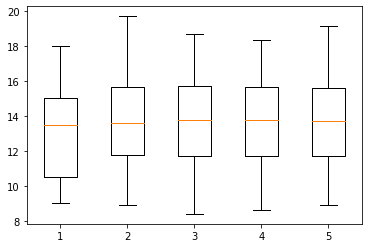

In [172]:
plt.boxplot([y1_trad, y1_lr, y1_xgbr, y1_rfr, y1_dnn])
plt.show()

## comparison of xgbr with other models

In [ ]:
# PALS guideline (3* ETT)
y_pals = 3 * y_test_old
y1_trad = y_pals
y2_trad = (y_pals >= y_test-1) & (y_pals <= y_test+1)

# PALS guideline (age/2 + 12)
# 주의할 것은 scaler 하기 전의 x_test 이용
y_pals = x_test[:,0]/2 + 12
y1_trad = y_pals
y2_trad = (y_pals >= y_test-1) & (y_pals <= y_test+1)

In [61]:
OLD_VAR = 'old_depth1'
# OLD_VAR = 'old_tube_size'
df[OLD_VAR] = df['age'] / 2 + 12
#df[OLD_VAR] = df['age'].apply(lambda x: x / 2 + 12 if x >= 2 else (11 if x > 1 else (10 if x > 0.5 else 9))) 
#df[OLD_VAR] = df.apply(lambda x: x[OLD_VAR] - 0.5 if x['cuffed'] else x[OLD_VAR], axis=1)
y_old = df[[OLD_VAR]].values.flatten().astype(float)
y1_test_age = y_old[-ntest:]

# accuracy
y2_test_age = ((y1_test_age >= y_test-1) & (y1_test_age <= y_test+1))

In [136]:
mean_absolute_error(y_test, y1_rfr)
mean_squared_error(y_test, y1_rfr)

0.8900281448739935

In [173]:
print('정규성 검사###')
# 정규성 검사(Shapiro-Wilk test) -> p>0.05면 모수 검정 (paired t-test) / p<0.05면 비모수 검정 (Wilcoxon signed rank test)
print(f'정규성 검사(PALS-age): {stats.shapiro(y1_test_age)}')
print(f'정규성 검사(lr): {stats.shapiro(y1_lr)}')
print(f'정규성 검사(gbrt): {stats.shapiro(y1_xgbr)}')
print(f'정규성 검사(rf): {stats.shapiro(y1_rfr)}')
print(f'정규성 검사(dnn): {stats.shapiro(y1_dnn)}')

정규성 검사###
정규성 검사(PALS-age): ShapiroResult(statistic=0.8721907138824463, pvalue=0.0)
정규성 검사(lr): ShapiroResult(statistic=0.9743871688842773, pvalue=6.651271285314234e-30)
정규성 검사(gbrt): ShapiroResult(statistic=0.9725634455680847, pvalue=8.34908216287355e-31)
정규성 검사(rf): ShapiroResult(statistic=0.97161865234375, pvalue=2.9704629397821526e-31)
정규성 검사(dnn): ShapiroResult(statistic=0.971954882144928, pvalue=4.277690710721431e-31)


/home/painstudy/.local/lib/python3.8/site-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [138]:
print('정규성 검사###')
# 정규성 검사(Shapiro-Wilk test) -> p>0.05면 모수 검정 (paired t-test) / p<0.05면 비모수 검정 (Wilcoxon signed rank test)
print(f'정규성 검사(PALS-age): {stats.shapiro(y1_test_age-y_test)}')
print(f'정규성 검사(lr): {stats.shapiro(y1_lr-y_test)}')
print(f'정규성 검사(gbrt): {stats.shapiro(y1_xgbr-y_test)}')
print(f'정규성 검사(rf): {stats.shapiro(y1_rfr-y_test)}')
print(f'정규성 검사(dnn): {stats.shapiro(y1_dnn-y_test)}')

정규성 검사###
정규성 검사(PALS-age): ShapiroResult(statistic=0.9796998500823975, pvalue=5.815806149519956e-27)
정규성 검사(lr): ShapiroResult(statistic=0.9994586706161499, pvalue=0.12326577305793762)
정규성 검사(gbrt): ShapiroResult(statistic=0.9991958141326904, pvalue=0.013922978192567825)
정규성 검사(rf): ShapiroResult(statistic=0.9976188540458679, pvalue=2.1709675479542057e-07)
정규성 검사(dnn): ShapiroResult(statistic=0.9992423057556152, pvalue=0.020537137985229492)


/home/painstudy/.local/lib/python3.8/site-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [41]:
# 정규성을 따르지 않을 경우, 비모수 방법인 Wilcoxon signed rank test 이용
stats.wilcoxon(abs(y1_xgbr-y_test), abs(y1_rfr-y_test))

WilcoxonResult(statistic=7034454.0, pvalue=0.4637222210753674)

In [40]:
# 정규성을 따르지 않을 경우, 비모수 방법인 Wilcoxon signed rank test 이용
stats.wilcoxon((y1_xgbr-y_test), (y1_rfr-y_test))

WilcoxonResult(statistic=7086750.0, pvalue=0.7887770187952234)

In [28]:
# 정규성을 따르지 않을 경우, 비모수 방법인 Wilcoxon signed rank test 이용
stats.wilcoxon(abs(y1_xgbr-y_test), abs(y1_dnn-y_test))

WilcoxonResult(statistic=6921949.0, pvalue=0.08314350401957928)

In [42]:
# 정규성을 따르지 않을 경우, 비모수 방법인 Wilcoxon signed rank test 이용
stats.wilcoxon((y1_xgbr-y_test), (y1_dnn-y_test))

WilcoxonResult(statistic=4099918.0, pvalue=2.0848216655887976e-158)

In [37]:
np.mean(y1_xgbr-y_test)

0.01784991829755045

In [44]:
err1 = (y1_xgbr-y_test)
err2 = (y1_dnn-y_test)

In [46]:
np.max(err1-err2)

0.9458351135253906

In [179]:
from scipy import stats


# dtype 똑같이 맞쳐줘야 함
ttest = stats.ttest_rel(y1_xgbr, y1_dnn)
print('\n###Comparison of traditional formula and gbrt for depth (paired t-test)###')
print(f'Paired t-test result: {ttest}')


obs2 = pd.DataFrame({'traditional': [np.sum(y2_dnn), np.sum(~y2_dnn)], 'gbrt': [np.sum(y2_xgbr),np.sum(~y2_xgbr)]})
obs2.index = ['1', '0']

chiresult = chi2_contingency(obs2, correction=False)
print('\n###Comparison of traditional formula and gbrt for size accuracy3###')
print(f'contingency table:\n{obs2}')
print('Chi square: {}'.format(chiresult[0]))
print('P-value: {}'.format(chiresult[1]))


###Comparison of traditional formula and gbrt for depth (paired t-test)###
Paired t-test result: Ttest_relResult(statistic=22.145163679159854, pvalue=4.9964664596590144e-104)

###Comparison of traditional formula and gbrt for size accuracy3###
contingency table:
   traditional  gbrt
1         3887  3889
0         1448  1446
Chi square: 0.00189657329909192
P-value: 0.9652633753140466


## comparison within three machine learning models

In [53]:
# one-way ANOVA
print('\n###Comparison of three machine learning models for depth (one-way anova)###')
# 정규성 & 등분산성 검사
print(f'정규성 검사(gbrt): {stats.shapiro(y1_xgbr)}')
print(f'정규성 검사(rf): {stats.shapiro(y1_rfr)}')
print(f'정규성 검사(dnn): {stats.shapiro(y1_dnn)}')
print(f'등분산성 검사: {stats.bartlett(y1_xgbr, y1_rfr, y1_dnn)}\n')

F, p = stats.f_oneway(y1_xgbr, y1_rfr, y1_dnn)
print('F-Ratio: {}'.format(F),'p-value:{}'.format(p), sep = '\n')

from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

df_depth = pd.concat([pd.DataFrame({'depth': y1_xgbr, 'group': 1}),pd.DataFrame({'depth': y1_rfr, 'group': 2}), pd.DataFrame({'depth': y1_dnn, 'group': 3})])
model = ols('depth ~ C(group)', df_depth).fit()
anova_lm(model)


# chi-square
# contingency table : 또는 pd.crosstab 이용 
obs2 = pd.DataFrame({'gbrt': [np.sum(y2_xgbr),np.sum(~y2_xgbr)], 'rf': [np.sum(y2_rfr),np.sum(~y2_rfr)], 'dnn': [np.sum(y2_dnn),np.sum(~y2_dnn)]})
obs2.index = ['1', '0']


chiresult = chi2_contingency(obs2, correction=False)
print('\n\n###Comparison of three machine learning models for depth accuracy###')
print(f'contingency table:\n{obs2}')
print('Chi square: {}'.format(chiresult[0]))
print('P-value: {}'.format(chiresult[1]))


###Comparison of three machine learning models for depth (one-way anova)###
정규성 검사(gbrt): ShapiroResult(statistic=0.9725634455680847, pvalue=8.34908216287355e-31)
정규성 검사(rf): ShapiroResult(statistic=0.9422603845596313, pvalue=1.8628861784734118e-41)
정규성 검사(dnn): ShapiroResult(statistic=0.971954882144928, pvalue=4.277690710721431e-31)
등분산성 검사: BartlettResult(statistic=9.453136132893153, pvalue=0.008856814941190115)

F-Ratio: 0.7622007744313527
p-value:0.4666552708718935


###Comparison of three machine learning models for depth accuracy###
contingency table:
   gbrt    rf   dnn
1  3889  3748  3887
0  1446  1587  1448
Chi square: 12.151503618076275
P-value: 0.0022979179410742164


/home/painstudy/.local/lib/python3.8/site-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [68]:
from itertools import combinations

df = obs2.transpose()
all_combinations = list(combinations(df.index, 2))
p_vals = []
for comb in all_combinations:
    # subset df into a dataframe containing only the pair "comb"
    new_df = df[(df.index == comb[0]) | (df.index == comb[1])]
    # running chi2 test
    chi2, p, dof, ex = chi2_contingency(new_df, correction=True)
    p_vals.append(p)
    

from statsmodels.sandbox.stats.multicomp import multipletests

reject_list, corrected_p_vals = multipletests(p_vals, method='fdr_bh',alpha=0.05)[:2]

print("model-model\toriginal p-value\tcorrected p-value\treject?")
for p_val, corr_p_val, reject, comb in zip(p_vals, corrected_p_vals, reject_list, all_combinations):
    print(f'{comb[0]}-{comb[1]} \t{p_val} \t{corr_p_val} \t{reject}')

model-model	original p-value	corrected p-value	reject?
gbrt-rf 	0.002657732201178917 	0.0045956573383017195 	True
gbrt-dnn 	0.9826275702851097 	0.9826275702851097 	False
rf-dnn 	0.0030637715588678126 	0.0045956573383017195 	True


In [56]:
from statsmodels.sandbox.stats.multicomp import MultiComparison

# ANOVA 사후 분석
## Turkey HSD 방식
comp = MultiComparison(df_depth['depth'], df_depth['group'])
result = comp.tukeyhsd()
result.summary()

group1,group2,meandiff,p-adj,lower,upper,reject
1,2,0.0012,0.9,-0.1086,0.1111,False
1,3,-0.0495,0.5396,-0.1593,0.0604,False
2,3,-0.0507,0.5244,-0.1605,0.0591,False


In [57]:
## BONFERRONI 방식
comp = MultiComparison(df_depth['depth'], df_depth['group'])
tbl, a1, a2 = comp.allpairtest(stats.ttest_ind, method= "bonf")
tbl

group1,group2,stat,pval,pval_corr,reject
1,2,-0.0268,0.9786,1.0,False
1,3,1.0434,0.2968,0.8903,False
2,3,1.0865,0.2773,0.8318,False


Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     1      2   0.0012    0.9 -0.1086 0.1111  False
     1      3  -0.0495 0.5396 -0.1593 0.0604  False
     2      3  -0.0507 0.5244 -0.1605 0.0591  False
---------------------------------------------------


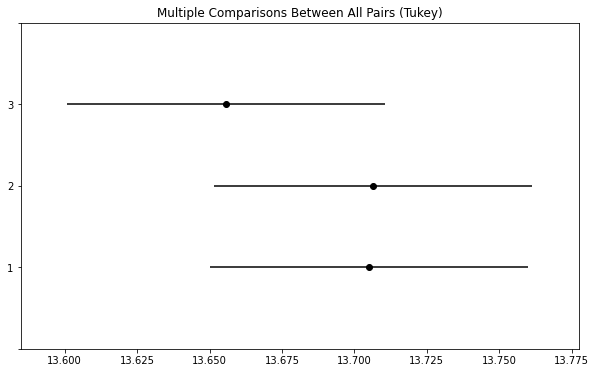

In [60]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

posthoc = pairwise_tukeyhsd(df_depth['depth'], df_depth['group'], alpha=0.05)
print(posthoc)

fig = posthoc.plot_simultaneous()

In [28]:
from scipy import stats

# compare with age-based formula and GBRT model
y1_trad = y_pals
y2_trad = (y_pals >= y_test-1) & (y_pals <= y_test+1)


ttest = stats.ttest_rel(y1_xgbr, y1_trad)
print('\n###Comparison of traditional formula and gbrt for depth (paired t-test)###')
print(f'Paired t-test result: {ttest}')


obs2 = pd.DataFrame({'traditional': [np.sum(y2_trad), np.sum(~y2_trad)], 'gbrt': [np.sum(y2_xgbr),np.sum(~y2_xgbr)]})
obs2.index = ['1', '0']

chiresult = chi2_contingency(obs2, correction=False)
print('\n###Comparison of traditional formula and gbrt for size accuracy3###')
print(f'contingency table:\n{obs2}')
print('Chi square: {}'.format(chiresult[0]))
print('P-value: {}'.format(chiresult[1]))


###Comparison of traditional formula and gbrt for depth (paired t-test)###
Paired t-test result: Ttest_relResult(statistic=50.44209699181703, pvalue=0.0)

###Comparison of traditional formula and gbrt for size accuracy3###
contingency table:
   traditional  gbrt
1         3223  3889
0         2112  1446
Chi square: 187.03168480415496
P-value: 1.413436671767675e-42


In [ ]:
stats.ttest_rel(y_test_old, y_xgbr)

# Sensitivity analyses

In [79]:
# 0: age, 1: sex, 2: weight, 3: height
# importance : age > weight > height > sex 순서
#X_train = x_train[:,0:1]
#X_test = x_test[:,0:1]
X_train = np.concatenate((x_train[:,0:1], x_train[:,2:3]),axis=-1)
X_test = np.concatenate((x_test[:,0:1], x_test[:,2:3]),axis=-1)

print(f'X_train: {X_train.shape}, X_test: {X_test.shape}')

X_train: (21344, 1), X_test: (5335, 1)


In [3]:
X_train = x_train.copy()
X_train[:,0] = np.array([math.floor(ele) for ele in X_train[:,0]])

X_test = x_test.copy()
X_test[:,0] = np.array([math.floor(ele) for ele in X_test[:,0]])

In [4]:
# 길이 제한 없는 경우
from sklearn.metrics import mean_absolute_error

# age (일단위)
param_dict = {
                'learning_rate': [ 0.05, 0.07, 0.1], #[0.01, 0.03, 0.05],
                'max_depth': [3, 4, 5, 7],#[3,4,5],
                'n_estimators': [25, 50, 100, 200, 300],
                #'n_estimators': [100],#[25, 50, 75, 100],
                #'n_estimators': [50],
                'subsample': [0.5, 0.8, 1], #[0.5, 0.8, 1],
                'colsample_bytree': [0.5, 0.8], #[0.8, 1],
                #'gamma': [0.9], #[0.3, 0.5, 0.7, 0.9],
                #'scale_pos_weight': [5, 10], #[1,10,30,100]
            }
nfold = 10
gs = GridSearchCV(estimator=xgb.sklearn.XGBRegressor(),
                    n_jobs=-1,
                    verbose=2,
                    param_grid=param_dict, cv=nfold)
gs.fit(X_train, y_train)
model = gs.best_estimator_.get_booster()

print()
print("========= found hyperparameter =========")
print(gs.best_params_)
print(gs.best_score_)
print("========================================")

y_pred = gs.predict(X_test).flatten()
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print('--------------')
print('new model')
print('--------------')
print(f'explained_variance_score: {explained_variance_score(y_test, y_pred):.3f}')
print(f'mean_squared_errors: {mse:.3f}')
print(f'mean_absolute_errors: {mae:.3f}')
print(f'r2_score: {r2_score(y_test, y_pred):.3f}')
# accuracy
acc3 = np.mean((y_pred >= y_test-1) & (y_pred <= y_test+1))
print(f'acc(+-1cm): {acc3:.3f}')

Fitting 10 folds for each of 360 candidates, totalling 3600 fits
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=25, subsample=1; total time=   1.0s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=100, subsample=0.8; total time=   0.8s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=3, n_estimators=300, subsample=0.5; total time=   2.4s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=4, n_estimators=50, subsample=0.8; total time=   0.5s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=4, n_estimators=100, subsample=0.5; total time=   1.0s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=4, n_estimators=200, subsample=0.8; total time=   1.9s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=25, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, n_estimators=25, subsample=0.8; total time=   0.3s
[CV] END cols

In [5]:
# save model
odir_f = f'mae-{mae:.3f}_mse-{mse:.3f}_XGBR-age(floor)+weight+height_{nfold}fold'
odir = f'result/outliers+w+h/depth/sens_analysis/{odir_f}'
if not os.path.exists(odir):
    os.mkdir(odir)
model.save_model(f'{odir}/model.model')
pickle.dump(gs, open(f'{odir}/gridSearch','wb'))

# 모델에 대한 정보 txt로 저장
pickle.dump(param_dict, open(f'{odir}/param_dict', 'wb'))
f = open(f'{odir}/result.txt', 'w')
f.write(f'classification model')
f.write(f'explained_variance_score: {explained_variance_score(y_test, y_pred):.3f}')
f.write(f'mean_squared_errors: {mean_squared_error(y_test, y_pred):.3f}')
f.write(f'mean_absolute_errors: {mean_absolute_error(y_test, y_pred):.3f}')
f.write(f'r2_score: {r2_score(y_test, y_pred):.3f}')
f.close()

[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=50, subsample=1; total time=   0.9s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=100, subsample=0.8; total time=   1.9s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=200, subsample=1; total time=   3.5s
[CV] END colsample_bytree=0.8, learning_rate=0.07, max_depth=5, n_estimators=25, subsample=1; total time=   0.3s
[CV] END colsample_bytree=0.8, learning_rate=0.07, max_depth=5, n_estimators=50, subsample=0.5; total time=   0.7s
[CV] END colsample_bytree=0.8, learning_rate=0.07, max_depth=5, n_estimators=50, subsample=1; total time=   0.7s
[CV] END colsample_bytree=0.8, learning_rate=0.07, max_depth=5, n_estimators=100, subsample=0.8; total time=   1.4s
[CV] END colsample_bytree=0.8, learning_rate=0.07, max_depth=5, n_estimators=200, subsample=1; total time=   2.6s
[CV] END colsample_bytree=0.8, learning_rate=0.07, max_depth=7, n_estimators=25, subsampl

### test validation

In [80]:
# xgbr model
xgbr = xgb.XGBRegressor()
odir_f = f'mae-0.769_mse-0.926_XGBR-age_10fold/model.model'
odir = f'result/outliers+w+h/depth/sens_analysis/{odir_f}'
xgbr.load_model(odir)


y1_xgbrs, y2_xgbrs, y3_xgbrs = [], [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(X_test))])
    X1_test = X_test[mask]
    Y1_test = y_test[mask]
    
    y_xgbr = xgbr.predict(X1_test)
    y1_xgbrs.append(mean_absolute_error(y_xgbr, Y1_test))
    y2_xgbrs.append(mean_squared_error(y_xgbr, Y1_test)**0.5)
    y3_xgbrs.append(np.mean((y_xgbr >= Y1_test-1) & (y_xgbr <= Y1_test+1)))
    
print(f'mae: {np.mean(y1_xgbrs):.3f}+-{1.96*np.std(y1_xgbrs):.3f} -> {np.mean(y1_xgbrs)-1.96*np.std(y1_xgbrs):.3f} ~ {np.mean(y1_xgbrs)+1.96*np.std(y1_xgbrs):.3f}')
print(f'rmse: {np.mean(y2_xgbrs):.3f}+-{1.96*np.std(y2_xgbrs):.3f} -> {np.mean(y2_xgbrs)-1.96*np.std(y2_xgbrs):.3f} ~ {np.mean(y2_xgbrs)+1.96*np.std(y2_xgbrs):.3f}')
print(f'acc(+-1cm): {np.mean(y3_xgbrs):.3f}+-{1.96*np.std(y3_xgbrs):.3f} -> {np.mean(y3_xgbrs)-1.96*np.std(y3_xgbrs):.3f} ~ {np.mean(y3_xgbrs)+1.96*np.std(y3_xgbrs):.3f} ')

/home/painstudy/.local/lib/python3.8/site-packages/xgboost/sklearn.py:782: UserWarning: Loading a native XGBoost model with Scikit-Learn interface.
  warnings.warn("Loading a native XGBoost model with Scikit-Learn interface.")


mae: 0.769+-0.016 -> 0.753 ~ 0.785
rmse: 0.963+-0.017 -> 0.945 ~ 0.980
acc(+-1cm): 0.695+-0.013 -> 0.682 ~ 0.709 


### p-value

In [64]:
from scipy.stats import chi2_contingency
from scipy import stats

# xgbr0 model
xgbr = xgb.XGBRegressor()
xgbr.load_model('result/outliers+w+h/depth/sens_analysis/mae-0.720_mse-0.814_XGBR-a+w+h+s_10fold/model.model')
y_xgbr0 = xgbr.predict(x_test)

                           
# xgbr model
#X_test = np.concatenate((x_test[:,0:1], x_test[:,2:3]),axis=-1)
X_test = x_test.copy()
X_test[:,0] = np.array([math.floor(ele) for ele in X_test[:,0]])

xgbr = xgb.XGBRegressor()
xgbr.load_model('result/outliers+w+h/depth/sens_analysis/mae-0.723_mse-0.816_XGBR-age(floor)+weight+height_10fold/model.model')
y_xgbr1 = xgbr.predict(X_test)

/home/painstudy/.local/lib/python3.8/site-packages/xgboost/sklearn.py:782: UserWarning: Loading a native XGBoost model with Scikit-Learn interface.
  warnings.warn("Loading a native XGBoost model with Scikit-Learn interface.")


In [8]:
# 정규성을 따르지 않을 경우, 비모수 방법인 Wilcoxon signed rank test 이용
stats.wilcoxon(abs(y_xgbr1-y_test), abs(y_xgbr0-y_test))

WilcoxonResult(statistic=6899304.5, pvalue=0.05311235013465998)

# Subgroup analysis

In [50]:
# xgbr model
xgbr = xgb.XGBRegressor()
xgbr.load_model('result/outliers+w+h/depth/mae-0.720_mse-0.814_XGBR-4inputs_10fold/model.model')
y_xgbr = xgbr.predict(x_test)

## age group

In [15]:
from sklearn.metrics import mean_squared_error

acc1s, acc3s = [], []

# neonate
sub_mask = x_test[:,0]<1/12

y_pred1 = y_xgbr[sub_mask]
Y_test = y_test[sub_mask]
Y_test1 = Y_test

# accuracy
acc13 = ((y_pred1 >= Y_test-1) & (y_pred1 <= Y_test+1))

print('###newborns###')
print(f'mae: {mean_absolute_error(y_pred1, Y_test):.3f}, rmse: {mean_squared_error(y_pred1, Y_test)**0.5:.3f}')
print(f'acc(+-1cm): {np.mean(acc13):.3f}\n')


# infant
sub_mask = (x_test[:,0]<1)&(x_test[:,0]>1/12)

y_pred2 = y_xgbr[sub_mask]
Y_test = y_test[sub_mask]
Y_test2 = Y_test

# accuracy
acc23 = ((y_pred2 >= Y_test-1) & (y_pred2 <= Y_test+1))

print('###newborns###')
print(f'mae: {mean_absolute_error(y_pred2, Y_test):.3f}, rmse: {mean_squared_error(y_pred2, Y_test)**0.5:.3f}')
print(f'acc(+-1cm): {np.mean(acc23):.3f}\n')


# the others
sub_mask = x_test[:,0]>1

y_pred3 = y_xgbr[sub_mask]
Y_test = y_test[sub_mask]
Y_test3 = Y_test

# accuracy
acc33 = ((y_pred3 >= Y_test-1) & (y_pred3 <= Y_test+1))

print('###newborns###')
print(f'mae: {mean_absolute_error(y_pred3, Y_test):.3f}, rmse: {mean_squared_error(y_pred3, Y_test)**0.5:.3f}')
print(f'acc(+-1cm): {np.mean(acc33):.3f}\n')

###newborns###
mae: 0.513, rmse: 0.670
acc(+-1cm): 0.898

###newborns###
mae: 0.645, rmse: 0.812
acc(+-1cm): 0.779

###newborns###
mae: 0.757, rmse: 0.941
acc(+-1cm): 0.703



### test validation

In [53]:
acc1s, acc3s = [], []

# neonate
sub_mask = x_test[:,0]<1/12
x1_test = x_test[sub_mask]
y1_test = y_test[sub_mask]

y1_xgbrs, y2_xgbrs = [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x1_test))])
    X1_test = x1_test[mask]
    Y_test = y1_test[mask]
    
    y_xgbr = xgbr.predict(X1_test)
    y1_xgbrs.append(mean_absolute_error(y_xgbr, Y_test))
    y2_xgbrs.append(mean_squared_error(y_xgbr, Y_test)**0.5)
    
print('###newborns###')
print(f'mae: {np.mean(y1_xgbrs):.3f}+-{1.96*np.std(y1_xgbrs):.3f} -> {np.mean(y1_xgbrs)-1.96*np.std(y1_xgbrs):.3f} ~ {np.mean(y1_xgbrs)+1.96*np.std(y1_xgbrs):.3f}')
print(f'rmse: {np.mean(y2_xgbrs):.3f}+-{1.96*np.std(y2_xgbrs):.3f} -> {np.mean(y2_xgbrs)-1.96*np.std(y2_xgbrs):.3f} ~ {np.mean(y2_xgbrs)+1.96*np.std(y2_xgbrs):.3f} ')


# infant
sub_mask = (x_test[:,0]<=1)&(x_test[:,0]>1/12)
x1_test = x_test[sub_mask]
y1_test = y_test[sub_mask]

y1_xgbrs, y2_xgbrs = [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x1_test))])
    X1_test = x1_test[mask]
    Y_test = y1_test[mask]
    
    y_xgbr = xgbr.predict(X1_test)
    y1_xgbrs.append(mean_absolute_error(y_xgbr, Y_test))
    y2_xgbrs.append(mean_squared_error(y_xgbr, Y_test)**0.5)
    
print('\n###infants (1/12mo<age<=1yr)###')
print(f'mae: {np.mean(y1_xgbrs):.3f}+-{1.96*np.std(y1_xgbrs):.3f} -> {np.mean(y1_xgbrs)-1.96*np.std(y1_xgbrs):.3f} ~ {np.mean(y1_xgbrs)+1.96*np.std(y1_xgbrs):.3f}')
print(f'rmse: {np.mean(y2_xgbrs):.3f}+-{1.96*np.std(y2_xgbrs):.3f} -> {np.mean(y2_xgbrs)-1.96*np.std(y2_xgbrs):.3f} ~ {np.mean(y2_xgbrs)+1.96*np.std(y2_xgbrs):.3f} ')


# the others
sub_mask = x_test[:,0]>1
x1_test = x_test[sub_mask]
y1_test = y_test[sub_mask]

y1_xgbrs, y2_xgbrs = [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x1_test))])
    X1_test = x1_test[mask]
    Y_test = y1_test[mask]
    
    y_xgbr = xgbr.predict(X1_test)
    y1_xgbrs.append(mean_absolute_error(y_xgbr, Y_test))
    y2_xgbrs.append(mean_squared_error(y_xgbr, Y_test)**0.5)
    
print('\n###others(age>1yr)###')
print(f'mae: {np.mean(y1_xgbrs):.3f}+-{1.96*np.std(y1_xgbrs):.3f} -> {np.mean(y1_xgbrs)-1.96*np.std(y1_xgbrs):.3f} ~ {np.mean(y1_xgbrs)+1.96*np.std(y1_xgbrs):.3f}')
print(f'rmse: {np.mean(y2_xgbrs):.3f}+-{1.96*np.std(y2_xgbrs):.3f} -> {np.mean(y2_xgbrs)-1.96*np.std(y2_xgbrs):.3f} ~ {np.mean(y2_xgbrs)+1.96*np.std(y2_xgbrs):.3f} ')

###newborns###
mae: 0.514+-0.065 -> 0.449 ~ 0.579
rmse: 0.669+-0.106 -> 0.562 ~ 0.775 

###infants (1/12mo<age<=1yr)###
mae: 0.644+-0.025 -> 0.618 ~ 0.669
rmse: 0.810+-0.031 -> 0.779 ~ 0.840 

###others(age>1yr)###
mae: 0.757+-0.019 -> 0.738 ~ 0.776
rmse: 0.941+-0.021 -> 0.920 ~ 0.963 


### ANOVA

In [16]:
# one-way ANOVA
print('\n###Comparison of three age groups for depth (one-way anova)###')
# 정규성 & 등분산성 검사
print(f'정규성 검사(gbrt): {stats.shapiro(y_pred1)}')
print(f'정규성 검사(rf): {stats.shapiro(y_pred2)}')
print(f'정규성 검사(dnn): {stats.shapiro(y_pred3)}')
print(f'등분산성 검사: {stats.bartlett(y_pred1, y_pred2, y_pred3)}\n')

F, p = stats.f_oneway(abs(y_pred1-Y_test1), abs(y_pred2-Y_test2), abs(y_pred3-Y_test3))
print('F-Ratio: {}'.format(F),'p-value:{}'.format(p), sep = '\n')

from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

df_depth = pd.concat([pd.DataFrame({'depth': y_pred1, 'group': 1}),pd.DataFrame({'depth': y_pred2, 'group': 2}), pd.DataFrame({'depth': y_pred3, 'group': 3})])
model = ols('depth ~ C(group)', df_depth).fit()
anova_lm(model)


# chi-square
# contingency table : 또는 pd.crosstab 이용 
obs2 = pd.DataFrame({'gbrt': [np.sum(acc13),np.sum(~acc13)], 'rf': [np.sum(acc23),np.sum(~acc23)], 'dnn': [np.sum(acc33),np.sum(~acc33)]})
obs2.index = ['1', '0']


chiresult = chi2_contingency(obs2, correction=False)
print('\n\n###Comparison of three machine learning models for depth accuracy###')
print(f'contingency table:\n{obs2}')
print('Chi square: {}'.format(chiresult[0]))
print('P-value: {}'.format(chiresult[1]))


###Comparison of three age groups for depth (one-way anova)###
정규성 검사(gbrt): ShapiroResult(statistic=0.9433740377426147, pvalue=1.7682614270597696e-06)
정규성 검사(rf): ShapiroResult(statistic=0.9791439175605774, pvalue=4.3091799659805696e-13)
정규성 검사(dnn): ShapiroResult(statistic=0.964897871017456, pvalue=1.7813747585129447e-29)
등분산성 검사: BartlettResult(statistic=1205.127384097421, pvalue=2.0413315504379054e-262)

F-Ratio: 34.670656157123176
p-value:1.0959549953543789e-15


###Comparison of three machine learning models for depth accuracy###
contingency table:
   gbrt    rf   dnn
1   159  1055  2675
0    18   299  1129
Chi square: 55.7385884128716
P-value: 7.879874698098256e-13


### Kruskal-Wallis test
* 비모수 검정을 해야하므로 사실 one-way ANOVA가 아니라 이 검정을 해야 함 

In [ ]:
# Kruskal-Wallis test
print('\n###Comparison of three age groups for depth (Kruskal-Wallis test)###')
# 정규성 & 등분산성 검사
print(f'정규성 검사(gbrt): {stats.shapiro(y_pred1)}')
print(f'정규성 검사(rf): {stats.shapiro(y_pred2)}')
print(f'정규성 검사(dnn): {stats.shapiro(y_pred3)}')
print(f'등분산성 검사: {stats.bartlett(y_pred1, y_pred2, y_pred3)}\n')

F, p = stats.f_oneway(abs(y_pred1-Y_test1), abs(y_pred2-Y_test2), abs(y_pred3-Y_test3))
print('F-Ratio: {}'.format(F),'p-value:{}'.format(p), sep = '\n')

from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

stats.kruskal(abs(y_pred1-Y_test1), abs(y_pred2-Y_test2), abs(y_pred3-Y_test3))
print(result)

df_depth = pd.concat([pd.DataFrame({'depth': y_pred1, 'group': 1}),pd.DataFrame({'depth': y_pred2, 'group': 2}), pd.DataFrame({'depth': y_pred3, 'group': 3})])
model = ols('depth ~ C(group)', df_depth).fit()
anova_lm(model)


## cuff group

In [19]:
from sklearn.metrics import mean_squared_error

acc1s, acc3s = [], []

# cuffed
sub_mask = x_test[:,4]==1

y_pred1 = y_xgbr[sub_mask]
Y_test = y_test[sub_mask]
Y_test1 = Y_test

# accuracy
acc13 = ((y_pred1 >= Y_test-1) & (y_pred1 <= Y_test+1))

print('###cuffed###')
print(f'mae: {mean_absolute_error(y_pred1, Y_test):.3f}, rmse: {mean_squared_error(y_pred1, Y_test)**0.5:.3f}')
print(f'acc(+-1cm): {np.mean(acc13):.3f}\n')


# uncuffed
sub_mask = x_test[:,4]==0

y_pred2 = y_xgbr[sub_mask]
Y_test = y_test[sub_mask]
Y_test2 = Y_test

# accuracy
acc23 = ((y_pred2 >= Y_test-1) & (y_pred2 <= Y_test+1))

print('###uncuffed###')
print(f'mae: {mean_absolute_error(y_pred2, Y_test):.3f}, rmse: {mean_squared_error(y_pred2, Y_test)**0.5:.3f}')
print(f'acc(+-1cm): {np.mean(acc23):.3f}\n')

###cuffed###
mae: 0.733, rmse: 0.921
acc(+-1cm): 0.716

###uncuffed###
mae: 0.716, rmse: 0.895
acc(+-1cm): 0.734



In [56]:
acc1s, acc3s = [], []

x_test4 = x_test[:,0:4]

# cuffed
sub_mask = x_test[:,4] == 1
x1_test = x_test4[sub_mask]
y1_test = y_test[sub_mask]

y1_xgbrs, y2_xgbrs = [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x1_test))])
    X1_test = x1_test[mask]
    Y_test = y1_test[mask]
    
    y_xgbr = xgbr.predict(X1_test)
    y1_xgbrs.append(mean_absolute_error(y_xgbr, Y_test))
    y2_xgbrs.append(mean_squared_error(y_xgbr, Y_test)**0.5)
    
print('###cuffed###')
print(f'mae: {np.mean(y1_xgbrs):.3f}+-{1.96*np.std(y1_xgbrs):.3f} -> {np.mean(y1_xgbrs)-1.96*np.std(y1_xgbrs):.3f} ~ {np.mean(y1_xgbrs)+1.96*np.std(y1_xgbrs):.3f}')
print(f'rmse: {np.mean(y2_xgbrs):.3f}+-{1.96*np.std(y2_xgbrs):.3f} -> {np.mean(y2_xgbrs)-1.96*np.std(y2_xgbrs):.3f} ~ {np.mean(y2_xgbrs)+1.96*np.std(y2_xgbrs):.3f} ')


# infant
sub_mask = x_test[:,4]==0
x1_test = x_test4[sub_mask]
y1_test = y_test[sub_mask]

y1_xgbrs, y2_xgbrs = [], []
for i in range(200):
    
    mask = np.array([random.randint(0,1)==1 for j in range(len(x1_test))])
    X1_test = x1_test[mask]
    Y_test = y1_test[mask]
    
    y_xgbr = xgbr.predict(X1_test)
    y1_xgbrs.append(mean_absolute_error(y_xgbr, Y_test))
    y2_xgbrs.append(mean_squared_error(y_xgbr, Y_test)**0.5)
    
print('\n###uncuffed###')
print(f'mae: {np.mean(y1_xgbrs):.3f}+-{1.96*np.std(y1_xgbrs):.3f} -> {np.mean(y1_xgbrs)-1.96*np.std(y1_xgbrs):.3f} ~ {np.mean(y1_xgbrs)+1.96*np.std(y1_xgbrs):.3f}')
print(f'rmse: {np.mean(y2_xgbrs):.3f}+-{1.96*np.std(y2_xgbrs):.3f} -> {np.mean(y2_xgbrs)-1.96*np.std(y2_xgbrs):.3f} ~ {np.mean(y2_xgbrs)+1.96*np.std(y2_xgbrs):.3f} ')

###cuffed###
mae: 0.732+-0.031 -> 0.701 ~ 0.763
rmse: 0.920+-0.037 -> 0.882 ~ 0.957 

###uncuffed###
mae: 0.715+-0.017 -> 0.698 ~ 0.733
rmse: 0.895+-0.020 -> 0.875 ~ 0.915 


### Wilcoxon signed rank test

In [10]:
acc1s, acc3s = [], []

x_test4 = x_test[:,0:4]

# cuffed
sub_mask = x_test[:,4] == 1
x1_test = x_test4[sub_mask]
y1_test = y_test[sub_mask]

y1_xgbr = xgbr.predict(x1_test)


# uncuffed
sub_mask = x_test[:,4]==0
x1_test = x_test4[sub_mask]
y2_test = y_test[sub_mask]

y2_xgbr = xgbr.predict(x1_test)

In [11]:
from scipy import stats, interp

# 정규성을 따르지 않을 경우, 비모수 방법인 Wilcoxon signed rank test 이용
stats.wilcoxon(abs(y1_xgbr-y1_test), abs(y2_xgbr-y2_test))

ValueError: The samples x and y must have the same length.

In [14]:
y2_xgbr

array([16.51141 , 12.603206, 14.264152, ..., 11.766949, 14.541611,
       15.063565], dtype=float32)

In [15]:
stats.ranksums(y1_xgbr-y1_test, y2_xgbr-y2_test)

RanksumsResult(statistic=-2.6733136702587212, pvalue=0.007510598697688999)

# SHAP
* SHAP 할때는 커널을 numba로 바꿔서 하기 (머신러닝 모델은 keras 커널에서 진행)

In [5]:
import shap
import xgboost as xgb
import numpy as np
import random, os, datetime, pickle
import pandas as pd


# xgbr에 내장된 함수 이용
xgbr = xgb.XGBRegressor()
#xgbr.load_model('result/outliers+w+h/size/acc1-0.621_acc3-0.982_XGBR_5inputs_10fold/model.model')
xgbr.load_model('result/outliers+w+h/depth/mae-0.720_mse-0.814_XGBR-4inputs_10fold/model.model')

shap.initjs()
explainer = shap.TreeExplainer(xgbr)
shap_values = explainer.shap_values(x_train)

/home/painstudy/anaconda3/envs/numbaenv/lib/python3.6/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading a native XGBoost model with Scikit-Learn interface.


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


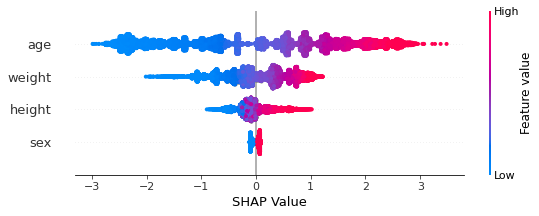

In [7]:
INPUT_VARS = ['age','sex','weight','height']

X_train = pd.DataFrame(x_train, columns=INPUT_VARS)

shap.summary_plot(shap_values, X_train, show=False)
plt.xlabel('SHAP Value')
plt.savefig("figures/Fig4_b_depth_SHAP.png", dpi=600)
plt.show()

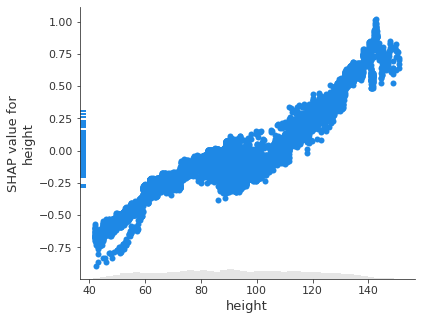

In [13]:
shap_xgb = explainer(X_train)
shap.plots.scatter(shap_xgb[:,'height'], dot_size = None, show=False)
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.savefig("figures/Fig5_h_height.pdf", dpi=600)

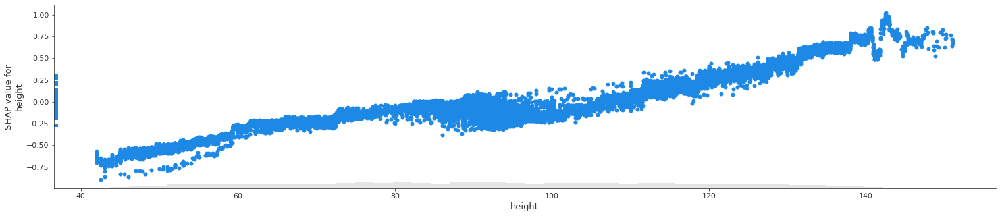

In [14]:
shap.plots.scatter(shap_xgb[:,'height'], dot_size = None, show=False)

# method 1
_, h = plt.gcf().get_size_inches()
plt.gcf().set_size_inches(h*5, h)

# method 2

In [15]:
h

5.0

In [ ]:
shap.plots.scatter(shap_xgb[:,'sex'], x_jitter=0.1, dot_size = None, show=False)
plt.xticks([0,1], ['female', 'male'])
plt.savefig("figures/Fig5_f_cuffed.png", dpi=600)
plt.show()